### Code to pre-process DBT and obtain central slice to train the model. 

Input: 
- csv of paths and bounding boxes

Output 
- image files of central slices (cut to the breast area and flipped if Right image).
- csv with bounding boxes of lesions. 

In [3]:
import os

%matplotlib inline
import matplotlib.pyplot as plt

from duke_dbt_data import dcmread_image, read_boxes, draw_box

# imports 
import omidb
import numpy as np
import cv2
import csv


In [4]:
base_path = "/mnt/mia_images/breast/DBT-Challenge"
df = read_boxes(boxes_fp=base_path+"/BCS-DBT boxes-train.csv", filepaths_fp=base_path+"/BCS-DBT file-paths-train.csv")

In [5]:
print(df)

      PatientID    StudyUID  View  Subject  Slice     X     Y  Width  Height  \
0    DBT-P00013  DBT-S00163  rmlo        0     16  1116  1724    218     105   
1    DBT-P00024  DBT-S03255   lcc        0     19   267   488     64      64   
2    DBT-P00024  DBT-S03255   lcc        0     37   169   384     93      85   
3    DBT-P00024  DBT-S03255  lmlo        0     11   471  1060     67      56   
4    DBT-P00024  DBT-S03255  lmlo        0     12   640   673     93      80   
..          ...         ...   ...      ...    ...   ...   ...    ...     ...   
219  DBT-P05030  DBT-S05569  rmlo        2     24  1465   624     84     115   
220  DBT-P05047  DBT-S05588   rcc        0     41  1341  1073    387     499   
221  DBT-P05047  DBT-S05588  rmlo        0     41  1192  1019    456     541   
222  DBT-P05056  DBT-S01839   rcc        0     44  1642   661    245     392   
223  DBT-P05056  DBT-S01839  rmlo        0     22  1167   499    439     315   

      Class  AD                        

In [6]:
output_path = '/home/robert/data/DBT'
output_folder = '/train'
# create folders
try:
    os.mkdir(output_path)     
except OSError as e:
    if (e.errno != 17): 
        print("copy_case: creation of %s failed" % output_path)
        print(e)
try: 
    os.mkdir(output_path+output_folder)
#    os.mkdir(output_path+output_folder) todo: save lesion patches. 
    
except OSError as e:
    if (e.errno != 17): 
        print("copy_case: creation of %s failed" % output_path)
        print(e)


In [7]:
def get_normal_BBox (image,bbox):
    #threshold image 
    img = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY)[1]  # ensure binary
#     plt.imshow(img,'gray')#,vmin=0,vmax=255))
#     plt.show()
    nb_components, output, stats, centroids = cv2.connectedComponentsWithStats(img, connectivity=4)
    sizes = stats[:, -1]
    max_label = 1
    max_size = sizes[1]
    for i in range(2, nb_components):
        if sizes[i] > max_size:
            max_label = i
            max_size = sizes[i]
    img2 = np.zeros(output.shape,dtype=np.uint8)
    img2[output == max_label] = 255
#     plt.imshow(img2,'gray')
#     plt.show()
#     input("Press Enter to continue...")
    contours, hierarchy = cv2.findContours(img2,cv2.RETR_TREE,cv2.CHAIN_APPROX_NONE)

    cnt = contours[0]
    aux_im = img2
    x,y,w,h = cv2.boundingRect(cnt)
    cv2.rectangle(aux_im,(x,y),(x+w,y+h),(255,0,0),5)
    plt.imshow(aux_im)
    plt.show()
    #input("Press Enter to continue...")
    out_bbox = omidb.mark.BoundingBox(x, y, x+w, y+h)
    
    return out_bbox, img2 # returns bounding box and mask image. 

In [8]:
def copy_case(view, client, episode,image,side, bbox_roi, slice_index):
    
    filename =client+"_"+episode+"_"+view+"_"+str(slice_index)+".png"
    print(filename)
#   Assuming windowWidth has been already applied (see Duke code)    
#     if 'WindowWidth' in image.dcm:
#         #print('Image hs windowing')
#         image_2d = apply_voi_lut(image.dcm.pixel_array, image.dcm)
#     else: image_2d = image.dcm.pixel_array
    # Rescaling grey scale between 0-255
   
    dims = image.shape
    image_2d_scaled = (np.maximum(image,0) / image.max()) * 255.0

    # Convert to uint
    image_2d_scaled = np.uint8(image_2d_scaled)
    if (side=='r' or side=='R'): # flip image and ROI coordinates.
        image_2d_scaled =cv2.flip(image_2d_scaled, 1)
        aux = bbox_roi.x2 
        bbox_roi.x2 = dims[1]-bbox_roi.x1 
        bbox_roi.x1 = dims[1]-aux 
        print("bbox_roi",bbox_roi)

    dims = image_2d_scaled.shape
    print("dimension",dims)

    aux_folder = output_path+output_folder+"/"+ filename
    bbox,mask = get_normal_BBox(image_2d_scaled,bbox_roi)
    print(bbox)

    print(aux_folder)        
    # Write the PNG file
    image_crop = image_2d_scaled[bbox.y1:bbox.y2,bbox.x1:bbox.x2]
    cv2.imwrite(aux_folder,image_crop)
    
    # adapt bbox_ROI to new cropped image (remove bbox.x1 and bbox.y1)
    bbox_roi.x1 = bbox_roi.x1 - bbox.x1
    bbox_roi.y1 = bbox_roi.y1 - bbox.y1
    bbox_roi.x2 = bbox_roi.x2 - bbox.x1
    bbox_roi.y2 = bbox_roi.y2 - bbox.y1
    
    cv2.rectangle(image_crop,(bbox_roi.x1,bbox_roi.y1),(bbox_roi.x2,bbox_roi.y2),(255,0,0),5)
    plt.imshow(image_crop)
    plt.show()
    
    # write CSV 
    with open(output_path+'/train_bboxes.csv', 'a+', newline='') as file:
        writer = csv.writer(file)
        writer.writerow([client, episode, filename, side, bbox,  slice_index, bbox_roi,])
        
    
               

## Generate training images

PatientID                                                  DBT-P00013
StudyUID                                                   DBT-S00163
View                                                             rmlo
Subject                                                             0
Slice                                                              16
X                                                                1116
Y                                                                1724
Width                                                             218
Height                                                            105
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00013/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00013/1.2.826...
Name: 0, dtype: object
<class 'numpy.ndarray'>
DBT-P00013_DBT-S00163_rmlo_16.png
bbox_roi 

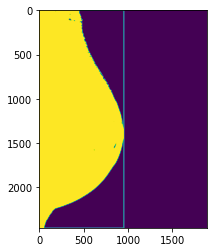

BoundingBox(x1=0, y1=0, x2=954, y2=2457)
/home/robert/data/DBT/train/DBT-P00013_DBT-S00163_rmlo_16.png


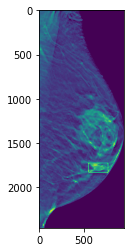

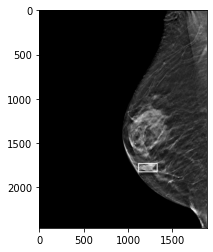

PatientID                                                  DBT-P00024
StudyUID                                                   DBT-S03255
View                                                              lcc
Subject                                                             0
Slice                                                              19
X                                                                 267
Y                                                                 488
Width                                                              64
Height                                                             64
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00024/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00024/1.2.826...
Name: 1, dtype: object
<class 'numpy.ndarray'>
DBT-P00024_DBT-S03255_lcc_19.png
dimension 

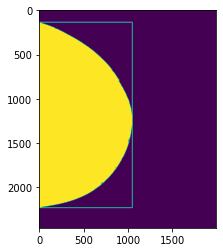

BoundingBox(x1=0, y1=137, x2=1052, y2=2227)
/home/robert/data/DBT/train/DBT-P00024_DBT-S03255_lcc_19.png


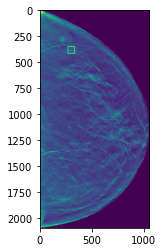

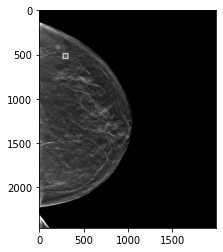

PatientID                                                  DBT-P00024
StudyUID                                                   DBT-S03255
View                                                              lcc
Subject                                                             0
Slice                                                              37
X                                                                 169
Y                                                                 384
Width                                                              93
Height                                                             85
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00024/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00024/1.2.826...
Name: 2, dtype: object
<class 'numpy.ndarray'>
DBT-P00024_DBT-S03255_lcc_37.png
dimension 

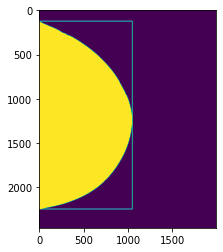

BoundingBox(x1=0, y1=125, x2=1052, y2=2242)
/home/robert/data/DBT/train/DBT-P00024_DBT-S03255_lcc_37.png


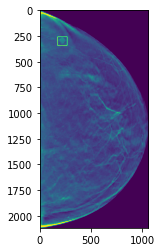

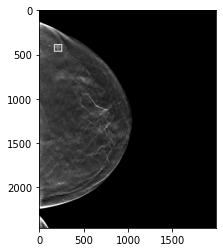

PatientID                                                  DBT-P00024
StudyUID                                                   DBT-S03255
View                                                             lmlo
Subject                                                             0
Slice                                                              11
X                                                                 471
Y                                                                1060
Width                                                              67
Height                                                             56
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00024/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00024/1.2.826...
Name: 3, dtype: object
<class 'numpy.ndarray'>
DBT-P00024_DBT-S03255_lmlo_11.png
dimension

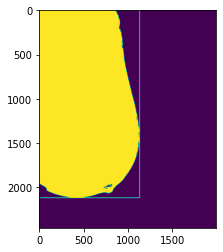

BoundingBox(x1=0, y1=0, x2=1134, y2=2115)
/home/robert/data/DBT/train/DBT-P00024_DBT-S03255_lmlo_11.png


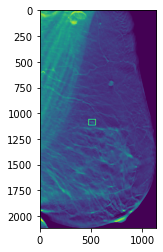

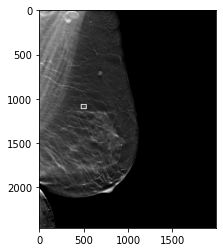

PatientID                                                  DBT-P00024
StudyUID                                                   DBT-S03255
View                                                             lmlo
Subject                                                             0
Slice                                                              12
X                                                                 640
Y                                                                 673
Width                                                              93
Height                                                             80
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00024/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00024/1.2.826...
Name: 4, dtype: object
<class 'numpy.ndarray'>
DBT-P00024_DBT-S03255_lmlo_12.png
dimension

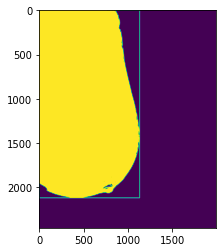

BoundingBox(x1=0, y1=0, x2=1134, y2=2116)
/home/robert/data/DBT/train/DBT-P00024_DBT-S03255_lmlo_12.png


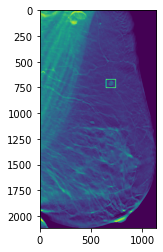

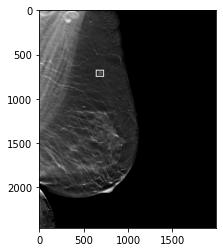

PatientID                                                  DBT-P00060
StudyUID                                                   DBT-S00787
View                                                              rcc
Subject                                                             0
Slice                                                              21
X                                                                1276
Y                                                                 672
Width                                                             228
Height                                                            219
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00060/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00060/1.2.826...
Name: 5, dtype: object
<class 'numpy.ndarray'>
DBT-P00060_DBT-S00787_rcc_21.png
bbox_roi B

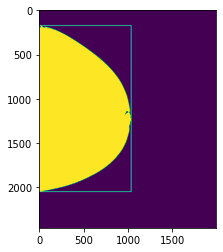

BoundingBox(x1=0, y1=174, x2=1039, y2=2046)
/home/robert/data/DBT/train/DBT-P00060_DBT-S00787_rcc_21.png


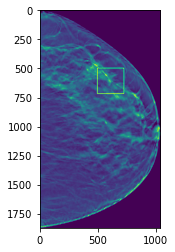

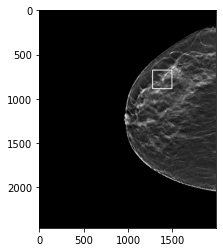

PatientID                                                  DBT-P00107
StudyUID                                                   DBT-S05365
View                                                              lcc
Subject                                                             0
Slice                                                              34
X                                                                   0
Y                                                                1148
Width                                                             205
Height                                                            449
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00107/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00107/1.2.826...
Name: 6, dtype: object
<class 'numpy.ndarray'>
DBT-P00107_DBT-S05365_lcc_34.png
dimension 

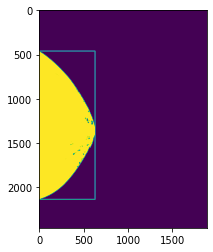

BoundingBox(x1=0, y1=462, x2=630, y2=2133)
/home/robert/data/DBT/train/DBT-P00107_DBT-S05365_lcc_34.png


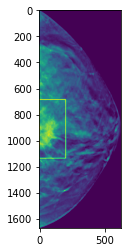

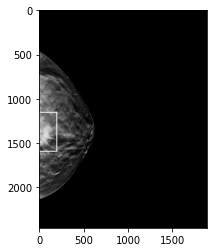

PatientID                                                  DBT-P00107
StudyUID                                                   DBT-S05365
View                                                             lmlo
Subject                                                             0
Slice                                                              45
X                                                                  13
Y                                                                 729
Width                                                             629
Height                                                            665
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00107/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00107/1.2.826...
Name: 7, dtype: object
<class 'numpy.ndarray'>
DBT-P00107_DBT-S05365_lmlo_45.png
dimension

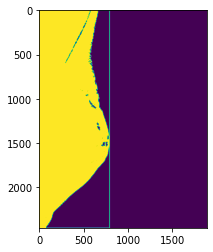

BoundingBox(x1=0, y1=0, x2=793, y2=2457)
/home/robert/data/DBT/train/DBT-P00107_DBT-S05365_lmlo_45.png


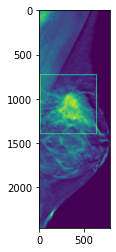

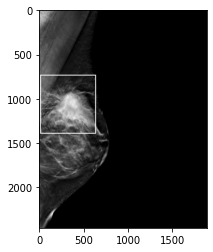

PatientID                                                  DBT-P00194
StudyUID                                                   DBT-S00645
View                                                             rmlo
Subject                                                             0
Slice                                                              35
X                                                                1347
Y                                                                1730
Width                                                             268
Height                                                            255
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00194/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00194/1.2.826...
Name: 8, dtype: object
<class 'numpy.ndarray'>
DBT-P00194_DBT-S00645_rmlo_35.png
bbox_roi 

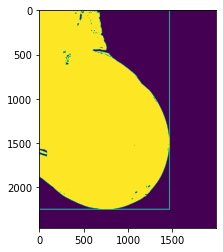

BoundingBox(x1=0, y1=0, x2=1471, y2=2245)
/home/robert/data/DBT/train/DBT-P00194_DBT-S00645_rmlo_35.png


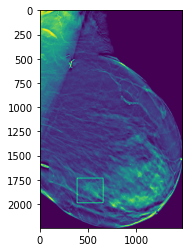

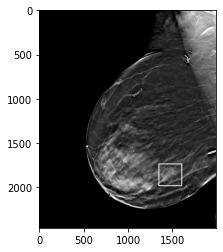

PatientID                                                  DBT-P00225
StudyUID                                                   DBT-S02346
View                                                              lcc
Subject                                                             0
Slice                                                              54
X                                                                 266
Y                                                                1180
Width                                                             323
Height                                                            254
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00225/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00225/1.2.826...
Name: 9, dtype: object
<class 'numpy.ndarray'>
DBT-P00225_DBT-S02346_lcc_54.png
dimension 

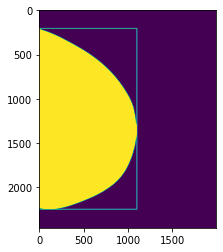

BoundingBox(x1=0, y1=207, x2=1103, y2=2245)
/home/robert/data/DBT/train/DBT-P00225_DBT-S02346_lcc_54.png


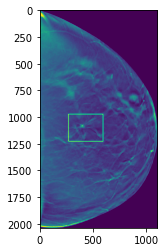

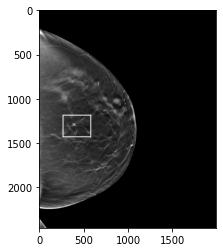

PatientID                                                  DBT-P00225
StudyUID                                                   DBT-S02346
View                                                             lmlo
Subject                                                             0
Slice                                                              52
X                                                                 423
Y                                                                 758
Width                                                             301
Height                                                            279
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00225/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00225/1.2.826...
Name: 10, dtype: object
<class 'numpy.ndarray'>
DBT-P00225_DBT-S02346_lmlo_52.png
dimensio

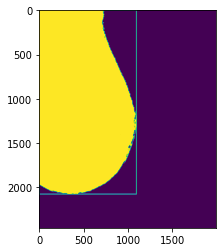

BoundingBox(x1=0, y1=0, x2=1098, y2=2074)
/home/robert/data/DBT/train/DBT-P00225_DBT-S02346_lmlo_52.png


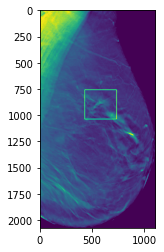

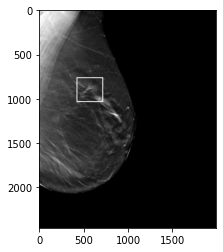

PatientID                                                  DBT-P00303
StudyUID                                                   DBT-S02436
View                                                              rcc
Subject                                                             0
Slice                                                              21
X                                                                1411
Y                                                                1080
Width                                                             124
Height                                                             92
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00303/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00303/1.2.826...
Name: 11, dtype: object
<class 'numpy.ndarray'>
DBT-P00303_DBT-S02436_rcc_21.png
bbox_roi 

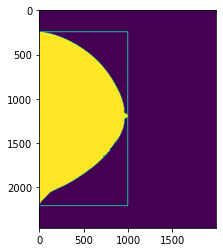

BoundingBox(x1=0, y1=244, x2=1000, y2=2204)
/home/robert/data/DBT/train/DBT-P00303_DBT-S02436_rcc_21.png


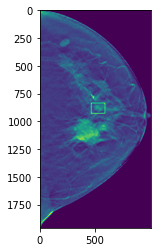

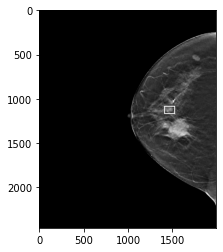

PatientID                                                  DBT-P00303
StudyUID                                                   DBT-S02436
View                                                              rcc
Subject                                                             0
Slice                                                              26
X                                                                1713
Y                                                                 478
Width                                                             121
Height                                                            105
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00303/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00303/1.2.826...
Name: 12, dtype: object
<class 'numpy.ndarray'>
DBT-P00303_DBT-S02436_rcc_26.png
bbox_roi 

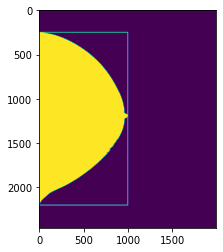

BoundingBox(x1=0, y1=251, x2=1000, y2=2198)
/home/robert/data/DBT/train/DBT-P00303_DBT-S02436_rcc_26.png


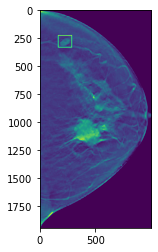

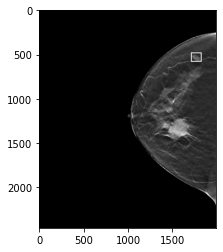

PatientID                                                  DBT-P00303
StudyUID                                                   DBT-S02436
View                                                              rcc
Subject                                                             0
Slice                                                              29
X                                                                1380
Y                                                                1216
Width                                                             344
Height                                                            271
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00303/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00303/1.2.826...
Name: 13, dtype: object
<class 'numpy.ndarray'>
DBT-P00303_DBT-S02436_rcc_29.png
bbox_roi 

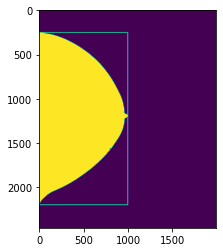

BoundingBox(x1=0, y1=253, x2=1000, y2=2194)
/home/robert/data/DBT/train/DBT-P00303_DBT-S02436_rcc_29.png


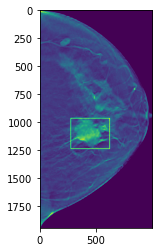

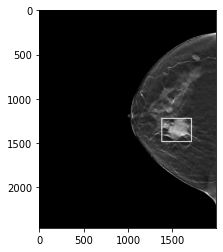

PatientID                                                  DBT-P00303
StudyUID                                                   DBT-S02436
View                                                             rmlo
Subject                                                             0
Slice                                                              14
X                                                                1536
Y                                                                 543
Width                                                             102
Height                                                             87
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00303/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00303/1.2.826...
Name: 14, dtype: object
<class 'numpy.ndarray'>
DBT-P00303_DBT-S02436_rmlo_14.png
bbox_roi

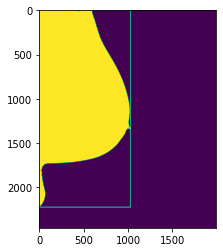

BoundingBox(x1=0, y1=0, x2=1031, y2=2221)
/home/robert/data/DBT/train/DBT-P00303_DBT-S02436_rmlo_14.png


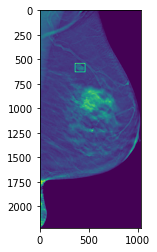

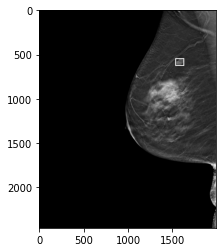

PatientID                                                  DBT-P00303
StudyUID                                                   DBT-S02436
View                                                             rmlo
Subject                                                             0
Slice                                                              26
X                                                                1231
Y                                                                 878
Width                                                             128
Height                                                            119
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00303/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00303/1.2.826...
Name: 15, dtype: object
<class 'numpy.ndarray'>
DBT-P00303_DBT-S02436_rmlo_26.png
bbox_roi

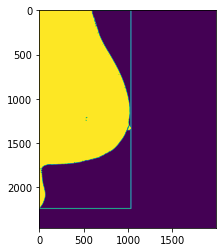

BoundingBox(x1=0, y1=0, x2=1036, y2=2236)
/home/robert/data/DBT/train/DBT-P00303_DBT-S02436_rmlo_26.png


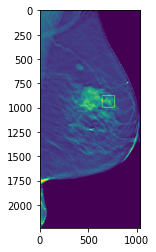

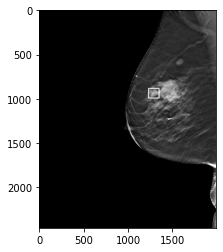

PatientID                                                  DBT-P00303
StudyUID                                                   DBT-S02436
View                                                             rmlo
Subject                                                             0
Slice                                                              36
X                                                                1341
Y                                                                 764
Width                                                             253
Height                                                            279
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00303/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00303/1.2.826...
Name: 16, dtype: object
<class 'numpy.ndarray'>
DBT-P00303_DBT-S02436_rmlo_36.png
bbox_roi

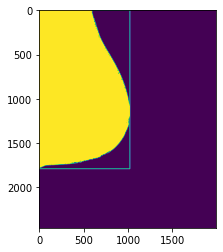

BoundingBox(x1=0, y1=0, x2=1024, y2=1788)
/home/robert/data/DBT/train/DBT-P00303_DBT-S02436_rmlo_36.png


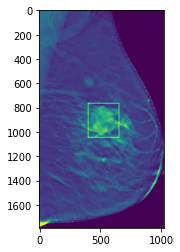

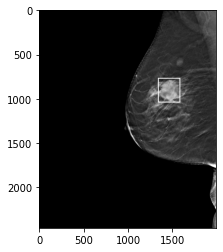

PatientID                                                  DBT-P00361
StudyUID                                                   DBT-S00216
View                                                              rcc
Subject                                                             0
Slice                                                              17
X                                                                1396
Y                                                                1041
Width                                                             254
Height                                                            267
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00361/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00361/1.2.826...
Name: 17, dtype: object
<class 'numpy.ndarray'>
DBT-P00361_DBT-S00216_rcc_17.png
bbox_roi 

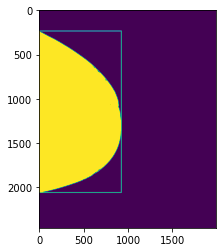

BoundingBox(x1=0, y1=236, x2=928, y2=2056)
/home/robert/data/DBT/train/DBT-P00361_DBT-S00216_rcc_17.png


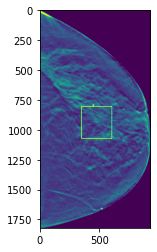

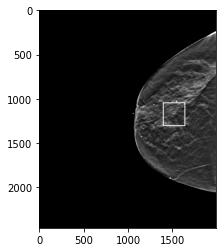

PatientID                                                  DBT-P00361
StudyUID                                                   DBT-S00216
View                                                             rmlo
Subject                                                             0
Slice                                                              25
X                                                                1393
Y                                                                1011
Width                                                             223
Height                                                            184
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00361/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00361/1.2.826...
Name: 18, dtype: object
<class 'numpy.ndarray'>
DBT-P00361_DBT-S00216_rmlo_25.png
bbox_roi

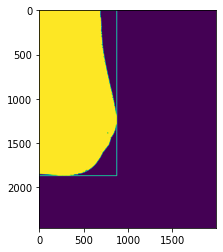

BoundingBox(x1=0, y1=0, x2=876, y2=1866)
/home/robert/data/DBT/train/DBT-P00361_DBT-S00216_rmlo_25.png


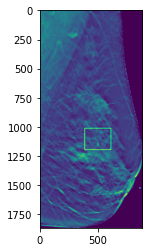

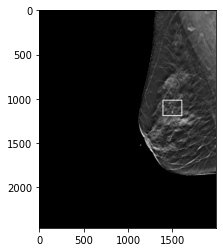

PatientID                                                  DBT-P00538
StudyUID                                                   DBT-S01986
View                                                              lcc
Subject                                                             2
Slice                                                              36
X                                                                  69
Y                                                                1483
Width                                                             117
Height                                                             65
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00538/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00538/1.2.826...
Name: 19, dtype: object
<class 'numpy.ndarray'>
DBT-P00538_DBT-S01986_lcc_36.png
dimension

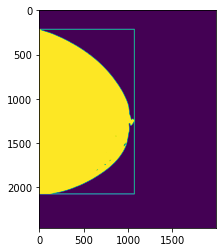

BoundingBox(x1=0, y1=217, x2=1075, y2=2072)
/home/robert/data/DBT/train/DBT-P00538_DBT-S01986_lcc_36.png


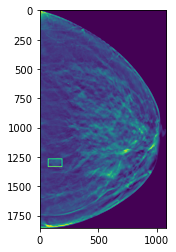

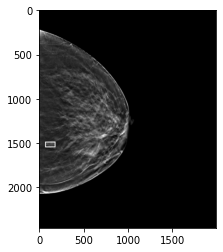

PatientID                                                  DBT-P00538
StudyUID                                                   DBT-S01986
View                                                             lmlo
Subject                                                             2
Slice                                                              42
X                                                                 198
Y                                                                1015
Width                                                             120
Height                                                             89
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00538/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00538/1.2.826...
Name: 20, dtype: object
<class 'numpy.ndarray'>
DBT-P00538_DBT-S01986_lmlo_42.png
dimensio

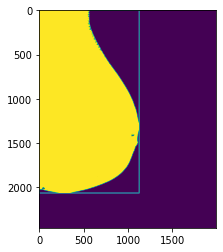

BoundingBox(x1=0, y1=0, x2=1129, y2=2062)
/home/robert/data/DBT/train/DBT-P00538_DBT-S01986_lmlo_42.png


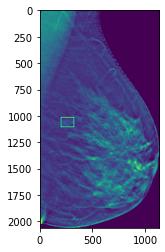

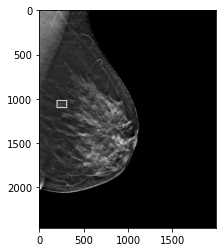

PatientID                                                  DBT-P00538
StudyUID                                                   DBT-S01986
View                                                              rcc
Subject                                                             2
Slice                                                              26
X                                                                1512
Y                                                                1267
Width                                                             112
Height                                                            149
Class                                                          cancer
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00538/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00538/1.2.826...
Name: 21, dtype: object
<class 'numpy.ndarray'>
DBT-P00538_DBT-S01986_rcc_26.png
bbox_roi 

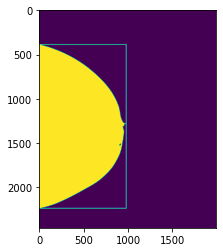

BoundingBox(x1=0, y1=388, x2=983, y2=2234)
/home/robert/data/DBT/train/DBT-P00538_DBT-S01986_rcc_26.png


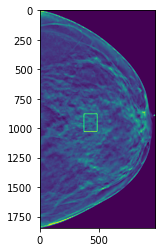

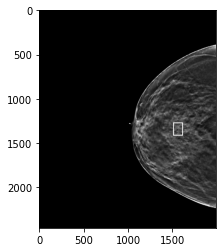

PatientID                                                  DBT-P00538
StudyUID                                                   DBT-S01986
View                                                              rcc
Subject                                                             2
Slice                                                              38
X                                                                1369
Y                                                                1340
Width                                                             138
Height                                                            131
Class                                                          cancer
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00538/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00538/1.2.826...
Name: 22, dtype: object
<class 'numpy.ndarray'>
DBT-P00538_DBT-S01986_rcc_38.png
bbox_roi 

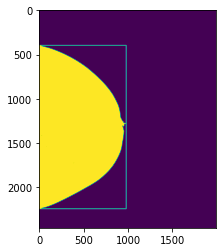

BoundingBox(x1=0, y1=398, x2=983, y2=2239)
/home/robert/data/DBT/train/DBT-P00538_DBT-S01986_rcc_38.png


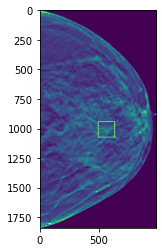

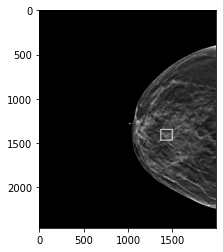

PatientID                                                  DBT-P00538
StudyUID                                                   DBT-S01986
View                                                             rmlo
Subject                                                             2
Slice                                                              37
X                                                                1269
Y                                                                1389
Width                                                              97
Height                                                             97
Class                                                          cancer
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00538/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00538/1.2.826...
Name: 23, dtype: object
<class 'numpy.ndarray'>
DBT-P00538_DBT-S01986_rmlo_37.png
bbox_roi

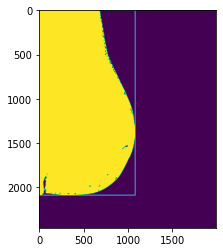

BoundingBox(x1=0, y1=0, x2=1084, y2=2086)
/home/robert/data/DBT/train/DBT-P00538_DBT-S01986_rmlo_37.png


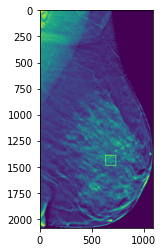

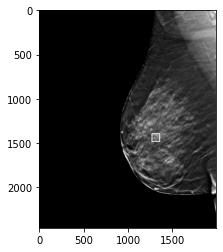

PatientID                                                  DBT-P00538
StudyUID                                                   DBT-S01986
View                                                             rmlo
Subject                                                             2
Slice                                                              44
X                                                                1140
Y                                                                1353
Width                                                              94
Height                                                            100
Class                                                          cancer
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00538/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00538/1.2.826...
Name: 24, dtype: object
<class 'numpy.ndarray'>
DBT-P00538_DBT-S01986_rmlo_44.png
bbox_roi

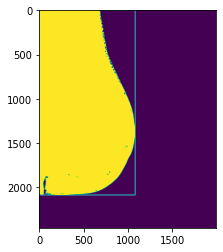

BoundingBox(x1=0, y1=0, x2=1084, y2=2084)
/home/robert/data/DBT/train/DBT-P00538_DBT-S01986_rmlo_44.png


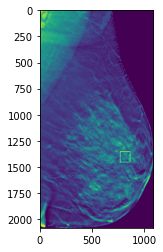

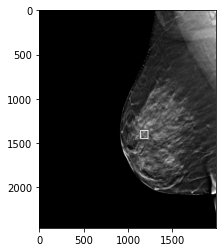

PatientID                                                  DBT-P00583
StudyUID                                                   DBT-S00852
View                                                              lcc
Subject                                                             0
Slice                                                              33
X                                                                 176
Y                                                                1057
Width                                                             598
Height                                                            369
Class                                                          cancer
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00583/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00583/1.2.826...
Name: 25, dtype: object
<class 'numpy.ndarray'>
DBT-P00583_DBT-S00852_lcc_33.png
dimension

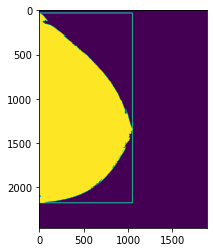

BoundingBox(x1=0, y1=33, x2=1051, y2=2172)
/home/robert/data/DBT/train/DBT-P00583_DBT-S00852_lcc_33.png


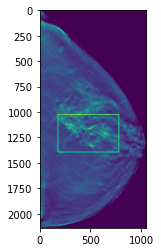

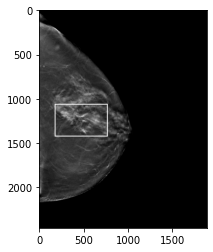

PatientID                                                  DBT-P00583
StudyUID                                                   DBT-S00852
View                                                             lmlo
Subject                                                             0
Slice                                                              31
X                                                                 321
Y                                                                1092
Width                                                             574
Height                                                            261
Class                                                          cancer
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00583/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00583/1.2.826...
Name: 26, dtype: object
<class 'numpy.ndarray'>
DBT-P00583_DBT-S00852_lmlo_31.png
dimensio

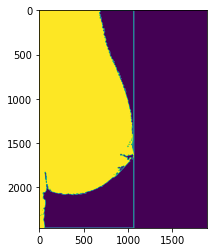

BoundingBox(x1=0, y1=0, x2=1066, y2=2457)
/home/robert/data/DBT/train/DBT-P00583_DBT-S00852_lmlo_31.png


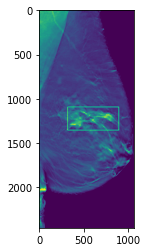

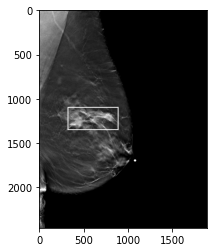

PatientID                                                  DBT-P00654
StudyUID                                                   DBT-S02571
View                                                              lcc
Subject                                                             2
Slice                                                              44
X                                                                 764
Y                                                                 807
Width                                                             274
Height                                                            301
Class                                                          cancer
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00654/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00654/1.2.826...
Name: 27, dtype: object
<class 'numpy.ndarray'>
DBT-P00654_DBT-S02571_lcc_44.png
dimension

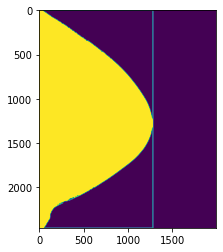

BoundingBox(x1=0, y1=0, x2=1284, y2=2457)
/home/robert/data/DBT/train/DBT-P00654_DBT-S02571_lcc_44.png


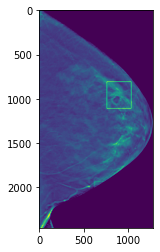

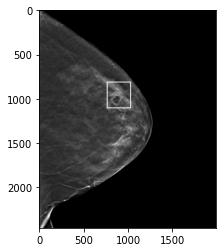

PatientID                                                  DBT-P00684
StudyUID                                                   DBT-S02691
View                                                              lcc
Subject                                                             2
Slice                                                              15
X                                                                 347
Y                                                                1416
Width                                                             270
Height                                                            219
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00684/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00684/1.2.826...
Name: 28, dtype: object
<class 'numpy.ndarray'>
DBT-P00684_DBT-S02691_lcc_15.png
dimension

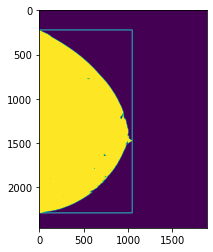

BoundingBox(x1=0, y1=224, x2=1048, y2=2286)
/home/robert/data/DBT/train/DBT-P00684_DBT-S02691_lcc_15.png


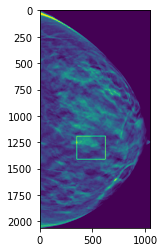

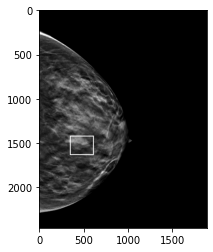

PatientID                                                  DBT-P00684
StudyUID                                                   DBT-S02691
View                                                             lmlo
Subject                                                             2
Slice                                                               6
X                                                                 318
Y                                                                1715
Width                                                             221
Height                                                            232
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00684/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00684/1.2.826...
Name: 29, dtype: object
<class 'numpy.ndarray'>
DBT-P00684_DBT-S02691_lmlo_6.png
dimension

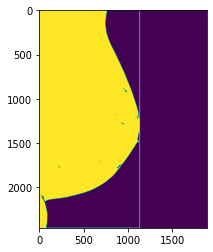

BoundingBox(x1=0, y1=0, x2=1131, y2=2457)
/home/robert/data/DBT/train/DBT-P00684_DBT-S02691_lmlo_6.png


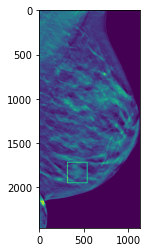

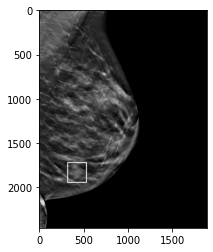

PatientID                                                  DBT-P00784
StudyUID                                                   DBT-S05205
View                                                              rcc
Subject                                                             0
Slice                                                              19
X                                                                1492
Y                                                                1379
Width                                                             105
Height                                                             85
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00784/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00784/1.2.826...
Name: 30, dtype: object
<class 'numpy.ndarray'>
DBT-P00784_DBT-S05205_rcc_19.png
bbox_roi 

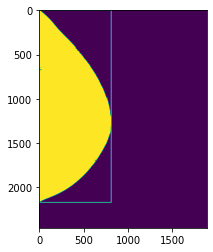

BoundingBox(x1=0, y1=0, x2=812, y2=2168)
/home/robert/data/DBT/train/DBT-P00784_DBT-S05205_rcc_19.png


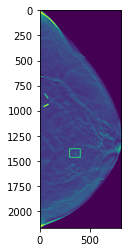

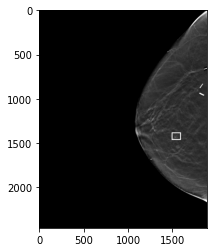

PatientID                                                  DBT-P00784
StudyUID                                                   DBT-S05205
View                                                              rcc
Subject                                                             0
Slice                                                              20
X                                                                1528
Y                                                                1510
Width                                                              68
Height                                                             68
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00784/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00784/1.2.826...
Name: 31, dtype: object
<class 'numpy.ndarray'>
DBT-P00784_DBT-S05205_rcc_20.png
bbox_roi 

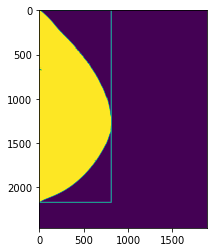

BoundingBox(x1=0, y1=0, x2=812, y2=2167)
/home/robert/data/DBT/train/DBT-P00784_DBT-S05205_rcc_20.png


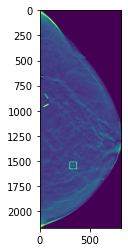

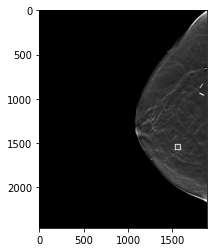

PatientID                                                  DBT-P00784
StudyUID                                                   DBT-S05205
View                                                             rmlo
Subject                                                             0
Slice                                                              27
X                                                                1415
Y                                                                1418
Width                                                              81
Height                                                             85
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00784/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00784/1.2.826...
Name: 32, dtype: object
<class 'numpy.ndarray'>
DBT-P00784_DBT-S05205_rmlo_27.png
bbox_roi

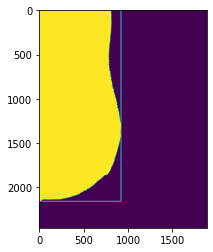

BoundingBox(x1=0, y1=0, x2=922, y2=2155)
/home/robert/data/DBT/train/DBT-P00784_DBT-S05205_rmlo_27.png


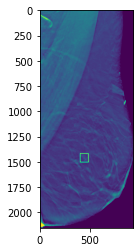

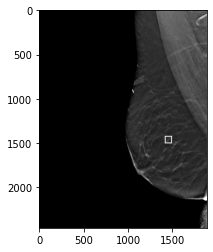

PatientID                                                  DBT-P00818
StudyUID                                                   DBT-S02315
View                                                              rcc
Subject                                                             0
Slice                                                              44
X                                                                 600
Y                                                                1242
Width                                                             233
Height                                                            201
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00818/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00818/1.2.826...
Name: 33, dtype: object
<class 'numpy.ndarray'>
DBT-P00818_DBT-S02315_rcc_44.png
bbox_roi 

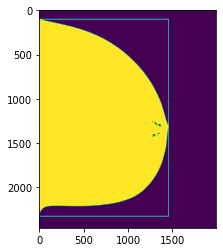

BoundingBox(x1=0, y1=103, x2=1460, y2=2324)
/home/robert/data/DBT/train/DBT-P00818_DBT-S02315_rcc_44.png


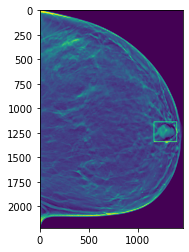

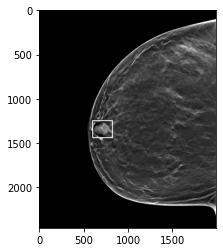

PatientID                                                  DBT-P00818
StudyUID                                                   DBT-S02315
View                                                             rmlo
Subject                                                             0
Slice                                                              42
X                                                                 571
Y                                                                1335
Width                                                             225
Height                                                            222
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00818/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00818/1.2.826...
Name: 34, dtype: object
<class 'numpy.ndarray'>
DBT-P00818_DBT-S02315_rmlo_42.png
bbox_roi

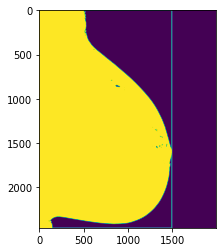

BoundingBox(x1=0, y1=0, x2=1497, y2=2457)
/home/robert/data/DBT/train/DBT-P00818_DBT-S02315_rmlo_42.png


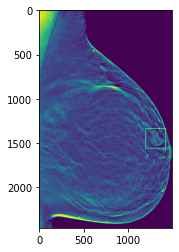

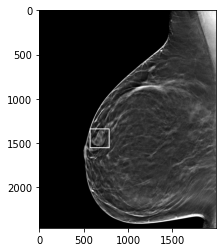

PatientID                                                  DBT-P00827
StudyUID                                                   DBT-S01731
View                                                              rcc
Subject                                                             0
Slice                                                              33
X                                                                1527
Y                                                                1725
Width                                                             144
Height                                                            147
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00827/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00827/1.2.826...
Name: 35, dtype: object
<class 'numpy.ndarray'>
DBT-P00827_DBT-S01731_rcc_33.png
bbox_roi 

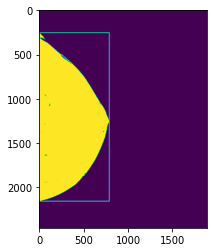

BoundingBox(x1=0, y1=255, x2=790, y2=2154)
/home/robert/data/DBT/train/DBT-P00827_DBT-S01731_rcc_33.png


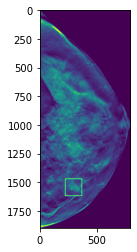

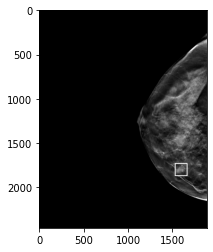

PatientID                                                  DBT-P00827
StudyUID                                                   DBT-S01731
View                                                             rmlo
Subject                                                             0
Slice                                                              36
X                                                                1550
Y                                                                1690
Width                                                             168
Height                                                            122
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P00827/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P00827/1.2.826...
Name: 36, dtype: object
<class 'numpy.ndarray'>
DBT-P00827_DBT-S01731_rmlo_36.png
bbox_roi

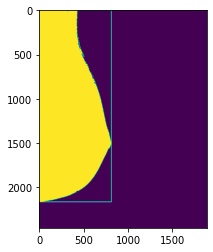

BoundingBox(x1=0, y1=0, x2=814, y2=2161)
/home/robert/data/DBT/train/DBT-P00827_DBT-S01731_rmlo_36.png


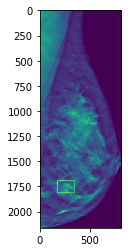

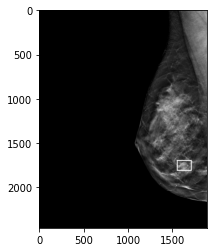

PatientID                                                  DBT-P01110
StudyUID                                                   DBT-S04109
View                                                              lcc
Subject                                                             0
Slice                                                              34
X                                                                 484
Y                                                                 835
Width                                                             191
Height                                                            115
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01110/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01110/1.2.826...
Name: 37, dtype: object
<class 'numpy.ndarray'>
DBT-P01110_DBT-S04109_lcc_34.png
dimension

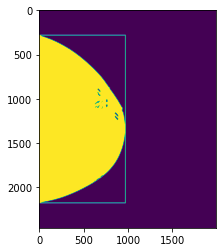

BoundingBox(x1=0, y1=283, x2=974, y2=2173)
/home/robert/data/DBT/train/DBT-P01110_DBT-S04109_lcc_34.png


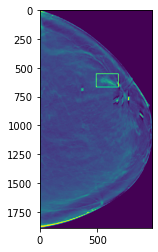

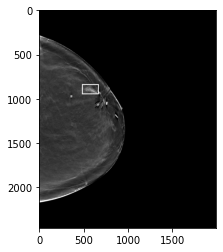

PatientID                                                  DBT-P01110
StudyUID                                                   DBT-S04109
View                                                             lmlo
Subject                                                             0
Slice                                                              19
X                                                                 503
Y                                                                1161
Width                                                             146
Height                                                            128
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01110/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01110/1.2.826...
Name: 38, dtype: object
<class 'numpy.ndarray'>
DBT-P01110_DBT-S04109_lmlo_19.png
dimensio

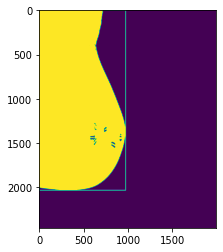

BoundingBox(x1=0, y1=0, x2=976, y2=2031)
/home/robert/data/DBT/train/DBT-P01110_DBT-S04109_lmlo_19.png


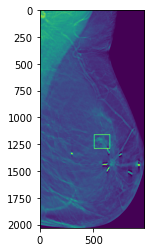

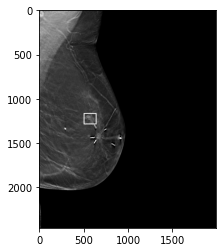

PatientID                                                  DBT-P01112
StudyUID                                                   DBT-S04216
View                                                              lcc
Subject                                                             0
Slice                                                              35
X                                                                 468
Y                                                                1417
Width                                                             134
Height                                                            107
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01112/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01112/1.2.826...
Name: 39, dtype: object
<class 'numpy.ndarray'>
DBT-P01112_DBT-S04216_lcc_35.png
dimension

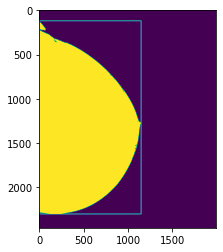

BoundingBox(x1=0, y1=121, x2=1151, y2=2298)
/home/robert/data/DBT/train/DBT-P01112_DBT-S04216_lcc_35.png


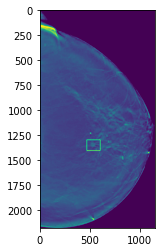

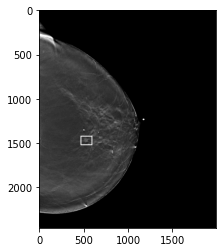

PatientID                                                  DBT-P01112
StudyUID                                                   DBT-S04216
View                                                             lmlo
Subject                                                             0
Slice                                                              33
X                                                                 619
Y                                                                1150
Width                                                             170
Height                                                            156
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01112/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01112/1.2.826...
Name: 40, dtype: object
<class 'numpy.ndarray'>
DBT-P01112_DBT-S04216_lmlo_33.png
dimensio

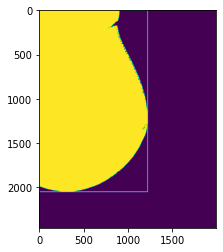

BoundingBox(x1=0, y1=0, x2=1224, y2=2047)
/home/robert/data/DBT/train/DBT-P01112_DBT-S04216_lmlo_33.png


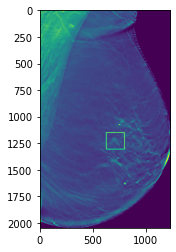

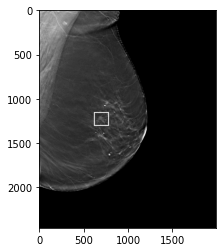

PatientID                                                  DBT-P01130
StudyUID                                                   DBT-S01935
View                                                              lcc
Subject                                                             0
Slice                                                              12
X                                                                  79
Y                                                                 922
Width                                                             225
Height                                                            175
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01130/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01130/1.2.826...
Name: 41, dtype: object
<class 'numpy.ndarray'>
DBT-P01130_DBT-S01935_lcc_12.png
dimension

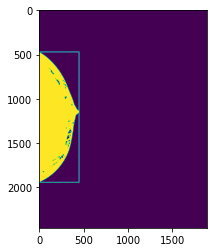

BoundingBox(x1=0, y1=472, x2=450, y2=1941)
/home/robert/data/DBT/train/DBT-P01130_DBT-S01935_lcc_12.png


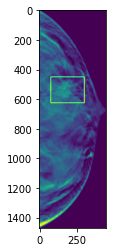

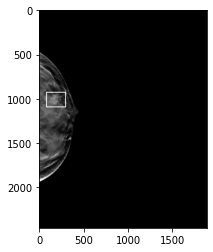

PatientID                                                  DBT-P01130
StudyUID                                                   DBT-S01935
View                                                             lmlo
Subject                                                             0
Slice                                                              10
X                                                                 121
Y                                                                1385
Width                                                             255
Height                                                            259
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01130/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01130/1.2.826...
Name: 42, dtype: object
<class 'numpy.ndarray'>
DBT-P01130_DBT-S01935_lmlo_10.png
dimensio

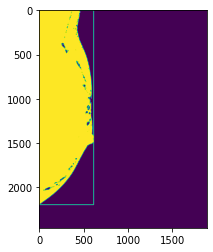

BoundingBox(x1=0, y1=0, x2=614, y2=2193)
/home/robert/data/DBT/train/DBT-P01130_DBT-S01935_lmlo_10.png


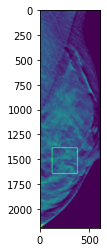

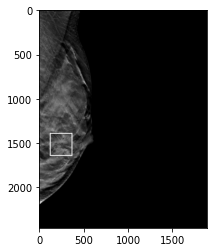

PatientID                                                  DBT-P01130
StudyUID                                                   DBT-S01935
View                                                             lmlo
Subject                                                             0
Slice                                                              32
X                                                                  58
Y                                                                 593
Width                                                             404
Height                                                            525
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01130/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01130/1.2.826...
Name: 43, dtype: object
<class 'numpy.ndarray'>
DBT-P01130_DBT-S01935_lmlo_32.png
dimensio

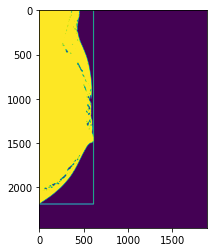

BoundingBox(x1=0, y1=0, x2=613, y2=2186)
/home/robert/data/DBT/train/DBT-P01130_DBT-S01935_lmlo_32.png


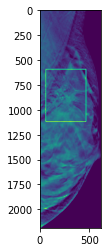

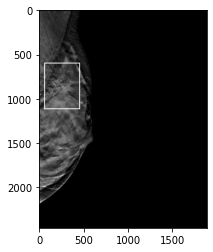

PatientID                                                  DBT-P01139
StudyUID                                                   DBT-S01170
View                                                              rcc
Subject                                                             0
Slice                                                              45
X                                                                1233
Y                                                                1521
Width                                                             104
Height                                                             84
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01139/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01139/1.2.826...
Name: 44, dtype: object
<class 'numpy.ndarray'>
DBT-P01139_DBT-S01170_rcc_45.png
bbox_roi 

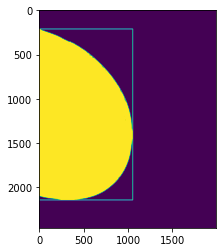

BoundingBox(x1=0, y1=213, x2=1056, y2=2140)
/home/robert/data/DBT/train/DBT-P01139_DBT-S01170_rcc_45.png


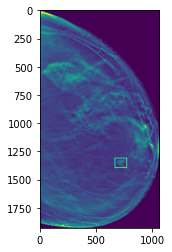

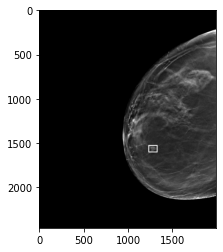

PatientID                                                  DBT-P01139
StudyUID                                                   DBT-S01170
View                                                             rmlo
Subject                                                             0
Slice                                                              54
X                                                                1217
Y                                                                1472
Width                                                             100
Height                                                             69
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01139/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01139/1.2.826...
Name: 45, dtype: object
<class 'numpy.ndarray'>
DBT-P01139_DBT-S01170_rmlo_54.png
bbox_roi

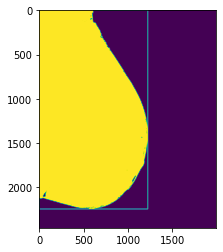

BoundingBox(x1=0, y1=0, x2=1226, y2=2242)
/home/robert/data/DBT/train/DBT-P01139_DBT-S01170_rmlo_54.png


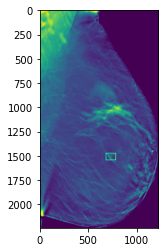

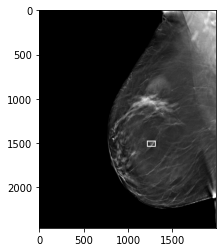

PatientID                                                  DBT-P01181
StudyUID                                                   DBT-S04901
View                                                              lcc
Subject                                                             0
Slice                                                              36
X                                                                 459
Y                                                                1692
Width                                                             284
Height                                                            184
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01181/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01181/1.2.826...
Name: 46, dtype: object
<class 'numpy.ndarray'>
DBT-P01181_DBT-S04901_lcc_36.png
dimension

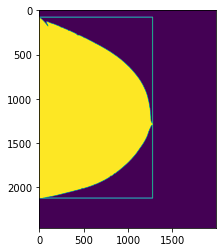

BoundingBox(x1=0, y1=80, x2=1280, y2=2119)
/home/robert/data/DBT/train/DBT-P01181_DBT-S04901_lcc_36.png


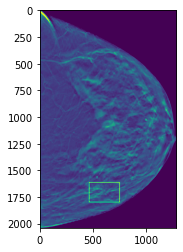

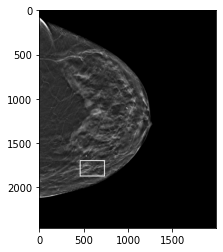

PatientID                                                  DBT-P01181
StudyUID                                                   DBT-S04901
View                                                             lmlo
Subject                                                             0
Slice                                                              46
X                                                                 477
Y                                                                1437
Width                                                             256
Height                                                            217
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01181/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01181/1.2.826...
Name: 47, dtype: object
<class 'numpy.ndarray'>
DBT-P01181_DBT-S04901_lmlo_46.png
dimensio

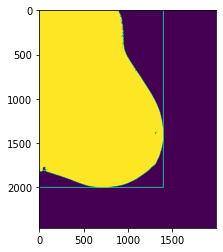

BoundingBox(x1=0, y1=0, x2=1402, y2=1999)
/home/robert/data/DBT/train/DBT-P01181_DBT-S04901_lmlo_46.png


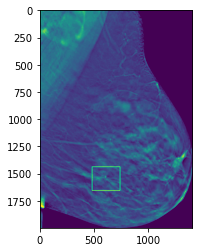

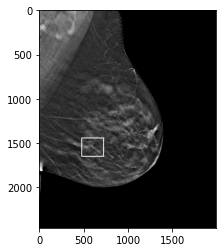

PatientID                                                  DBT-P01241
StudyUID                                                   DBT-S03180
View                                                              lcc
Subject                                                             2
Slice                                                               2
X                                                                 838
Y                                                                1091
Width                                                             113
Height                                                            142
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01241/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01241/1.2.826...
Name: 48, dtype: object
<class 'numpy.ndarray'>
DBT-P01241_DBT-S03180_lcc_2.png
dimension 

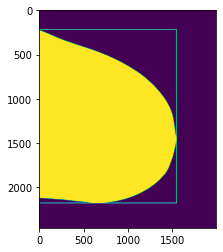

BoundingBox(x1=0, y1=219, x2=1550, y2=2174)
/home/robert/data/DBT/train/DBT-P01241_DBT-S03180_lcc_2.png


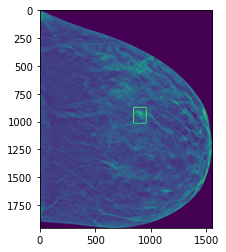

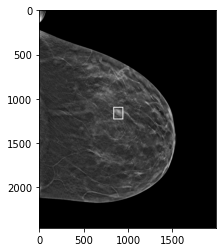

PatientID                                                  DBT-P01241
StudyUID                                                   DBT-S03180
View                                                             lmlo
Subject                                                             2
Slice                                                               9
X                                                                 631
Y                                                                1788
Width                                                             118
Height                                                            147
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01241/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01241/1.2.826...
Name: 49, dtype: object
<class 'numpy.ndarray'>
DBT-P01241_DBT-S03180_lmlo_9.png
dimension

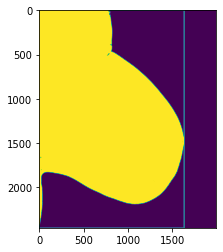

BoundingBox(x1=0, y1=0, x2=1636, y2=2457)
/home/robert/data/DBT/train/DBT-P01241_DBT-S03180_lmlo_9.png


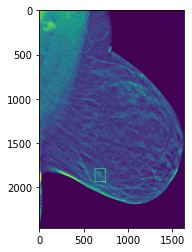

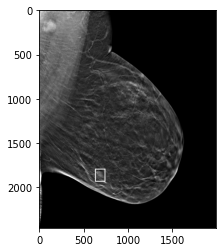

PatientID                                                  DBT-P01262
StudyUID                                                   DBT-S00537
View                                                              rcc
Subject                                                             0
Slice                                                              39
X                                                                1398
Y                                                                 647
Width                                                             473
Height                                                            678
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01262/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01262/1.2.826...
Name: 50, dtype: object
<class 'numpy.ndarray'>
DBT-P01262_DBT-S00537_rcc_39.png
bbox_roi 

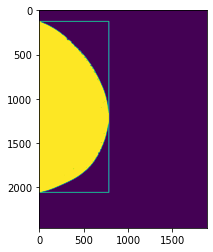

BoundingBox(x1=0, y1=128, x2=785, y2=2055)
/home/robert/data/DBT/train/DBT-P01262_DBT-S00537_rcc_39.png


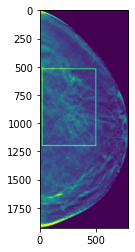

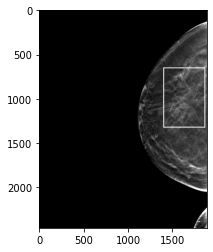

PatientID                                                  DBT-P01262
StudyUID                                                   DBT-S00537
View                                                             rmlo
Subject                                                             0
Slice                                                              27
X                                                                1244
Y                                                                 858
Width                                                             632
Height                                                            598
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01262/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01262/1.2.826...
Name: 51, dtype: object
<class 'numpy.ndarray'>
DBT-P01262_DBT-S00537_rmlo_27.png
bbox_roi

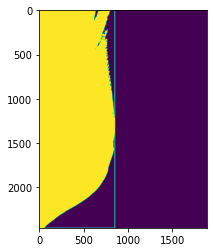

BoundingBox(x1=0, y1=0, x2=852, y2=2457)
/home/robert/data/DBT/train/DBT-P01262_DBT-S00537_rmlo_27.png


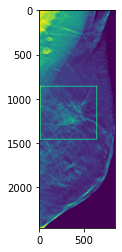

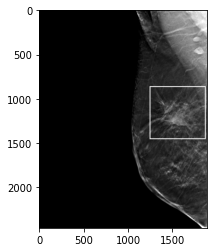

PatientID                                                  DBT-P01267
StudyUID                                                   DBT-S03415
View                                                              rcc
Subject                                                             2
Slice                                                              46
X                                                                1704
Y                                                                1123
Width                                                             185
Height                                                            321
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01267/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01267/1.2.826...
Name: 52, dtype: object
<class 'numpy.ndarray'>
DBT-P01267_DBT-S03415_rcc_46.png
bbox_roi 

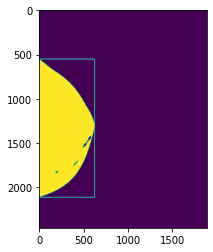

BoundingBox(x1=0, y1=552, x2=624, y2=2110)
/home/robert/data/DBT/train/DBT-P01267_DBT-S03415_rcc_46.png


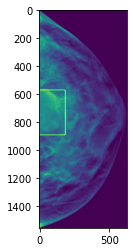

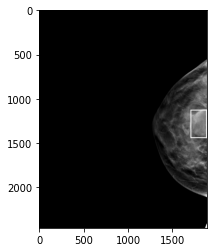

PatientID                                                  DBT-P01267
StudyUID                                                   DBT-S03415
View                                                             rmlo
Subject                                                             2
Slice                                                              41
X                                                                1446
Y                                                                 796
Width                                                             353
Height                                                            417
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01267/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01267/1.2.826...
Name: 53, dtype: object
<class 'numpy.ndarray'>
DBT-P01267_DBT-S03415_rmlo_41.png
bbox_roi

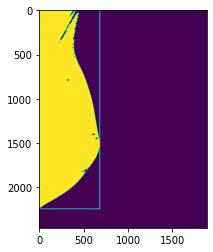

BoundingBox(x1=0, y1=0, x2=683, y2=2240)
/home/robert/data/DBT/train/DBT-P01267_DBT-S03415_rmlo_41.png


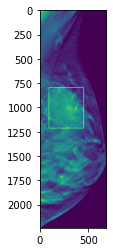

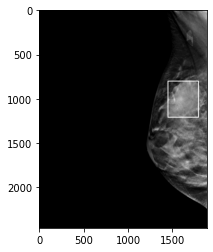

PatientID                                                  DBT-P01282
StudyUID                                                   DBT-S01508
View                                                             lcc2
Subject                                                             0
Slice                                                              41
X                                                                   4
Y                                                                1075
Width                                                             224
Height                                                            407
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01282/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01282/1.2.826...
Name: 54, dtype: object
<class 'numpy.ndarray'>
DBT-P01282_DBT-S01508_lcc2_41.png
dimensio

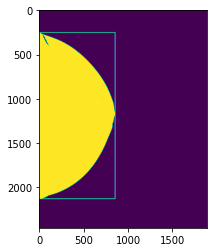

BoundingBox(x1=0, y1=253, x2=856, y2=2126)
/home/robert/data/DBT/train/DBT-P01282_DBT-S01508_lcc2_41.png


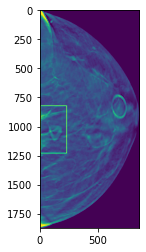

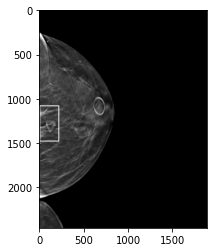

PatientID                                                  DBT-P01282
StudyUID                                                   DBT-S01508
View                                                            lmlo1
Subject                                                             0
Slice                                                              29
X                                                                   8
Y                                                                 601
Width                                                             382
Height                                                            472
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01282/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01282/1.2.826...
Name: 55, dtype: object
<class 'numpy.ndarray'>
DBT-P01282_DBT-S01508_lmlo1_29.png
dimensi

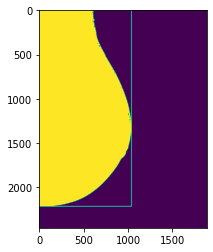

BoundingBox(x1=0, y1=0, x2=1040, y2=2212)
/home/robert/data/DBT/train/DBT-P01282_DBT-S01508_lmlo1_29.png


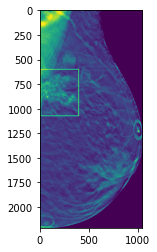

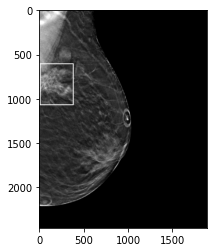

PatientID                                                  DBT-P01347
StudyUID                                                   DBT-S02864
View                                                              rcc
Subject                                                             0
Slice                                                              27
X                                                                1603
Y                                                                 999
Width                                                             290
Height                                                            240
Class                                                          cancer
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01347/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01347/1.2.826...
Name: 56, dtype: object
<class 'numpy.ndarray'>
DBT-P01347_DBT-S02864_rcc_27.png
bbox_roi 

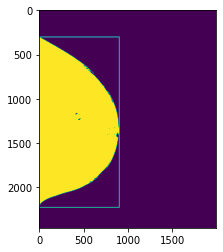

BoundingBox(x1=0, y1=303, x2=905, y2=2224)
/home/robert/data/DBT/train/DBT-P01347_DBT-S02864_rcc_27.png


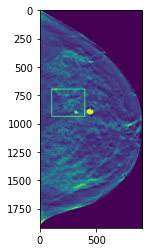

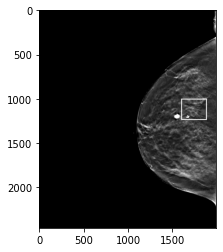

PatientID                                                  DBT-P01347
StudyUID                                                   DBT-S02864
View                                                             rmlo
Subject                                                             0
Slice                                                              25
X                                                                1641
Y                                                                1040
Width                                                             180
Height                                                            201
Class                                                          cancer
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01347/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01347/1.2.826...
Name: 57, dtype: object
<class 'numpy.ndarray'>
DBT-P01347_DBT-S02864_rmlo_25.png
bbox_roi

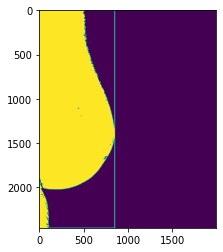

BoundingBox(x1=0, y1=0, x2=853, y2=2457)
/home/robert/data/DBT/train/DBT-P01347_DBT-S02864_rmlo_25.png


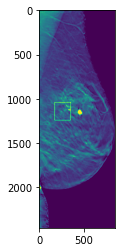

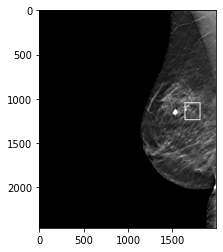

PatientID                                                  DBT-P01347
StudyUID                                                   DBT-S02864
View                                                            rmlo1
Subject                                                             0
Slice                                                              32
X                                                                1586
Y                                                                1249
Width                                                             227
Height                                                            149
Class                                                          cancer
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01347/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01347/1.2.826...
Name: 58, dtype: object
<class 'numpy.ndarray'>
DBT-P01347_DBT-S02864_rmlo1_32.png
bbox_ro

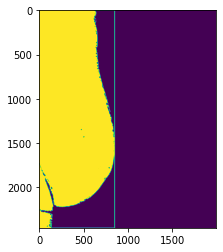

BoundingBox(x1=0, y1=0, x2=852, y2=2457)
/home/robert/data/DBT/train/DBT-P01347_DBT-S02864_rmlo1_32.png


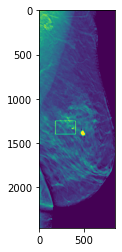

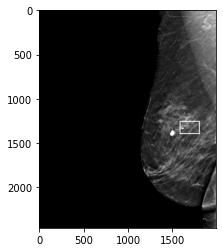

PatientID                                                  DBT-P01439
StudyUID                                                   DBT-S01096
View                                                             lmlo
Subject                                                             2
Slice                                                              37
X                                                                 164
Y                                                                 815
Width                                                             119
Height                                                            105
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01439/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01439/1.2.826...
Name: 59, dtype: object
<class 'numpy.ndarray'>
DBT-P01439_DBT-S01096_lmlo_37.png
dimensio

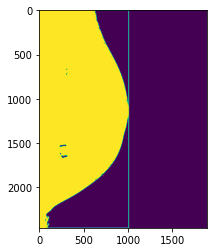

BoundingBox(x1=0, y1=0, x2=1008, y2=2457)
/home/robert/data/DBT/train/DBT-P01439_DBT-S01096_lmlo_37.png


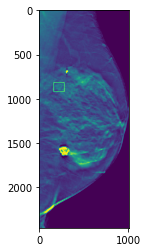

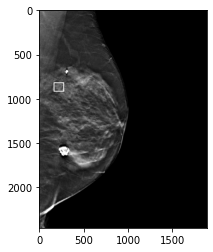

PatientID                                                  DBT-P01461
StudyUID                                                   DBT-S00251
View                                                              lcc
Subject                                                             0
Slice                                                              23
X                                                                 170
Y                                                                 776
Width                                                             244
Height                                                            268
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01461/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01461/1.2.826...
Name: 60, dtype: object
<class 'numpy.ndarray'>
DBT-P01461_DBT-S00251_lcc_23.png
dimension

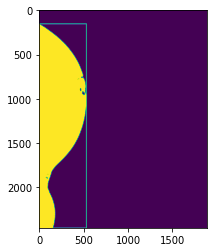

BoundingBox(x1=0, y1=155, x2=533, y2=2457)
/home/robert/data/DBT/train/DBT-P01461_DBT-S00251_lcc_23.png


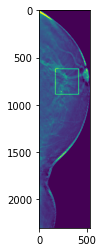

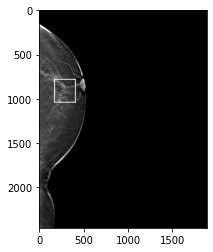

PatientID                                                  DBT-P01461
StudyUID                                                   DBT-S00251
View                                                             lmlo
Subject                                                             0
Slice                                                              26
X                                                                 248
Y                                                                1152
Width                                                             215
Height                                                            332
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01461/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01461/1.2.826...
Name: 61, dtype: object
<class 'numpy.ndarray'>
DBT-P01461_DBT-S00251_lmlo_26.png
dimensio

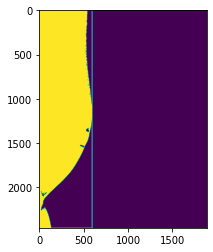

BoundingBox(x1=0, y1=0, x2=597, y2=2457)
/home/robert/data/DBT/train/DBT-P01461_DBT-S00251_lmlo_26.png


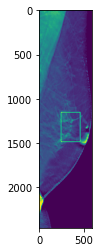

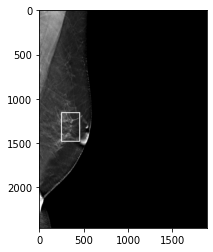

PatientID                                                  DBT-P01488
StudyUID                                                   DBT-S00017
View                                                              lcc
Subject                                                             0
Slice                                                              23
X                                                                 773
Y                                                                1158
Width                                                              87
Height                                                             74
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01488/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01488/1.2.826...
Name: 62, dtype: object
<class 'numpy.ndarray'>
DBT-P01488_DBT-S00017_lcc_23.png
dimension

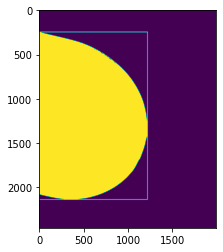

BoundingBox(x1=0, y1=247, x2=1223, y2=2135)
/home/robert/data/DBT/train/DBT-P01488_DBT-S00017_lcc_23.png


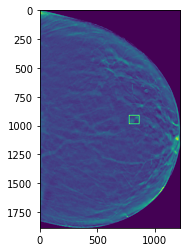

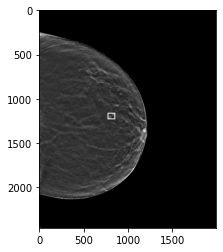

PatientID                                                  DBT-P01488
StudyUID                                                   DBT-S00017
View                                                             lmlo
Subject                                                             0
Slice                                                              23
X                                                                 925
Y                                                                1057
Width                                                              67
Height                                                             64
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01488/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01488/1.2.826...
Name: 63, dtype: object
<class 'numpy.ndarray'>
DBT-P01488_DBT-S00017_lmlo_23.png
dimensio

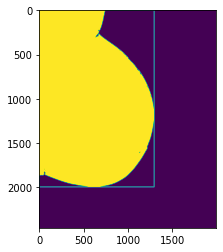

BoundingBox(x1=0, y1=0, x2=1298, y2=1993)
/home/robert/data/DBT/train/DBT-P01488_DBT-S00017_lmlo_23.png


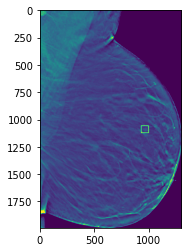

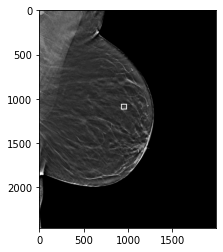

PatientID                                                  DBT-P01493
StudyUID                                                   DBT-S00432
View                                                              rcc
Subject                                                             0
Slice                                                               7
X                                                                1707
Y                                                                 570
Width                                                             178
Height                                                            131
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01493/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01493/1.2.826...
Name: 64, dtype: object
<class 'numpy.ndarray'>
DBT-P01493_DBT-S00432_rcc_7.png
bbox_roi B

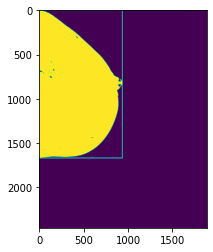

BoundingBox(x1=0, y1=0, x2=937, y2=1667)
/home/robert/data/DBT/train/DBT-P01493_DBT-S00432_rcc_7.png


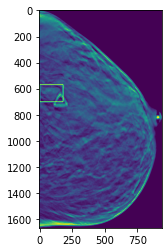

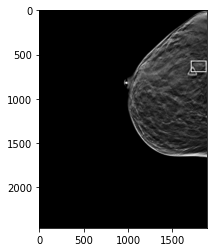

PatientID                                                  DBT-P01493
StudyUID                                                   DBT-S00432
View                                                             rmlo
Subject                                                             0
Slice                                                               5
X                                                                1498
Y                                                                1643
Width                                                             209
Height                                                            132
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01493/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01493/1.2.826...
Name: 65, dtype: object
<class 'numpy.ndarray'>
DBT-P01493_DBT-S00432_rmlo_5.png
bbox_roi 

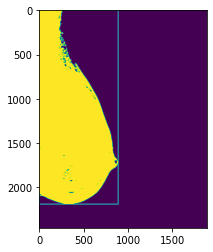

BoundingBox(x1=0, y1=0, x2=890, y2=2187)
/home/robert/data/DBT/train/DBT-P01493_DBT-S00432_rmlo_5.png


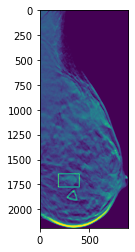

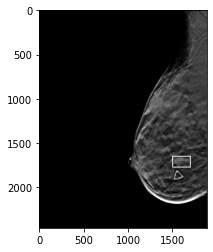

PatientID                                                  DBT-P01539
StudyUID                                                   DBT-S03623
View                                                              rcc
Subject                                                             0
Slice                                                              28
X                                                                1040
Y                                                                1810
Width                                                             796
Height                                                            370
Class                                                          cancer
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01539/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01539/1.2.826...
Name: 66, dtype: object
<class 'numpy.ndarray'>
DBT-P01539_DBT-S03623_rcc_28.png
bbox_roi 

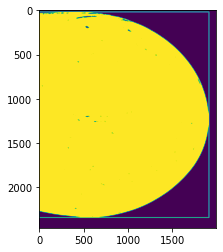

BoundingBox(x1=0, y1=21, x2=1916, y2=2338)
/home/robert/data/DBT/train/DBT-P01539_DBT-S03623_rcc_28.png


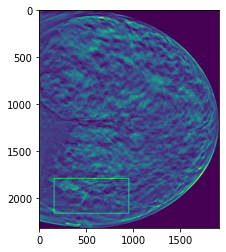

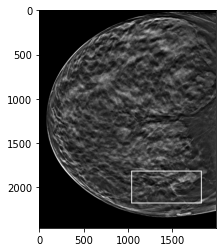

PatientID                                                  DBT-P01539
StudyUID                                                   DBT-S03623
View                                                             rmlo
Subject                                                             0
Slice                                                              37
X                                                                1126
Y                                                                1452
Width                                                             606
Height                                                            342
Class                                                          cancer
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01539/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01539/1.2.826...
Name: 67, dtype: object
<class 'numpy.ndarray'>
DBT-P01539_DBT-S03623_rmlo_37.png
bbox_roi

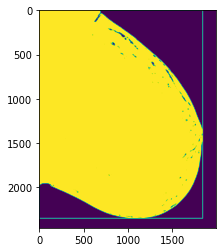

BoundingBox(x1=0, y1=0, x2=1845, y2=2347)
/home/robert/data/DBT/train/DBT-P01539_DBT-S03623_rmlo_37.png


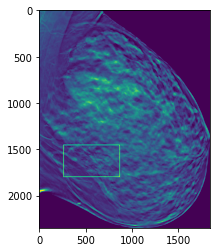

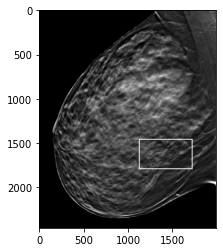

PatientID                                                  DBT-P01587
StudyUID                                                   DBT-S04115
View                                                              rcc
Subject                                                             0
Slice                                                              34
X                                                                1342
Y                                                                 839
Width                                                             130
Height                                                            116
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01587/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01587/1.2.826...
Name: 68, dtype: object
<class 'numpy.ndarray'>
DBT-P01587_DBT-S04115_rcc_34.png
bbox_roi 

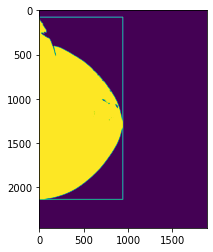

BoundingBox(x1=0, y1=80, x2=942, y2=2134)
/home/robert/data/DBT/train/DBT-P01587_DBT-S04115_rcc_34.png


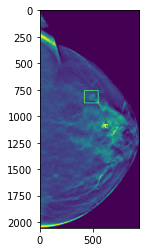

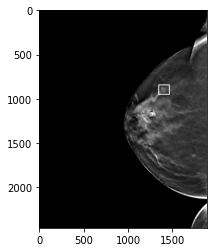

PatientID                                                  DBT-P01587
StudyUID                                                   DBT-S04115
View                                                             rmlo
Subject                                                             0
Slice                                                              17
X                                                                1184
Y                                                                1048
Width                                                             127
Height                                                            104
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01587/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01587/1.2.826...
Name: 69, dtype: object
<class 'numpy.ndarray'>
DBT-P01587_DBT-S04115_rmlo_17.png
bbox_roi

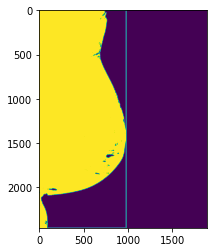

BoundingBox(x1=0, y1=0, x2=980, y2=2457)
/home/robert/data/DBT/train/DBT-P01587_DBT-S04115_rmlo_17.png


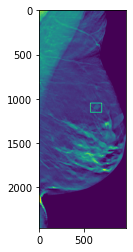

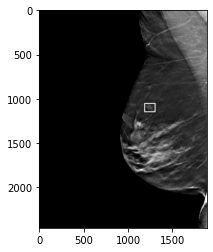

PatientID                                                  DBT-P01624
StudyUID                                                   DBT-S03518
View                                                              lcc
Subject                                                             0
Slice                                                              20
X                                                                 349
Y                                                                1054
Width                                                             357
Height                                                            269
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01624/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01624/1.2.826...
Name: 70, dtype: object
<class 'numpy.ndarray'>
DBT-P01624_DBT-S03518_lcc_20.png
dimension

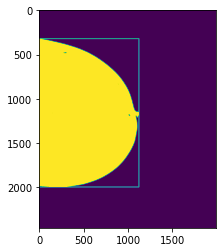

BoundingBox(x1=0, y1=322, x2=1126, y2=1994)
/home/robert/data/DBT/train/DBT-P01624_DBT-S03518_lcc_20.png


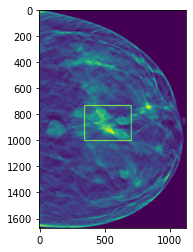

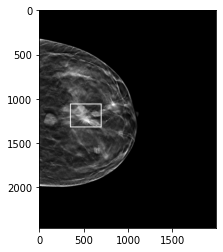

PatientID                                                  DBT-P01624
StudyUID                                                   DBT-S03518
View                                                             lmlo
Subject                                                             0
Slice                                                              34
X                                                                 360
Y                                                                1417
Width                                                             313
Height                                                            282
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01624/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01624/1.2.826...
Name: 71, dtype: object
<class 'numpy.ndarray'>
DBT-P01624_DBT-S03518_lmlo_34.png
dimensio

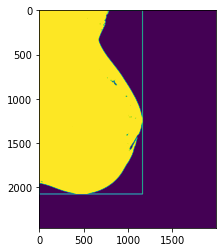

BoundingBox(x1=0, y1=0, x2=1167, y2=2073)
/home/robert/data/DBT/train/DBT-P01624_DBT-S03518_lmlo_34.png


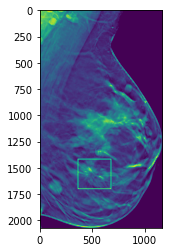

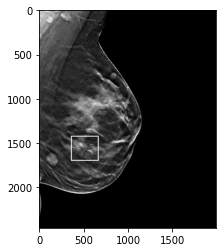

PatientID                                                  DBT-P01626
StudyUID                                                   DBT-S02188
View                                                              lcc
Subject                                                             0
Slice                                                              37
X                                                                 541
Y                                                                1176
Width                                                             307
Height                                                            278
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01626/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01626/1.2.826...
Name: 72, dtype: object
<class 'numpy.ndarray'>
DBT-P01626_DBT-S02188_lcc_37.png
dimension

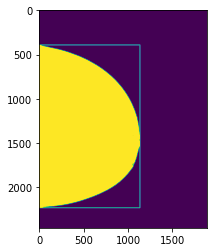

BoundingBox(x1=0, y1=393, x2=1135, y2=2228)
/home/robert/data/DBT/train/DBT-P01626_DBT-S02188_lcc_37.png


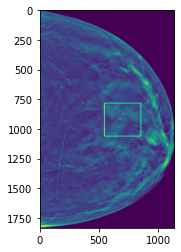

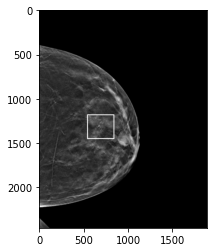

PatientID                                                  DBT-P01626
StudyUID                                                   DBT-S02188
View                                                             lmlo
Subject                                                             0
Slice                                                              33
X                                                                 824
Y                                                                1092
Width                                                             230
Height                                                            199
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01626/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01626/1.2.826...
Name: 73, dtype: object
<class 'numpy.ndarray'>
DBT-P01626_DBT-S02188_lmlo_33.png
dimensio

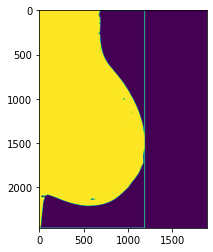

BoundingBox(x1=0, y1=0, x2=1187, y2=2457)
/home/robert/data/DBT/train/DBT-P01626_DBT-S02188_lmlo_33.png


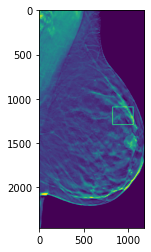

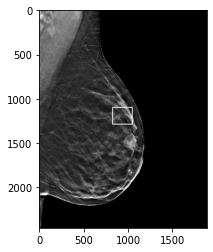

PatientID                                                  DBT-P01673
StudyUID                                                   DBT-S04347
View                                                              lcc
Subject                                                             2
Slice                                                              47
X                                                                 224
Y                                                                1043
Width                                                             203
Height                                                            238
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01673/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01673/1.2.826...
Name: 74, dtype: object
<class 'numpy.ndarray'>
DBT-P01673_DBT-S04347_lcc_47.png
dimension

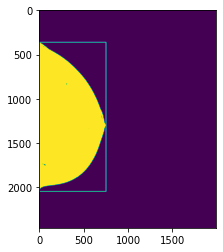

BoundingBox(x1=0, y1=363, x2=755, y2=2044)
/home/robert/data/DBT/train/DBT-P01673_DBT-S04347_lcc_47.png


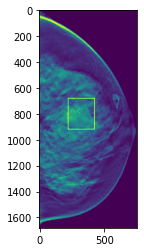

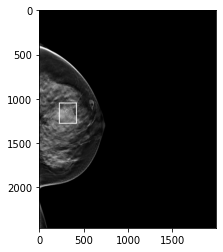

PatientID                                                  DBT-P01673
StudyUID                                                   DBT-S04347
View                                                             lmlo
Subject                                                             2
Slice                                                              33
X                                                                 498
Y                                                                 557
Width                                                             165
Height                                                            206
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01673/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01673/1.2.826...
Name: 75, dtype: object
<class 'numpy.ndarray'>
DBT-P01673_DBT-S04347_lmlo_33.png
dimensio

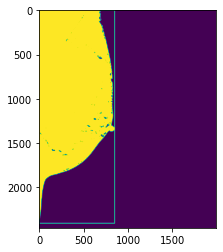

BoundingBox(x1=0, y1=0, x2=852, y2=2403)
/home/robert/data/DBT/train/DBT-P01673_DBT-S04347_lmlo_33.png


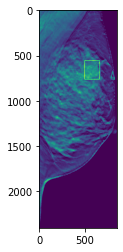

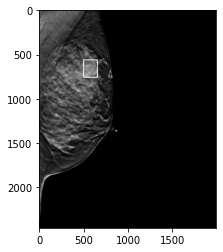

PatientID                                                  DBT-P01712
StudyUID                                                   DBT-S02941
View                                                              rcc
Subject                                                             0
Slice                                                              37
X                                                                1256
Y                                                                1233
Width                                                              81
Height                                                             86
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01712/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01712/1.2.826...
Name: 76, dtype: object
<class 'numpy.ndarray'>
DBT-P01712_DBT-S02941_rcc_37.png
bbox_roi 

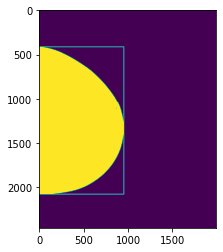

BoundingBox(x1=0, y1=414, x2=956, y2=2075)
/home/robert/data/DBT/train/DBT-P01712_DBT-S02941_rcc_37.png


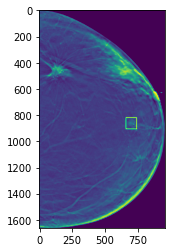

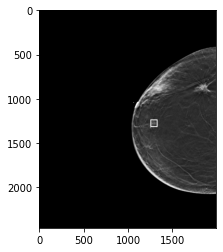

PatientID                                                  DBT-P01712
StudyUID                                                   DBT-S02941
View                                                             rmlo
Subject                                                             0
Slice                                                              42
X                                                                1109
Y                                                                1092
Width                                                              89
Height                                                             76
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01712/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01712/1.2.826...
Name: 77, dtype: object
<class 'numpy.ndarray'>
DBT-P01712_DBT-S02941_rmlo_42.png
bbox_roi

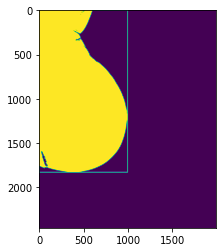

BoundingBox(x1=0, y1=0, x2=998, y2=1828)
/home/robert/data/DBT/train/DBT-P01712_DBT-S02941_rmlo_42.png


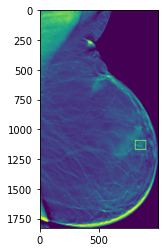

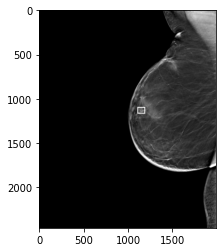

PatientID                                                  DBT-P01718
StudyUID                                                   DBT-S01120
View                                                              rcc
Subject                                                             0
Slice                                                              42
X                                                                1934
Y                                                                 685
Width                                                              59
Height                                                            176
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01718/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01718/1.2.826...
Name: 78, dtype: object
<class 'numpy.ndarray'>
DBT-P01718_DBT-S01120_rcc_42.png
bbox_roi 

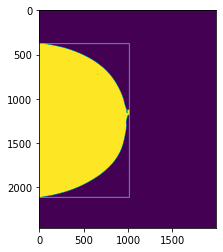

BoundingBox(x1=0, y1=378, x2=1019, y2=2111)
/home/robert/data/DBT/train/DBT-P01718_DBT-S01120_rcc_42.png


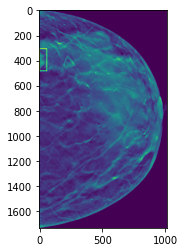

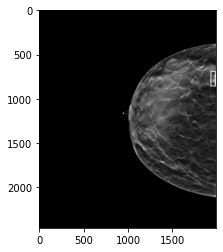

PatientID                                                  DBT-P01718
StudyUID                                                   DBT-S01120
View                                                             rmlo
Subject                                                             0
Slice                                                              29
X                                                                1201
Y                                                                 404
Width                                                             189
Height                                                            168
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01718/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01718/1.2.826...
Name: 79, dtype: object
<class 'numpy.ndarray'>
DBT-P01718_DBT-S01120_rmlo_29.png
bbox_roi

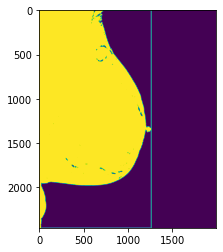

BoundingBox(x1=0, y1=0, x2=1265, y2=2457)
/home/robert/data/DBT/train/DBT-P01718_DBT-S01120_rmlo_29.png


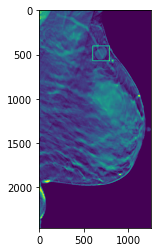

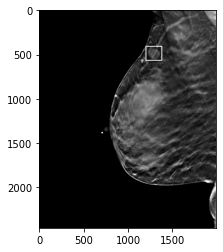

PatientID                                                  DBT-P01745
StudyUID                                                   DBT-S03916
View                                                              lcc
Subject                                                             2
Slice                                                              13
X                                                                 169
Y                                                                 722
Width                                                             227
Height                                                            183
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01745/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01745/1.2.826...
Name: 80, dtype: object
<class 'numpy.ndarray'>
DBT-P01745_DBT-S03916_lcc_13.png
dimension

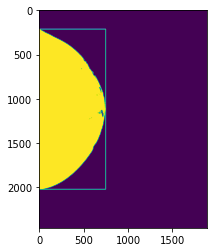

BoundingBox(x1=0, y1=215, x2=749, y2=2020)
/home/robert/data/DBT/train/DBT-P01745_DBT-S03916_lcc_13.png


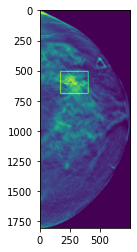

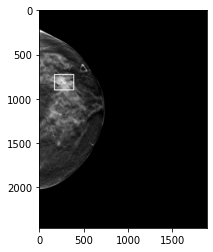

PatientID                                                  DBT-P01745
StudyUID                                                   DBT-S03916
View                                                             lmlo
Subject                                                             2
Slice                                                              14
X                                                                 181
Y                                                                1469
Width                                                             207
Height                                                            234
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01745/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01745/1.2.826...
Name: 81, dtype: object
<class 'numpy.ndarray'>
DBT-P01745_DBT-S03916_lmlo_14.png
dimensio

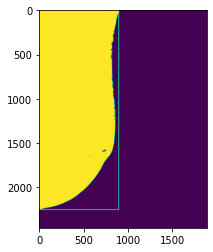

BoundingBox(x1=0, y1=0, x2=896, y2=2248)
/home/robert/data/DBT/train/DBT-P01745_DBT-S03916_lmlo_14.png


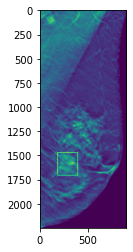

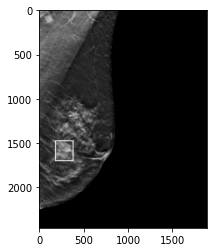

PatientID                                                  DBT-P01751
StudyUID                                                   DBT-S01332
View                                                             rmlo
Subject                                                             0
Slice                                                               8
X                                                                1462
Y                                                                   5
Width                                                             239
Height                                                            172
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01751/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01751/1.2.826...
Name: 82, dtype: object
<class 'numpy.ndarray'>
DBT-P01751_DBT-S01332_rmlo_8.png
bbox_roi 

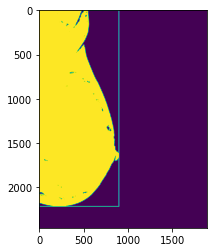

BoundingBox(x1=0, y1=0, x2=898, y2=2213)
/home/robert/data/DBT/train/DBT-P01751_DBT-S01332_rmlo_8.png


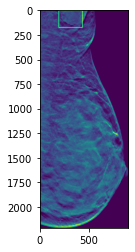

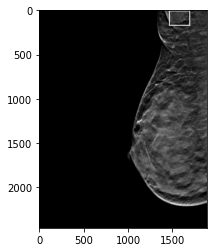

PatientID                                                  DBT-P01753
StudyUID                                                   DBT-S04069
View                                                              lcc
Subject                                                             2
Slice                                                              32
X                                                                1026
Y                                                                 808
Width                                                             503
Height                                                            664
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01753/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01753/1.2.826...
Name: 83, dtype: object
<class 'numpy.ndarray'>
DBT-P01753_DBT-S04069_lcc_32.png
dimension

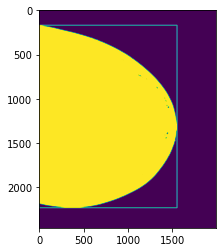

BoundingBox(x1=0, y1=171, x2=1556, y2=2228)
/home/robert/data/DBT/train/DBT-P01753_DBT-S04069_lcc_32.png


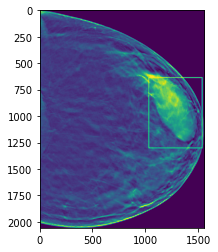

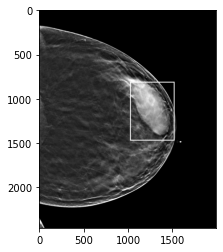

PatientID                                                  DBT-P01753
StudyUID                                                   DBT-S04069
View                                                             lmlo
Subject                                                             2
Slice                                                              22
X                                                                 849
Y                                                                1263
Width                                                             604
Height                                                            646
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01753/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01753/1.2.826...
Name: 84, dtype: object
<class 'numpy.ndarray'>
DBT-P01753_DBT-S04069_lmlo_22.png
dimensio

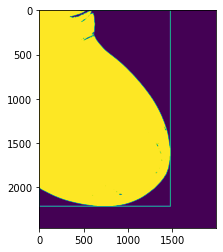

BoundingBox(x1=0, y1=0, x2=1481, y2=2211)
/home/robert/data/DBT/train/DBT-P01753_DBT-S04069_lmlo_22.png


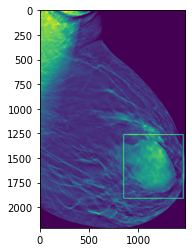

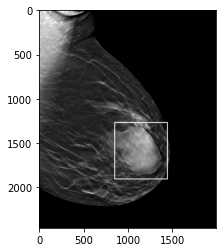

PatientID                                                  DBT-P01801
StudyUID                                                   DBT-S04999
View                                                             rcc1
Subject                                                             0
Slice                                                              15
X                                                                1296
Y                                                                1551
Width                                                             237
Height                                                            193
Class                                                          cancer
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01801/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01801/1.2.826...
Name: 85, dtype: object
<class 'numpy.ndarray'>
DBT-P01801_DBT-S04999_rcc1_15.png
bbox_roi

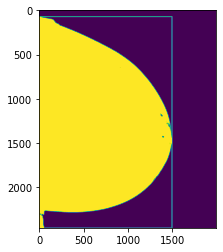

BoundingBox(x1=0, y1=74, x2=1499, y2=2457)
/home/robert/data/DBT/train/DBT-P01801_DBT-S04999_rcc1_15.png


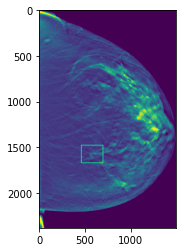

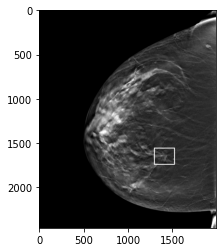

PatientID                                                  DBT-P01801
StudyUID                                                   DBT-S04999
View                                                             rmlo
Subject                                                             0
Slice                                                              29
X                                                                1304
Y                                                                1878
Width                                                             237
Height                                                            177
Class                                                          cancer
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01801/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01801/1.2.826...
Name: 86, dtype: object
<class 'numpy.ndarray'>
DBT-P01801_DBT-S04999_rmlo_29.png
bbox_roi

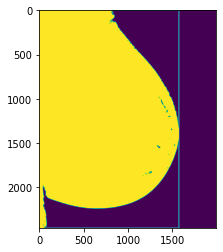

BoundingBox(x1=0, y1=0, x2=1577, y2=2457)
/home/robert/data/DBT/train/DBT-P01801_DBT-S04999_rmlo_29.png


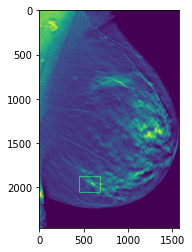

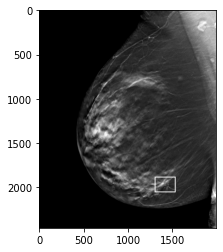

PatientID                                                  DBT-P01817
StudyUID                                                   DBT-S01841
View                                                              lcc
Subject                                                             0
Slice                                                              20
X                                                                 516
Y                                                                1777
Width                                                             584
Height                                                            319
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01817/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01817/1.2.826...
Name: 87, dtype: object
<class 'numpy.ndarray'>
DBT-P01817_DBT-S01841_lcc_20.png
dimension

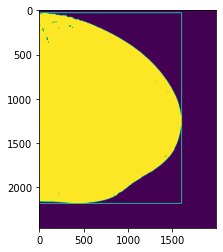

BoundingBox(x1=0, y1=30, x2=1607, y2=2179)
/home/robert/data/DBT/train/DBT-P01817_DBT-S01841_lcc_20.png


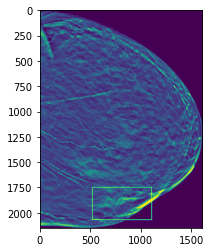

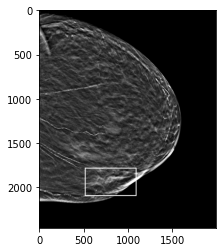

PatientID                                                  DBT-P01817
StudyUID                                                   DBT-S01841
View                                                             lmlo
Subject                                                             0
Slice                                                              38
X                                                                 517
Y                                                                1869
Width                                                             727
Height                                                            362
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01817/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01817/1.2.826...
Name: 88, dtype: object
<class 'numpy.ndarray'>
DBT-P01817_DBT-S01841_lmlo_38.png
dimensio

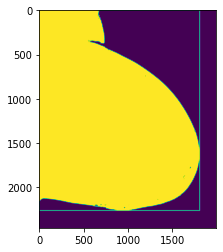

BoundingBox(x1=0, y1=0, x2=1811, y2=2259)
/home/robert/data/DBT/train/DBT-P01817_DBT-S01841_lmlo_38.png


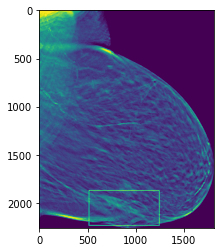

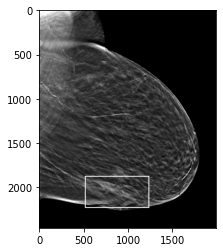

PatientID                                                  DBT-P01826
StudyUID                                                   DBT-S00710
View                                                              lcc
Subject                                                             0
Slice                                                              29
X                                                                 156
Y                                                                1004
Width                                                             240
Height                                                            204
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01826/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01826/1.2.826...
Name: 89, dtype: object
<class 'numpy.ndarray'>
DBT-P01826_DBT-S00710_lcc_29.png
dimension

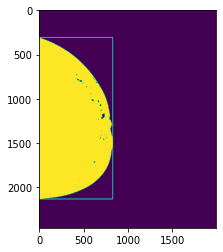

BoundingBox(x1=0, y1=309, x2=830, y2=2129)
/home/robert/data/DBT/train/DBT-P01826_DBT-S00710_lcc_29.png


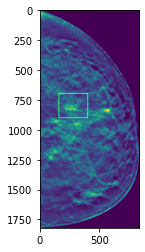

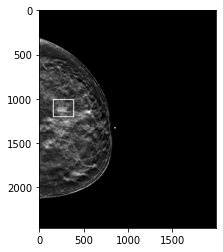

PatientID                                                  DBT-P01826
StudyUID                                                   DBT-S00710
View                                                              lcc
Subject                                                             0
Slice                                                              29
X                                                                 485
Y                                                                1282
Width                                                             104
Height                                                             84
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01826/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01826/1.2.826...
Name: 90, dtype: object
<class 'numpy.ndarray'>
DBT-P01826_DBT-S00710_lcc_29.png
dimension

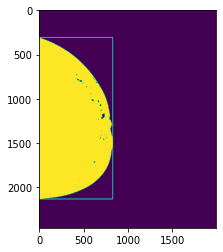

BoundingBox(x1=0, y1=309, x2=830, y2=2129)
/home/robert/data/DBT/train/DBT-P01826_DBT-S00710_lcc_29.png


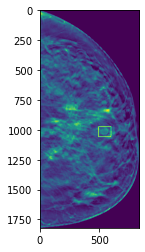

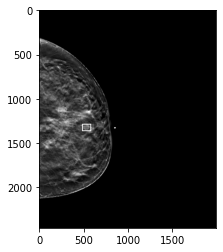

PatientID                                                  DBT-P01839
StudyUID                                                   DBT-S03748
View                                                              lcc
Subject                                                             0
Slice                                                              18
X                                                                1395
Y                                                                 779
Width                                                             340
Height                                                            573
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01839/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01839/1.2.826...
Name: 91, dtype: object
<class 'numpy.ndarray'>
DBT-P01839_DBT-S03748_lcc_18.png
dimension

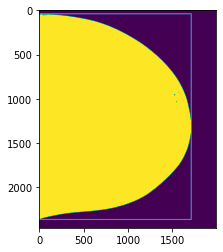

BoundingBox(x1=0, y1=42, x2=1716, y2=2360)
/home/robert/data/DBT/train/DBT-P01839_DBT-S03748_lcc_18.png


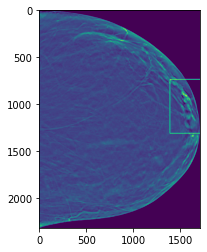

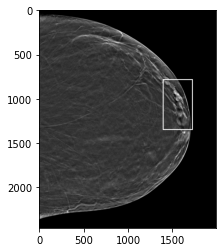

PatientID                                                  DBT-P01839
StudyUID                                                   DBT-S03748
View                                                             lmlo
Subject                                                             0
Slice                                                              12
X                                                                1317
Y                                                                1645
Width                                                             316
Height                                                            443
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P01839/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P01839/1.2.826...
Name: 92, dtype: object
<class 'numpy.ndarray'>
DBT-P01839_DBT-S03748_lmlo_12.png
dimensio

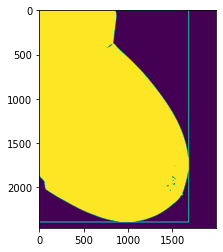

BoundingBox(x1=0, y1=0, x2=1687, y2=2389)
/home/robert/data/DBT/train/DBT-P01839_DBT-S03748_lmlo_12.png


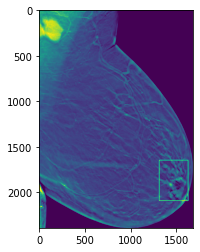

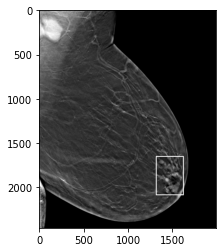

PatientID                                                  DBT-P02065
StudyUID                                                   DBT-S04959
View                                                              lcc
Subject                                                             0
Slice                                                              35
X                                                                  32
Y                                                                 865
Width                                                             125
Height                                                            165
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02065/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02065/1.2.826...
Name: 93, dtype: object
<class 'numpy.ndarray'>
DBT-P02065_DBT-S04959_lcc_35.png
dimension

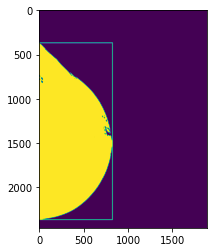

BoundingBox(x1=0, y1=369, x2=826, y2=2362)
/home/robert/data/DBT/train/DBT-P02065_DBT-S04959_lcc_35.png


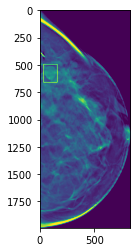

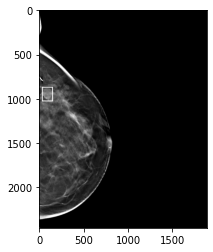

PatientID                                                  DBT-P02065
StudyUID                                                   DBT-S04959
View                                                              lcc
Subject                                                             0
Slice                                                              36
X                                                                 281
Y                                                                 832
Width                                                              72
Height                                                             65
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02065/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02065/1.2.826...
Name: 94, dtype: object
<class 'numpy.ndarray'>
DBT-P02065_DBT-S04959_lcc_36.png
dimension

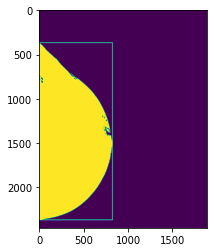

BoundingBox(x1=0, y1=367, x2=826, y2=2364)
/home/robert/data/DBT/train/DBT-P02065_DBT-S04959_lcc_36.png


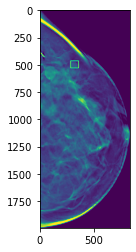

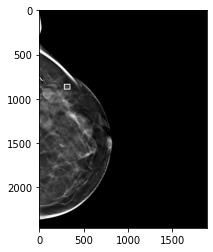

PatientID                                                  DBT-P02065
StudyUID                                                   DBT-S04959
View                                                             lmlo
Subject                                                             0
Slice                                                              17
X                                                                 421
Y                                                                1088
Width                                                              62
Height                                                             55
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02065/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02065/1.2.826...
Name: 95, dtype: object
<class 'numpy.ndarray'>
DBT-P02065_DBT-S04959_lmlo_17.png
dimensio

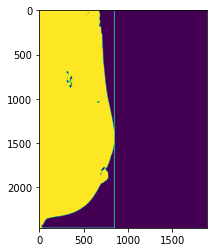

BoundingBox(x1=0, y1=0, x2=848, y2=2457)
/home/robert/data/DBT/train/DBT-P02065_DBT-S04959_lmlo_17.png


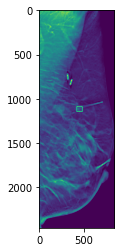

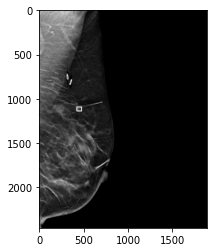

PatientID                                                  DBT-P02065
StudyUID                                                   DBT-S04959
View                                                             lmlo
Subject                                                             0
Slice                                                              29
X                                                                 168
Y                                                                1036
Width                                                             144
Height                                                            138
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02065/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02065/1.2.826...
Name: 96, dtype: object
<class 'numpy.ndarray'>
DBT-P02065_DBT-S04959_lmlo_29.png
dimensio

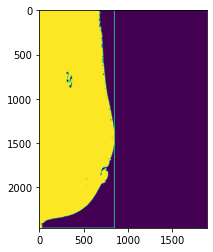

BoundingBox(x1=0, y1=0, x2=848, y2=2457)
/home/robert/data/DBT/train/DBT-P02065_DBT-S04959_lmlo_29.png


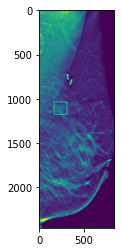

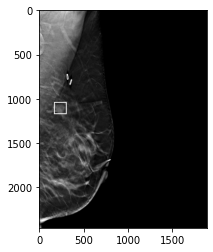

PatientID                                                  DBT-P02100
StudyUID                                                   DBT-S02965
View                                                              rcc
Subject                                                             2
Slice                                                              16
X                                                                1563
Y                                                                1080
Width                                                             221
Height                                                            180
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02100/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02100/1.2.826...
Name: 97, dtype: object
<class 'numpy.ndarray'>
DBT-P02100_DBT-S02965_rcc_16.png
bbox_roi 

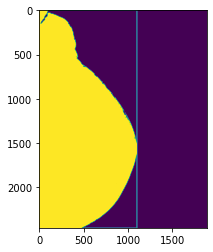

BoundingBox(x1=0, y1=0, x2=1101, y2=2457)
/home/robert/data/DBT/train/DBT-P02100_DBT-S02965_rcc_16.png


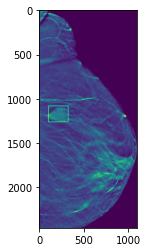

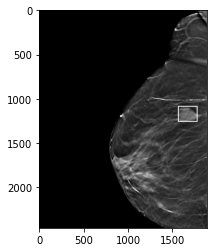

PatientID                                                  DBT-P02133
StudyUID                                                   DBT-S02082
View                                                              rcc
Subject                                                             2
Slice                                                              46
X                                                                1642
Y                                                                1686
Width                                                             148
Height                                                            128
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02133/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02133/1.2.826...
Name: 98, dtype: object
<class 'numpy.ndarray'>
DBT-P02133_DBT-S02082_rcc_46.png
bbox_roi 

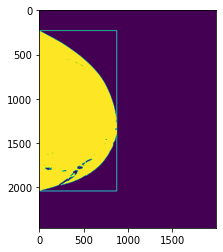

BoundingBox(x1=0, y1=231, x2=876, y2=2039)
/home/robert/data/DBT/train/DBT-P02133_DBT-S02082_rcc_46.png


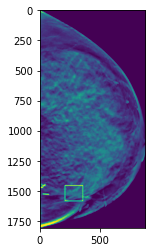

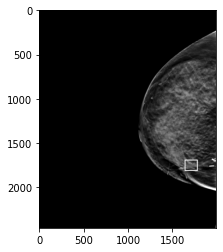

PatientID                                                  DBT-P02133
StudyUID                                                   DBT-S02082
View                                                            rmlo1
Subject                                                             2
Slice                                                              71
X                                                                1601
Y                                                                1355
Width                                                             194
Height                                                            140
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02133/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02133/1.2.826...
Name: 99, dtype: object
<class 'numpy.ndarray'>
DBT-P02133_DBT-S02082_rmlo1_71.png
bbox_ro

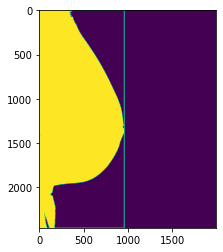

BoundingBox(x1=0, y1=0, x2=961, y2=2457)
/home/robert/data/DBT/train/DBT-P02133_DBT-S02082_rmlo1_71.png


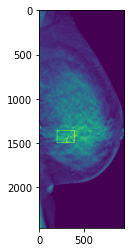

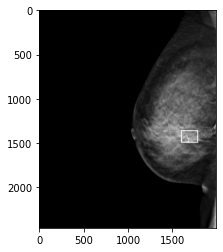

PatientID                                                  DBT-P02171
StudyUID                                                   DBT-S04537
View                                                              rcc
Subject                                                             0
Slice                                                              12
X                                                                1842
Y                                                                 711
Width                                                              85
Height                                                            116
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02171/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02171/1.2.826...
Name: 100, dtype: object
<class 'numpy.ndarray'>
DBT-P02171_DBT-S04537_rcc_12.png
bbox_roi

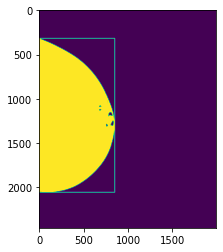

BoundingBox(x1=0, y1=319, x2=853, y2=2054)
/home/robert/data/DBT/train/DBT-P02171_DBT-S04537_rcc_12.png


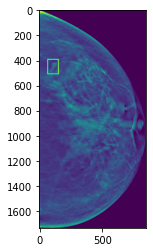

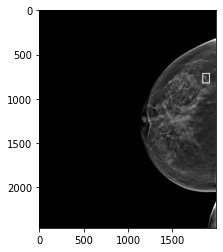

PatientID                                                  DBT-P02171
StudyUID                                                   DBT-S04537
View                                                              rcc
Subject                                                             0
Slice                                                              31
X                                                                1372
Y                                                                1098
Width                                                             327
Height                                                            271
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02171/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02171/1.2.826...
Name: 101, dtype: object
<class 'numpy.ndarray'>
DBT-P02171_DBT-S04537_rcc_31.png
bbox_roi

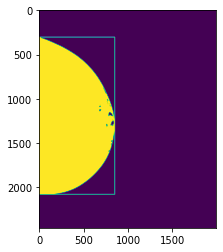

BoundingBox(x1=0, y1=305, x2=853, y2=2077)
/home/robert/data/DBT/train/DBT-P02171_DBT-S04537_rcc_31.png


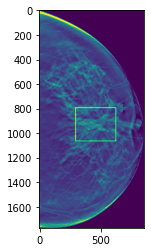

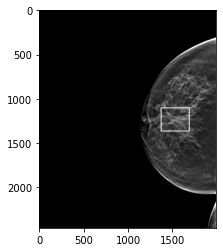

PatientID                                                  DBT-P02171
StudyUID                                                   DBT-S04537
View                                                             rmlo
Subject                                                             0
Slice                                                              14
X                                                                1764
Y                                                                1247
Width                                                             111
Height                                                             61
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02171/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02171/1.2.826...
Name: 102, dtype: object
<class 'numpy.ndarray'>
DBT-P02171_DBT-S04537_rmlo_14.png
bbox_ro

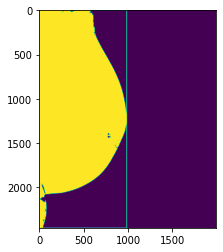

BoundingBox(x1=0, y1=0, x2=988, y2=2457)
/home/robert/data/DBT/train/DBT-P02171_DBT-S04537_rmlo_14.png


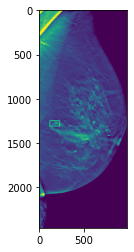

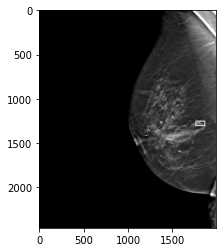

PatientID                                                  DBT-P02171
StudyUID                                                   DBT-S04537
View                                                             rmlo
Subject                                                             0
Slice                                                              29
X                                                                1195
Y                                                                1275
Width                                                             397
Height                                                            368
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02171/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02171/1.2.826...
Name: 103, dtype: object
<class 'numpy.ndarray'>
DBT-P02171_DBT-S04537_rmlo_29.png
bbox_ro

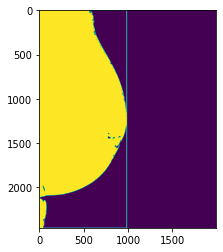

BoundingBox(x1=0, y1=0, x2=988, y2=2457)
/home/robert/data/DBT/train/DBT-P02171_DBT-S04537_rmlo_29.png


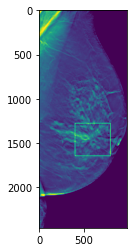

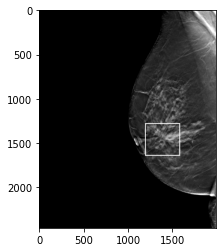

PatientID                                                  DBT-P02176
StudyUID                                                   DBT-S03078
View                                                              rcc
Subject                                                             0
Slice                                                              41
X                                                                 939
Y                                                                1469
Width                                                             229
Height                                                            186
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02176/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02176/1.2.826...
Name: 104, dtype: object
<class 'numpy.ndarray'>
DBT-P02176_DBT-S03078_rcc_41.png
bbox_roi

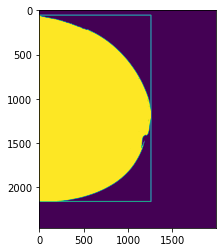

BoundingBox(x1=0, y1=57, x2=1262, y2=2157)
/home/robert/data/DBT/train/DBT-P02176_DBT-S03078_rcc_41.png


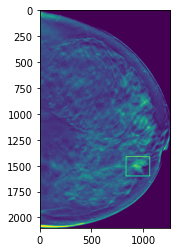

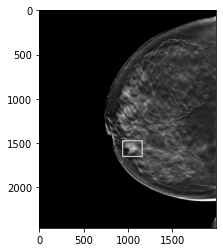

PatientID                                                  DBT-P02176
StudyUID                                                   DBT-S03078
View                                                             rmlo
Subject                                                             0
Slice                                                              63
X                                                                1014
Y                                                                1668
Width                                                             234
Height                                                            182
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02176/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02176/1.2.826...
Name: 105, dtype: object
<class 'numpy.ndarray'>
DBT-P02176_DBT-S03078_rmlo_63.png
bbox_ro

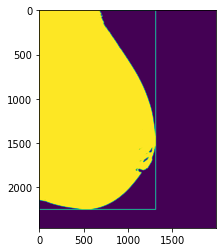

BoundingBox(x1=0, y1=0, x2=1315, y2=2247)
/home/robert/data/DBT/train/DBT-P02176_DBT-S03078_rmlo_63.png


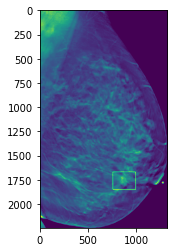

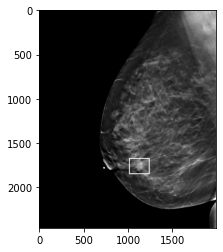

PatientID                                                  DBT-P02227
StudyUID                                                   DBT-S05014
View                                                              rcc
Subject                                                             0
Slice                                                              32
X                                                                1159
Y                                                                 636
Width                                                             552
Height                                                            513
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02227/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02227/1.2.826...
Name: 106, dtype: object
<class 'numpy.ndarray'>
DBT-P02227_DBT-S05014_rcc_32.png
bbox_roi

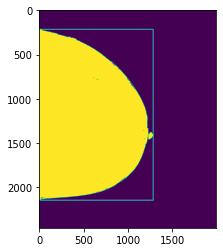

BoundingBox(x1=0, y1=217, x2=1287, y2=2143)
/home/robert/data/DBT/train/DBT-P02227_DBT-S05014_rcc_32.png


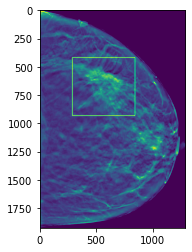

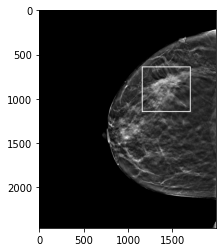

PatientID                                                  DBT-P02227
StudyUID                                                   DBT-S05014
View                                                             rmlo
Subject                                                             0
Slice                                                              30
X                                                                 873
Y                                                                 722
Width                                                             599
Height                                                            464
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02227/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02227/1.2.826...
Name: 107, dtype: object
<class 'numpy.ndarray'>
DBT-P02227_DBT-S05014_rmlo_30.png
bbox_ro

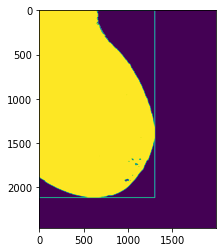

BoundingBox(x1=0, y1=0, x2=1305, y2=2113)
/home/robert/data/DBT/train/DBT-P02227_DBT-S05014_rmlo_30.png


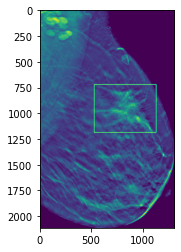

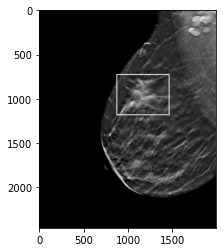

PatientID                                                  DBT-P02380
StudyUID                                                   DBT-S01233
View                                                              lcc
Subject                                                             0
Slice                                                              15
X                                                                 165
Y                                                                1499
Width                                                             222
Height                                                            188
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02380/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02380/1.2.826...
Name: 108, dtype: object
<class 'numpy.ndarray'>
DBT-P02380_DBT-S01233_lcc_15.png
dimensio

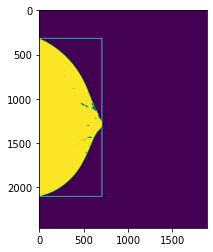

BoundingBox(x1=0, y1=319, x2=707, y2=2100)
/home/robert/data/DBT/train/DBT-P02380_DBT-S01233_lcc_15.png


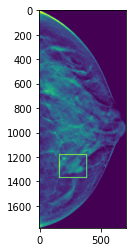

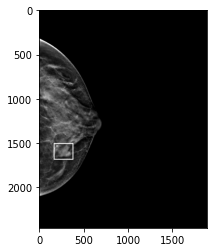

PatientID                                                  DBT-P02380
StudyUID                                                   DBT-S01233
View                                                             lmlo
Subject                                                             0
Slice                                                              29
X                                                                  61
Y                                                                1795
Width                                                             245
Height                                                            159
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02380/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02380/1.2.826...
Name: 109, dtype: object
<class 'numpy.ndarray'>
DBT-P02380_DBT-S01233_lmlo_29.png
dimensi

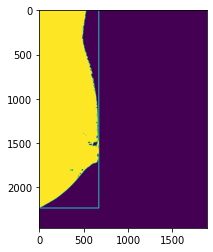

BoundingBox(x1=0, y1=0, x2=672, y2=2231)
/home/robert/data/DBT/train/DBT-P02380_DBT-S01233_lmlo_29.png


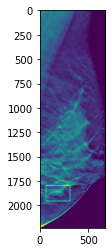

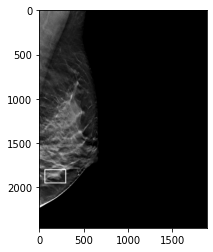

PatientID                                                  DBT-P02471
StudyUID                                                   DBT-S03894
View                                                              lcc
Subject                                                             0
Slice                                                              33
X                                                                 282
Y                                                                1513
Width                                                             170
Height                                                            160
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02471/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02471/1.2.826...
Name: 110, dtype: object
<class 'numpy.ndarray'>
DBT-P02471_DBT-S03894_lcc_33.png
dimensio

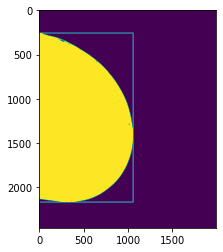

BoundingBox(x1=0, y1=259, x2=1061, y2=2164)
/home/robert/data/DBT/train/DBT-P02471_DBT-S03894_lcc_33.png


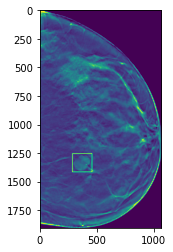

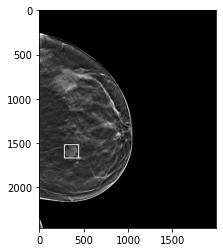

PatientID                                                  DBT-P02471
StudyUID                                                   DBT-S03894
View                                                             lmlo
Subject                                                             0
Slice                                                              39
X                                                                 219
Y                                                                1499
Width                                                             173
Height                                                            162
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02471/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02471/1.2.826...
Name: 111, dtype: object
<class 'numpy.ndarray'>
DBT-P02471_DBT-S03894_lmlo_39.png
dimensi

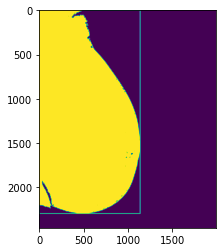

BoundingBox(x1=0, y1=0, x2=1140, y2=2293)
/home/robert/data/DBT/train/DBT-P02471_DBT-S03894_lmlo_39.png


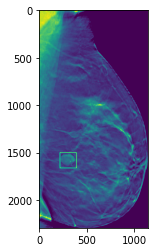

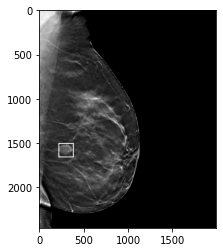

PatientID                                                  DBT-P02493
StudyUID                                                   DBT-S03027
View                                                              lcc
Subject                                                             0
Slice                                                              49
X                                                                 124
Y                                                                 831
Width                                                             293
Height                                                            297
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02493/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02493/1.2.826...
Name: 112, dtype: object
<class 'numpy.ndarray'>
DBT-P02493_DBT-S03027_lcc_49.png
dimensio

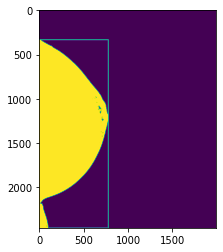

BoundingBox(x1=0, y1=334, x2=781, y2=2457)
/home/robert/data/DBT/train/DBT-P02493_DBT-S03027_lcc_49.png


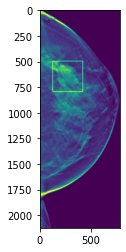

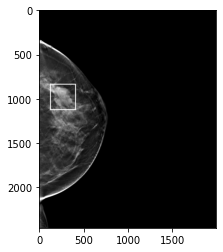

PatientID                                                  DBT-P02493
StudyUID                                                   DBT-S03027
View                                                             lmlo
Subject                                                             0
Slice                                                              27
X                                                                  87
Y                                                                   1
Width                                                             162
Height                                                            157
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02493/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02493/1.2.826...
Name: 113, dtype: object
<class 'numpy.ndarray'>
DBT-P02493_DBT-S03027_lmlo_27.png
dimensi

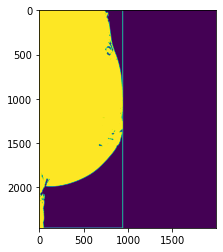

BoundingBox(x1=0, y1=0, x2=943, y2=2457)
/home/robert/data/DBT/train/DBT-P02493_DBT-S03027_lmlo_27.png


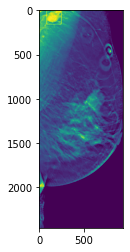

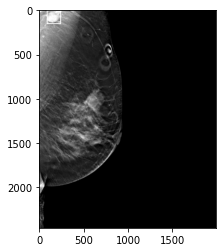

PatientID                                                  DBT-P02493
StudyUID                                                   DBT-S03027
View                                                             lmlo
Subject                                                             0
Slice                                                              39
X                                                                 477
Y                                                                 859
Width                                                             285
Height                                                            323
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02493/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02493/1.2.826...
Name: 114, dtype: object
<class 'numpy.ndarray'>
DBT-P02493_DBT-S03027_lmlo_39.png
dimensi

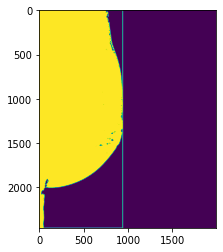

BoundingBox(x1=0, y1=0, x2=943, y2=2457)
/home/robert/data/DBT/train/DBT-P02493_DBT-S03027_lmlo_39.png


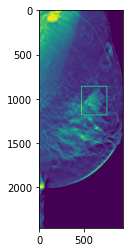

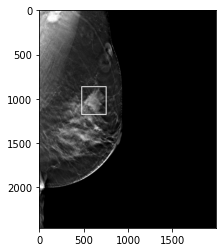

PatientID                                                  DBT-P02510
StudyUID                                                   DBT-S04417
View                                                              lcc
Subject                                                             2
Slice                                                              34
X                                                                  11
Y                                                                1066
Width                                                             284
Height                                                            359
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02510/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02510/1.2.826...
Name: 115, dtype: object
<class 'numpy.ndarray'>
DBT-P02510_DBT-S04417_lcc_34.png
dimensio

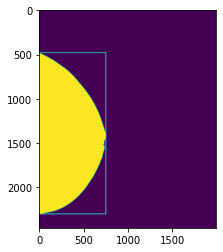

BoundingBox(x1=0, y1=479, x2=753, y2=2297)
/home/robert/data/DBT/train/DBT-P02510_DBT-S04417_lcc_34.png


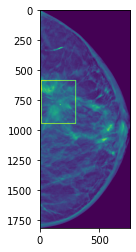

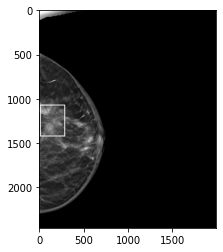

PatientID                                                  DBT-P02510
StudyUID                                                   DBT-S04417
View                                                             lmlo
Subject                                                             2
Slice                                                              28
X                                                                 351
Y                                                                 966
Width                                                             164
Height                                                            300
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02510/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02510/1.2.826...
Name: 116, dtype: object
<class 'numpy.ndarray'>
DBT-P02510_DBT-S04417_lmlo_28.png
dimensi

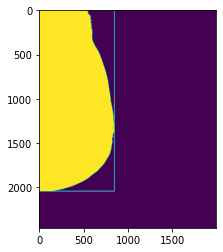

BoundingBox(x1=0, y1=0, x2=850, y2=2041)
/home/robert/data/DBT/train/DBT-P02510_DBT-S04417_lmlo_28.png


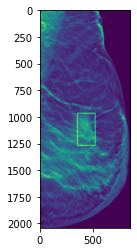

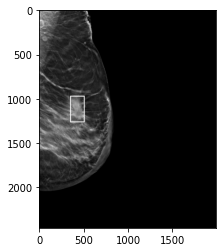

PatientID                                                  DBT-P02532
StudyUID                                                   DBT-S02099
View                                                              lcc
Subject                                                             2
Slice                                                              43
X                                                                 834
Y                                                                1171
Width                                                             223
Height                                                            230
Class                                                          cancer
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02532/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02532/1.2.826...
Name: 117, dtype: object
<class 'numpy.ndarray'>
DBT-P02532_DBT-S02099_lcc_43.png
dimensio

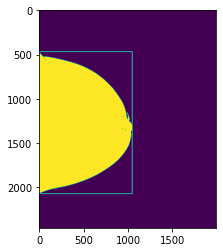

BoundingBox(x1=0, y1=468, x2=1051, y2=2069)
/home/robert/data/DBT/train/DBT-P02532_DBT-S02099_lcc_43.png


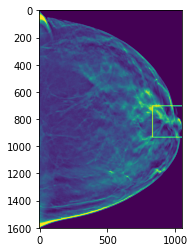

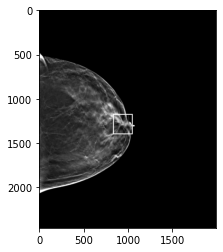

PatientID                                                  DBT-P02532
StudyUID                                                   DBT-S02099
View                                                              lcc
Subject                                                             2
Slice                                                              54
X                                                                 310
Y                                                                 885
Width                                                             318
Height                                                            310
Class                                                          cancer
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02532/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02532/1.2.826...
Name: 118, dtype: object
<class 'numpy.ndarray'>
DBT-P02532_DBT-S02099_lcc_54.png
dimensio

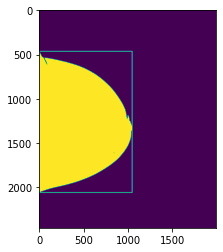

BoundingBox(x1=0, y1=465, x2=1050, y2=2056)
/home/robert/data/DBT/train/DBT-P02532_DBT-S02099_lcc_54.png


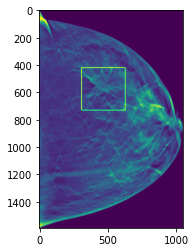

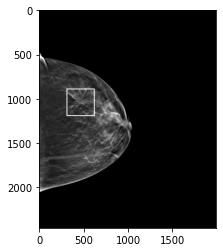

PatientID                                                  DBT-P02532
StudyUID                                                   DBT-S02099
View                                                             lmlo
Subject                                                             2
Slice                                                              36
X                                                                 831
Y                                                                1229
Width                                                             206
Height                                                            253
Class                                                          cancer
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02532/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02532/1.2.826...
Name: 119, dtype: object
<class 'numpy.ndarray'>
DBT-P02532_DBT-S02099_lmlo_36.png
dimensi

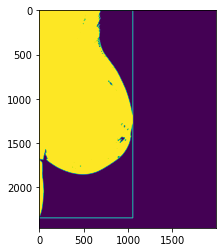

BoundingBox(x1=0, y1=0, x2=1057, y2=2342)
/home/robert/data/DBT/train/DBT-P02532_DBT-S02099_lmlo_36.png


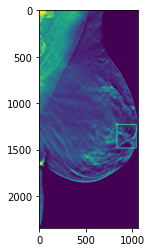

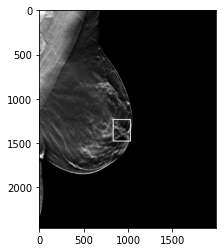

PatientID                                                  DBT-P02532
StudyUID                                                   DBT-S02099
View                                                             lmlo
Subject                                                             2
Slice                                                              45
X                                                                 660
Y                                                                 799
Width                                                             258
Height                                                            264
Class                                                          cancer
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02532/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02532/1.2.826...
Name: 120, dtype: object
<class 'numpy.ndarray'>
DBT-P02532_DBT-S02099_lmlo_45.png
dimensi

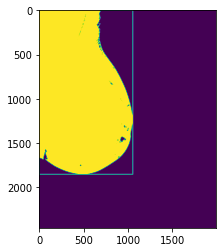

BoundingBox(x1=0, y1=0, x2=1057, y2=1851)
/home/robert/data/DBT/train/DBT-P02532_DBT-S02099_lmlo_45.png


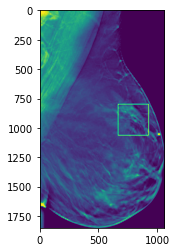

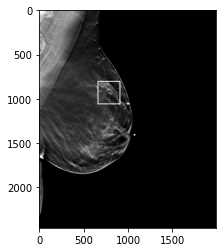

PatientID                                                  DBT-P02579
StudyUID                                                   DBT-S00929
View                                                              lcc
Subject                                                             0
Slice                                                              18
X                                                                 342
Y                                                                 975
Width                                                             201
Height                                                            270
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02579/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02579/1.2.826...
Name: 121, dtype: object
<class 'numpy.ndarray'>
DBT-P02579_DBT-S00929_lcc_18.png
dimensio

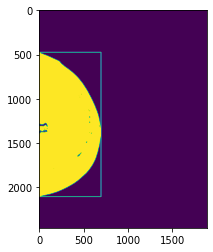

BoundingBox(x1=0, y1=476, x2=697, y2=2102)
/home/robert/data/DBT/train/DBT-P02579_DBT-S00929_lcc_18.png


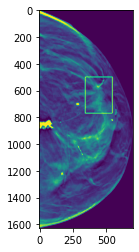

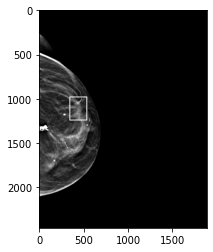

PatientID                                                  DBT-P02579
StudyUID                                                   DBT-S00929
View                                                             lmlo
Subject                                                             0
Slice                                                              14
X                                                                 395
Y                                                                1268
Width                                                             205
Height                                                            319
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02579/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02579/1.2.826...
Name: 122, dtype: object
<class 'numpy.ndarray'>
DBT-P02579_DBT-S00929_lmlo_14.png
dimensi

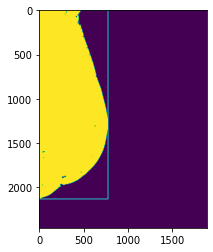

BoundingBox(x1=0, y1=0, x2=776, y2=2129)
/home/robert/data/DBT/train/DBT-P02579_DBT-S00929_lmlo_14.png


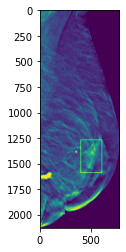

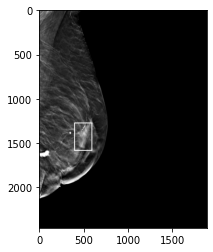

PatientID                                                  DBT-P02582
StudyUID                                                   DBT-S01997
View                                                              lcc
Subject                                                             0
Slice                                                              40
X                                                                   8
Y                                                                 884
Width                                                             286
Height                                                            619
Class                                                          cancer
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02582/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02582/1.2.826...
Name: 123, dtype: object
<class 'numpy.ndarray'>
DBT-P02582_DBT-S01997_lcc_40.png
dimensio

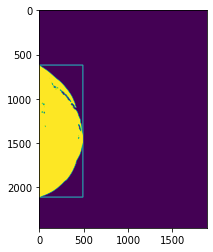

BoundingBox(x1=0, y1=620, x2=493, y2=2108)
/home/robert/data/DBT/train/DBT-P02582_DBT-S01997_lcc_40.png


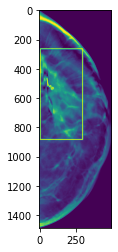

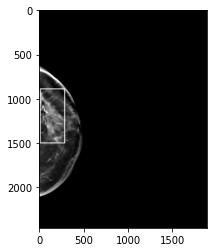

PatientID                                                  DBT-P02582
StudyUID                                                   DBT-S01997
View                                                             lmlo
Subject                                                             0
Slice                                                              32
X                                                                 160
Y                                                                 759
Width                                                             338
Height                                                            865
Class                                                          cancer
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02582/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02582/1.2.826...
Name: 124, dtype: object
<class 'numpy.ndarray'>
DBT-P02582_DBT-S01997_lmlo_32.png
dimensi

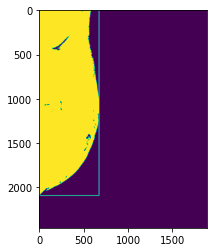

BoundingBox(x1=0, y1=0, x2=675, y2=2090)
/home/robert/data/DBT/train/DBT-P02582_DBT-S01997_lmlo_32.png


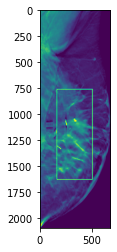

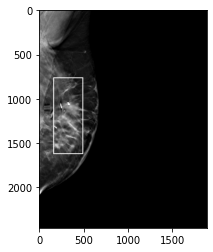

PatientID                                                  DBT-P02588
StudyUID                                                   DBT-S04431
View                                                              lcc
Subject                                                             0
Slice                                                              24
X                                                                 464
Y                                                                1595
Width                                                             233
Height                                                            253
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02588/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02588/1.2.826...
Name: 125, dtype: object
<class 'numpy.ndarray'>
DBT-P02588_DBT-S04431_lcc_24.png
dimensio

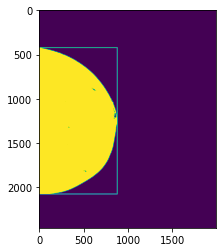

BoundingBox(x1=0, y1=423, x2=882, y2=2073)
/home/robert/data/DBT/train/DBT-P02588_DBT-S04431_lcc_24.png


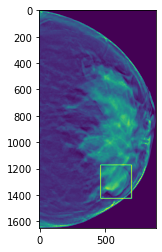

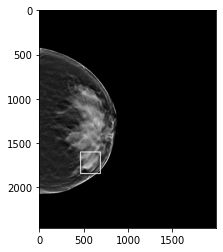

PatientID                                                  DBT-P02588
StudyUID                                                   DBT-S04431
View                                                             lmlo
Subject                                                             0
Slice                                                              41
X                                                                 415
Y                                                                1375
Width                                                             267
Height                                                            241
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02588/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02588/1.2.826...
Name: 126, dtype: object
<class 'numpy.ndarray'>
DBT-P02588_DBT-S04431_lmlo_41.png
dimensi

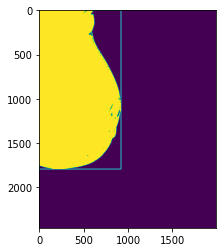

BoundingBox(x1=0, y1=0, x2=924, y2=1792)
/home/robert/data/DBT/train/DBT-P02588_DBT-S04431_lmlo_41.png


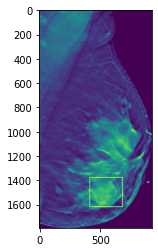

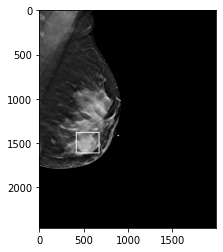

PatientID                                                  DBT-P02736
StudyUID                                                   DBT-S03542
View                                                              lcc
Subject                                                             0
Slice                                                              15
X                                                                 552
Y                                                                 932
Width                                                             235
Height                                                            196
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02736/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02736/1.2.826...
Name: 127, dtype: object
<class 'numpy.ndarray'>
DBT-P02736_DBT-S03542_lcc_15.png
dimensio

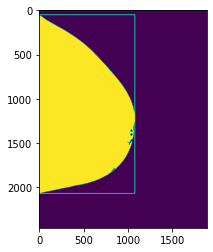

BoundingBox(x1=0, y1=52, x2=1077, y2=2067)
/home/robert/data/DBT/train/DBT-P02736_DBT-S03542_lcc_15.png


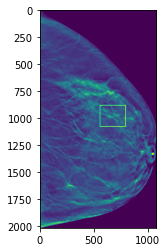

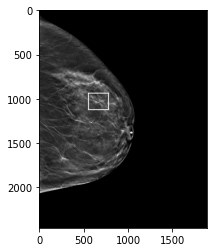

PatientID                                                  DBT-P02736
StudyUID                                                   DBT-S03542
View                                                             lmlo
Subject                                                             0
Slice                                                              16
X                                                                 568
Y                                                                1464
Width                                                             196
Height                                                            156
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02736/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02736/1.2.826...
Name: 128, dtype: object
<class 'numpy.ndarray'>
DBT-P02736_DBT-S03542_lmlo_16.png
dimensi

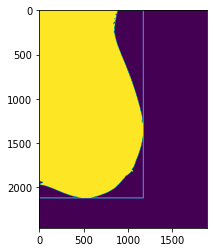

BoundingBox(x1=0, y1=0, x2=1173, y2=2117)
/home/robert/data/DBT/train/DBT-P02736_DBT-S03542_lmlo_16.png


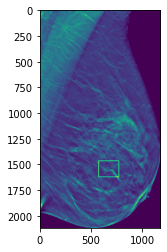

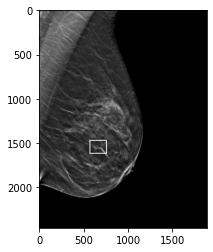

PatientID                                                  DBT-P02738
StudyUID                                                   DBT-S01258
View                                                              lcc
Subject                                                             2
Slice                                                               6
X                                                                 121
Y                                                                1132
Width                                                             163
Height                                                            172
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02738/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02738/1.2.826...
Name: 129, dtype: object
<class 'numpy.ndarray'>
DBT-P02738_DBT-S01258_lcc_6.png
dimension

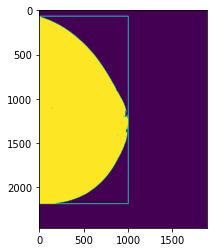

BoundingBox(x1=0, y1=69, x2=1004, y2=2182)
/home/robert/data/DBT/train/DBT-P02738_DBT-S01258_lcc_6.png


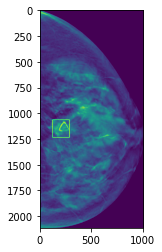

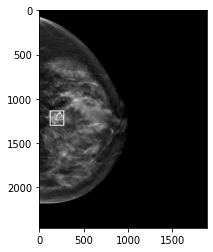

PatientID                                                  DBT-P02738
StudyUID                                                   DBT-S01258
View                                                             lmlo
Subject                                                             2
Slice                                                              17
X                                                                 242
Y                                                                1923
Width                                                             209
Height                                                            215
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02738/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02738/1.2.826...
Name: 130, dtype: object
<class 'numpy.ndarray'>
DBT-P02738_DBT-S01258_lmlo_17.png
dimensi

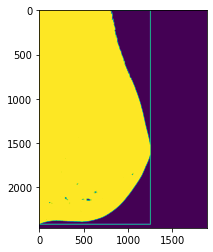

BoundingBox(x1=0, y1=0, x2=1253, y2=2414)
/home/robert/data/DBT/train/DBT-P02738_DBT-S01258_lmlo_17.png


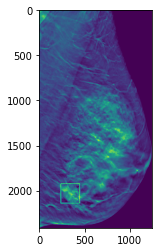

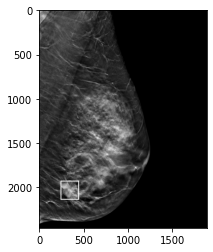

PatientID                                                  DBT-P02750
StudyUID                                                   DBT-S00905
View                                                             rmlo
Subject                                                             0
Slice                                                              33
X                                                                1724
Y                                                                1963
Width                                                             164
Height                                                            148
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02750/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02750/1.2.826...
Name: 131, dtype: object
<class 'numpy.ndarray'>
DBT-P02750_DBT-S00905_rmlo_33.png
bbox_ro

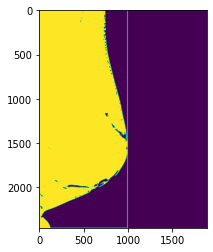

BoundingBox(x1=0, y1=0, x2=995, y2=2457)
/home/robert/data/DBT/train/DBT-P02750_DBT-S00905_rmlo_33.png


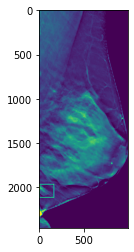

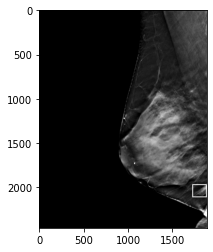

PatientID                                                  DBT-P02750
StudyUID                                                   DBT-S00905
View                                                            rmlo1
Subject                                                             0
Slice                                                              32
X                                                                1664
Y                                                                2137
Width                                                             224
Height                                                            155
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02750/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02750/1.2.826...
Name: 132, dtype: object
<class 'numpy.ndarray'>
DBT-P02750_DBT-S00905_rmlo1_32.png
bbox_r

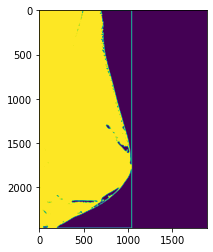

BoundingBox(x1=0, y1=0, x2=1042, y2=2457)
/home/robert/data/DBT/train/DBT-P02750_DBT-S00905_rmlo1_32.png


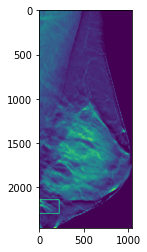

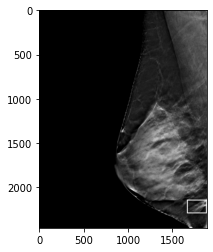

PatientID                                                  DBT-P02798
StudyUID                                                   DBT-S01770
View                                                              lcc
Subject                                                             0
Slice                                                              50
X                                                                1018
Y                                                                1322
Width                                                             108
Height                                                             79
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02798/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02798/1.2.826...
Name: 133, dtype: object
<class 'numpy.ndarray'>
DBT-P02798_DBT-S01770_lcc_50.png
dimensio

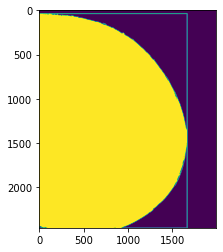

BoundingBox(x1=0, y1=40, x2=1670, y2=2457)
/home/robert/data/DBT/train/DBT-P02798_DBT-S01770_lcc_50.png


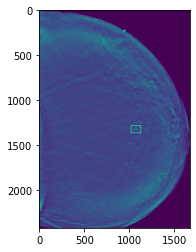

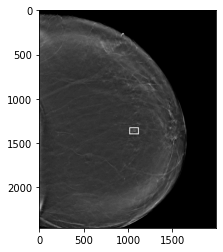

PatientID                                                  DBT-P02798
StudyUID                                                   DBT-S01770
View                                                             lmlo
Subject                                                             0
Slice                                                              57
X                                                                1187
Y                                                                1751
Width                                                              98
Height                                                             87
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02798/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02798/1.2.826...
Name: 134, dtype: object
<class 'numpy.ndarray'>
DBT-P02798_DBT-S01770_lmlo_57.png
dimensi

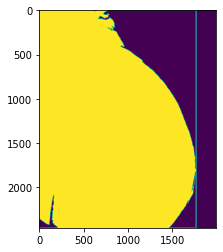

BoundingBox(x1=0, y1=0, x2=1771, y2=2457)
/home/robert/data/DBT/train/DBT-P02798_DBT-S01770_lmlo_57.png


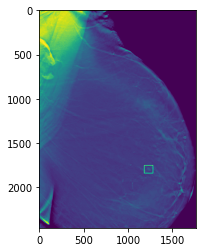

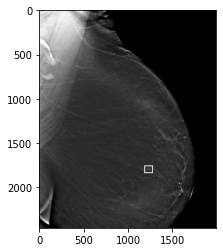

PatientID                                                  DBT-P02798
StudyUID                                                   DBT-S01770
View                                                            lmlo1
Subject                                                             0
Slice                                                              58
X                                                                 859
Y                                                                1109
Width                                                             103
Height                                                             63
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02798/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02798/1.2.826...
Name: 135, dtype: object
<class 'numpy.ndarray'>
DBT-P02798_DBT-S01770_lmlo1_58.png
dimens

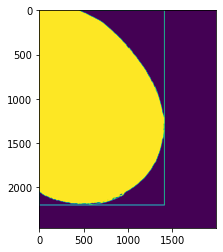

BoundingBox(x1=0, y1=0, x2=1414, y2=2197)
/home/robert/data/DBT/train/DBT-P02798_DBT-S01770_lmlo1_58.png


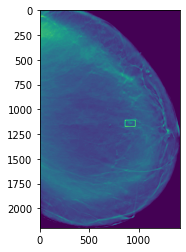

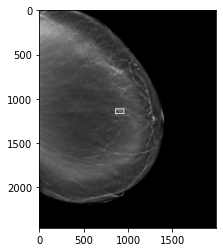

PatientID                                                  DBT-P02843
StudyUID                                                   DBT-S01347
View                                                              lcc
Subject                                                             0
Slice                                                              22
X                                                                 958
Y                                                                1559
Width                                                             178
Height                                                            227
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02843/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02843/1.2.826...
Name: 136, dtype: object
<class 'numpy.ndarray'>
DBT-P02843_DBT-S01347_lcc_22.png
dimensio

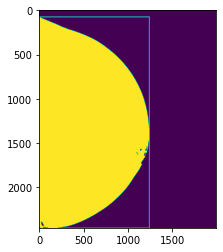

BoundingBox(x1=0, y1=77, x2=1244, y2=2457)
/home/robert/data/DBT/train/DBT-P02843_DBT-S01347_lcc_22.png


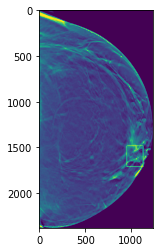

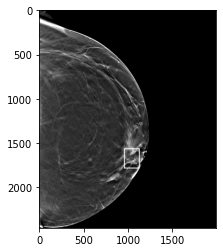

PatientID                                                  DBT-P02843
StudyUID                                                   DBT-S01347
View                                                             lmlo
Subject                                                             0
Slice                                                              34
X                                                                1085
Y                                                                1660
Width                                                             155
Height                                                            262
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02843/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02843/1.2.826...
Name: 137, dtype: object
<class 'numpy.ndarray'>
DBT-P02843_DBT-S01347_lmlo_34.png
dimensi

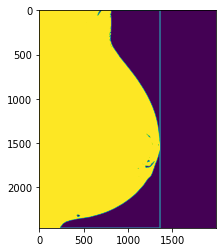

BoundingBox(x1=0, y1=0, x2=1364, y2=2457)
/home/robert/data/DBT/train/DBT-P02843_DBT-S01347_lmlo_34.png


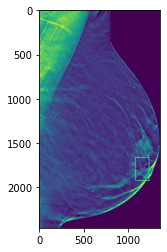

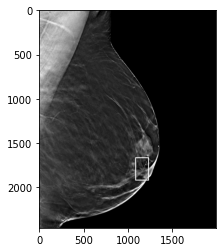

PatientID                                                  DBT-P02919
StudyUID                                                   DBT-S01259
View                                                              lcc
Subject                                                             0
Slice                                                              29
X                                                                 288
Y                                                                 761
Width                                                             204
Height                                                            162
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02919/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02919/1.2.826...
Name: 138, dtype: object
<class 'numpy.ndarray'>
DBT-P02919_DBT-S01259_lcc_29.png
dimensio

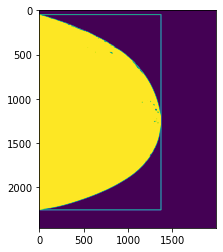

BoundingBox(x1=0, y1=51, x2=1375, y2=2252)
/home/robert/data/DBT/train/DBT-P02919_DBT-S01259_lcc_29.png


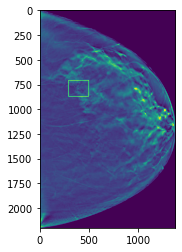

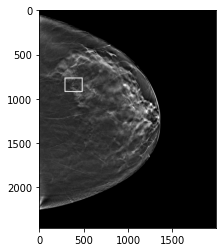

PatientID                                                  DBT-P02919
StudyUID                                                   DBT-S01259
View                                                             lmlo
Subject                                                             0
Slice                                                              33
X                                                                 474
Y                                                                1070
Width                                                             303
Height                                                            220
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02919/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02919/1.2.826...
Name: 139, dtype: object
<class 'numpy.ndarray'>
DBT-P02919_DBT-S01259_lmlo_33.png
dimensi

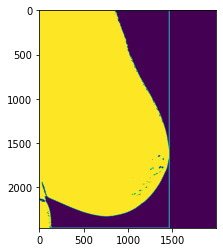

BoundingBox(x1=0, y1=0, x2=1468, y2=2457)
/home/robert/data/DBT/train/DBT-P02919_DBT-S01259_lmlo_33.png


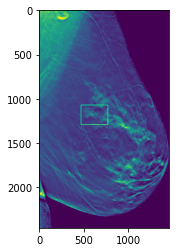

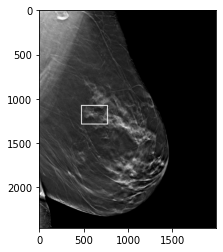

PatientID                                                  DBT-P02919
StudyUID                                                   DBT-S01259
View                                                              rcc
Subject                                                             0
Slice                                                              48
X                                                                 667
Y                                                                1133
Width                                                             168
Height                                                            115
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02919/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02919/1.2.826...
Name: 140, dtype: object
<class 'numpy.ndarray'>
DBT-P02919_DBT-S01259_rcc_48.png
bbox_roi

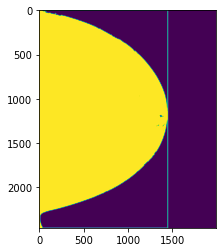

BoundingBox(x1=0, y1=0, x2=1451, y2=2457)
/home/robert/data/DBT/train/DBT-P02919_DBT-S01259_rcc_48.png


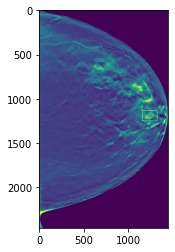

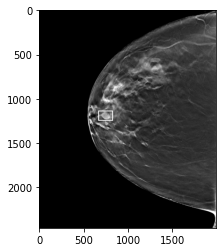

PatientID                                                  DBT-P02919
StudyUID                                                   DBT-S01259
View                                                             rmlo
Subject                                                             0
Slice                                                              26
X                                                                 605
Y                                                                1559
Width                                                             144
Height                                                            119
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02919/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02919/1.2.826...
Name: 141, dtype: object
<class 'numpy.ndarray'>
DBT-P02919_DBT-S01259_rmlo_26.png
bbox_ro

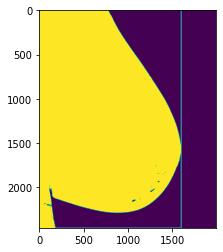

BoundingBox(x1=0, y1=0, x2=1603, y2=2457)
/home/robert/data/DBT/train/DBT-P02919_DBT-S01259_rmlo_26.png


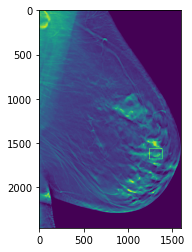

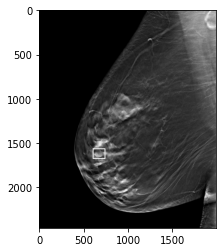

PatientID                                                  DBT-P02935
StudyUID                                                   DBT-S00614
View                                                              rcc
Subject                                                             0
Slice                                                              28
X                                                                1802
Y                                                                 991
Width                                                             107
Height                                                             78
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02935/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02935/1.2.826...
Name: 142, dtype: object
<class 'numpy.ndarray'>
DBT-P02935_DBT-S00614_rcc_28.png
bbox_roi

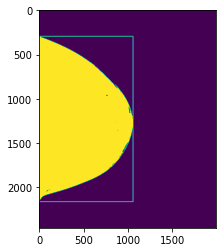

BoundingBox(x1=0, y1=296, x2=1060, y2=2159)
/home/robert/data/DBT/train/DBT-P02935_DBT-S00614_rcc_28.png


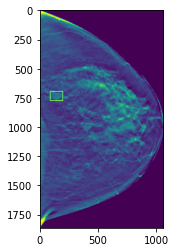

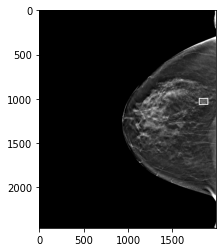

PatientID                                                  DBT-P02935
StudyUID                                                   DBT-S00614
View                                                              rcc
Subject                                                             0
Slice                                                              35
X                                                                1509
Y                                                                1183
Width                                                             186
Height                                                            170
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02935/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02935/1.2.826...
Name: 143, dtype: object
<class 'numpy.ndarray'>
DBT-P02935_DBT-S00614_rcc_35.png
bbox_roi

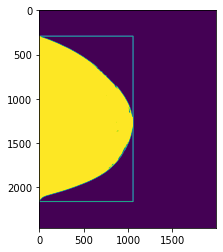

BoundingBox(x1=0, y1=294, x2=1060, y2=2158)
/home/robert/data/DBT/train/DBT-P02935_DBT-S00614_rcc_35.png


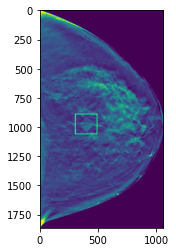

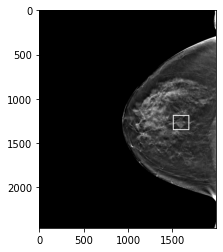

PatientID                                                  DBT-P02935
StudyUID                                                   DBT-S00614
View                                                             rmlo
Subject                                                             0
Slice                                                              35
X                                                                1738
Y                                                                1025
Width                                                             100
Height                                                             74
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02935/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02935/1.2.826...
Name: 144, dtype: object
<class 'numpy.ndarray'>
DBT-P02935_DBT-S00614_rmlo_35.png
bbox_ro

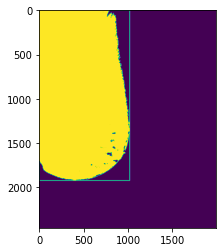

BoundingBox(x1=0, y1=0, x2=1022, y2=1921)
/home/robert/data/DBT/train/DBT-P02935_DBT-S00614_rmlo_35.png


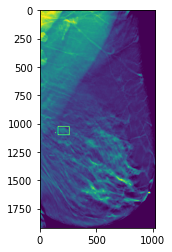

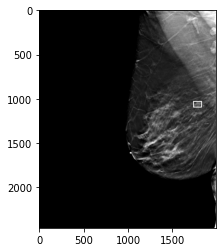

PatientID                                                  DBT-P02935
StudyUID                                                   DBT-S00614
View                                                             rmlo
Subject                                                             0
Slice                                                              41
X                                                                1475
Y                                                                1126
Width                                                             151
Height                                                            115
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P02935/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P02935/1.2.826...
Name: 145, dtype: object
<class 'numpy.ndarray'>
DBT-P02935_DBT-S00614_rmlo_41.png
bbox_ro

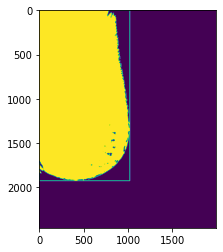

BoundingBox(x1=0, y1=0, x2=1023, y2=1923)
/home/robert/data/DBT/train/DBT-P02935_DBT-S00614_rmlo_41.png


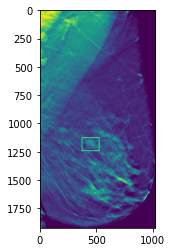

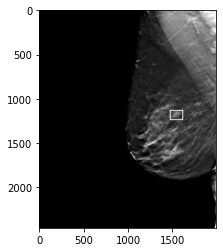

PatientID                                                  DBT-P03009
StudyUID                                                   DBT-S01465
View                                                              rcc
Subject                                                             2
Slice                                                              27
X                                                                1067
Y                                                                 799
Width                                                             598
Height                                                            613
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03009/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03009/1.2.826...
Name: 146, dtype: object
<class 'numpy.ndarray'>
DBT-P03009_DBT-S01465_rcc_27.png
bbox_roi

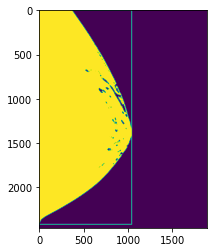

BoundingBox(x1=0, y1=0, x2=1042, y2=2415)
/home/robert/data/DBT/train/DBT-P03009_DBT-S01465_rcc_27.png


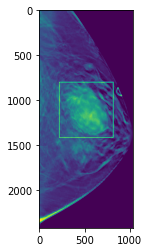

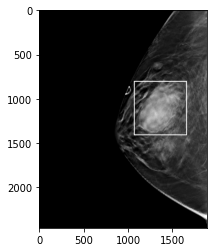

PatientID                                                  DBT-P03009
StudyUID                                                   DBT-S01465
View                                                             rmlo
Subject                                                             2
Slice                                                              16
X                                                                 984
Y                                                                1107
Width                                                             642
Height                                                            627
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03009/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03009/1.2.826...
Name: 147, dtype: object
<class 'numpy.ndarray'>
DBT-P03009_DBT-S01465_rmlo_16.png
bbox_ro

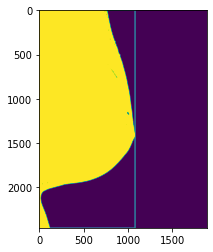

BoundingBox(x1=0, y1=0, x2=1080, y2=2457)
/home/robert/data/DBT/train/DBT-P03009_DBT-S01465_rmlo_16.png


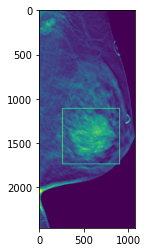

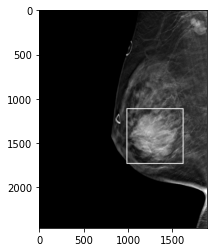

PatientID                                                  DBT-P03017
StudyUID                                                   DBT-S04280
View                                                              rcc
Subject                                                             0
Slice                                                              17
X                                                                1296
Y                                                                1052
Width                                                             342
Height                                                            224
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03017/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03017/1.2.826...
Name: 148, dtype: object
<class 'numpy.ndarray'>
DBT-P03017_DBT-S04280_rcc_17.png
bbox_roi

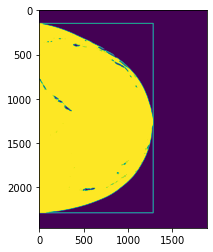

BoundingBox(x1=0, y1=150, x2=1284, y2=2285)
/home/robert/data/DBT/train/DBT-P03017_DBT-S04280_rcc_17.png


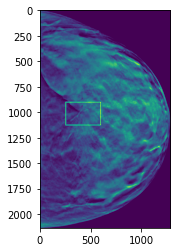

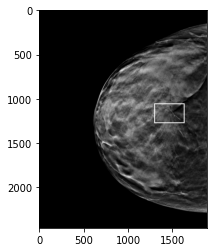

PatientID                                                  DBT-P03017
StudyUID                                                   DBT-S04280
View                                                             rmlo
Subject                                                             0
Slice                                                              31
X                                                                1128
Y                                                                 979
Width                                                             375
Height                                                            310
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03017/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03017/1.2.826...
Name: 149, dtype: object
<class 'numpy.ndarray'>
DBT-P03017_DBT-S04280_rmlo_31.png
bbox_ro

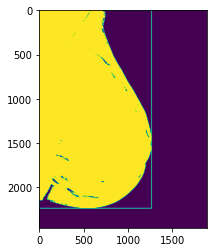

BoundingBox(x1=0, y1=0, x2=1265, y2=2234)
/home/robert/data/DBT/train/DBT-P03017_DBT-S04280_rmlo_31.png


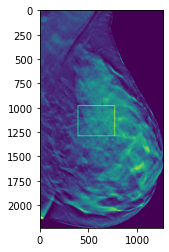

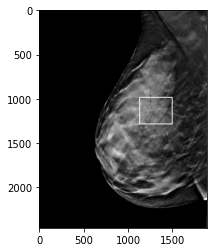

PatientID                                                  DBT-P03073
StudyUID                                                   DBT-S04591
View                                                              lcc
Subject                                                             0
Slice                                                              35
X                                                                 271
Y                                                                1057
Width                                                             534
Height                                                            433
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03073/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03073/1.2.826...
Name: 150, dtype: object
<class 'numpy.ndarray'>
DBT-P03073_DBT-S04591_lcc_35.png
dimensio

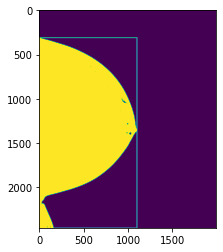

BoundingBox(x1=0, y1=311, x2=1104, y2=2457)
/home/robert/data/DBT/train/DBT-P03073_DBT-S04591_lcc_35.png


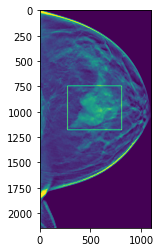

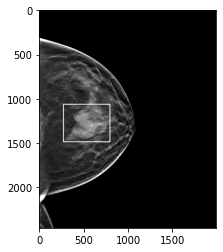

PatientID                                                  DBT-P03073
StudyUID                                                   DBT-S04591
View                                                             lmlo
Subject                                                             0
Slice                                                              19
X                                                                 236
Y                                                                 612
Width                                                             139
Height                                                            110
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03073/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03073/1.2.826...
Name: 151, dtype: object
<class 'numpy.ndarray'>
DBT-P03073_DBT-S04591_lmlo_19.png
dimensi

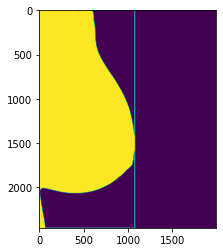

BoundingBox(x1=0, y1=0, x2=1079, y2=2457)
/home/robert/data/DBT/train/DBT-P03073_DBT-S04591_lmlo_19.png


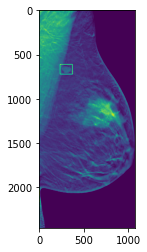

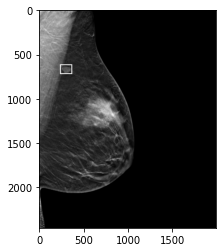

PatientID                                                  DBT-P03073
StudyUID                                                   DBT-S04591
View                                                             lmlo
Subject                                                             0
Slice                                                              44
X                                                                 326
Y                                                                 924
Width                                                             563
Height                                                            423
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03073/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03073/1.2.826...
Name: 152, dtype: object
<class 'numpy.ndarray'>
DBT-P03073_DBT-S04591_lmlo_44.png
dimensi

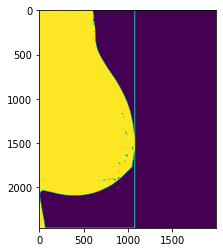

BoundingBox(x1=0, y1=0, x2=1079, y2=2457)
/home/robert/data/DBT/train/DBT-P03073_DBT-S04591_lmlo_44.png


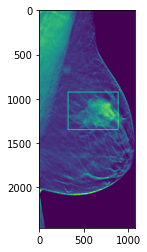

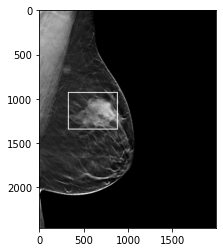

PatientID                                                  DBT-P03085
StudyUID                                                   DBT-S00863
View                                                              lcc
Subject                                                             0
Slice                                                              26
X                                                                 165
Y                                                                1359
Width                                                             329
Height                                                            197
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03085/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03085/1.2.826...
Name: 153, dtype: object
<class 'numpy.ndarray'>
DBT-P03085_DBT-S00863_lcc_26.png
dimensio

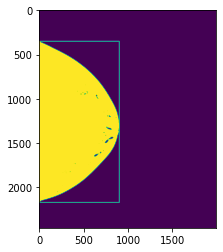

BoundingBox(x1=0, y1=352, x2=905, y2=2168)
/home/robert/data/DBT/train/DBT-P03085_DBT-S00863_lcc_26.png


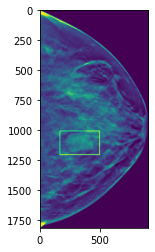

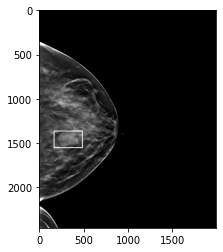

PatientID                                                  DBT-P03085
StudyUID                                                   DBT-S00863
View                                                             lmlo
Subject                                                             0
Slice                                                              35
X                                                                 167
Y                                                                1156
Width                                                             262
Height                                                            235
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03085/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03085/1.2.826...
Name: 154, dtype: object
<class 'numpy.ndarray'>
DBT-P03085_DBT-S00863_lmlo_35.png
dimensi

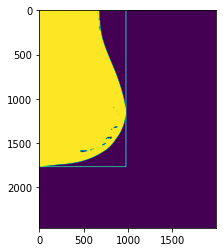

BoundingBox(x1=0, y1=0, x2=980, y2=1764)
/home/robert/data/DBT/train/DBT-P03085_DBT-S00863_lmlo_35.png


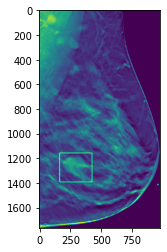

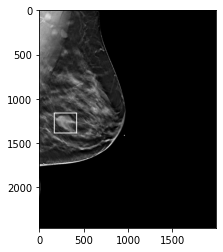

PatientID                                                  DBT-P03176
StudyUID                                                   DBT-S03730
View                                                              lcc
Subject                                                             0
Slice                                                              11
X                                                                  43
Y                                                                1216
Width                                                             162
Height                                                            119
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03176/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03176/1.2.826...
Name: 155, dtype: object
<class 'numpy.ndarray'>
DBT-P03176_DBT-S03730_lcc_11.png
dimensio

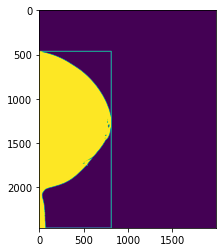

BoundingBox(x1=0, y1=465, x2=814, y2=2457)
/home/robert/data/DBT/train/DBT-P03176_DBT-S03730_lcc_11.png


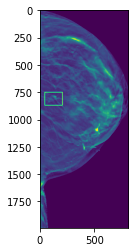

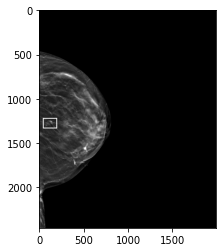

PatientID                                                  DBT-P03176
StudyUID                                                   DBT-S03730
View                                                             lmlo
Subject                                                             0
Slice                                                              12
X                                                                  76
Y                                                                1665
Width                                                             178
Height                                                            126
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03176/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03176/1.2.826...
Name: 156, dtype: object
<class 'numpy.ndarray'>
DBT-P03176_DBT-S03730_lmlo_12.png
dimensi

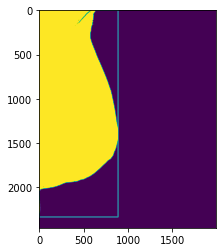

BoundingBox(x1=0, y1=0, x2=891, y2=2332)
/home/robert/data/DBT/train/DBT-P03176_DBT-S03730_lmlo_12.png


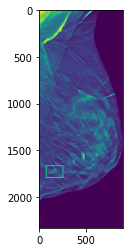

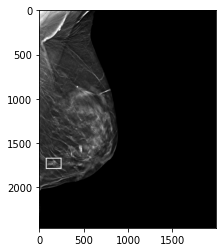

PatientID                                                  DBT-P03203
StudyUID                                                   DBT-S04862
View                                                              lcc
Subject                                                             0
Slice                                                              22
X                                                                 753
Y                                                                1238
Width                                                             113
Height                                                            241
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03203/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03203/1.2.826...
Name: 157, dtype: object
<class 'numpy.ndarray'>
DBT-P03203_DBT-S04862_lcc_22.png
dimensio

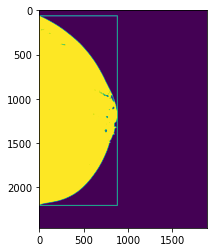

BoundingBox(x1=0, y1=65, x2=881, y2=2202)
/home/robert/data/DBT/train/DBT-P03203_DBT-S04862_lcc_22.png


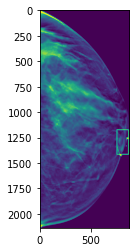

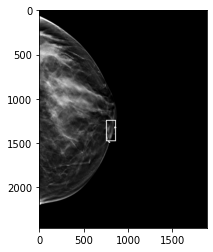

PatientID                                                  DBT-P03203
StudyUID                                                   DBT-S04862
View                                                             lmlo
Subject                                                             0
Slice                                                              38
X                                                                 773
Y                                                                1558
Width                                                             139
Height                                                            256
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03203/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03203/1.2.826...
Name: 158, dtype: object
<class 'numpy.ndarray'>
DBT-P03203_DBT-S04862_lmlo_38.png
dimensi

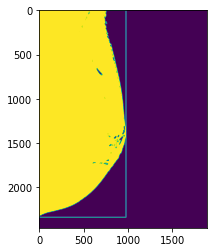

BoundingBox(x1=0, y1=0, x2=978, y2=2335)
/home/robert/data/DBT/train/DBT-P03203_DBT-S04862_lmlo_38.png


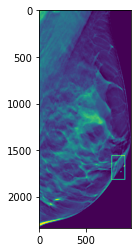

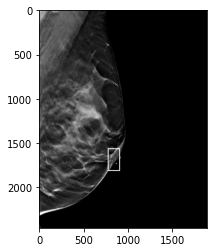

PatientID                                                  DBT-P03212
StudyUID                                                   DBT-S02198
View                                                              lcc
Subject                                                             0
Slice                                                              25
X                                                                   5
Y                                                                 302
Width                                                             150
Height                                                            241
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03212/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03212/1.2.826...
Name: 159, dtype: object
<class 'numpy.ndarray'>
DBT-P03212_DBT-S02198_lcc_25.png
dimensio

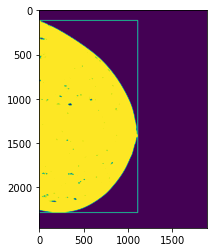

BoundingBox(x1=0, y1=117, x2=1110, y2=2282)
/home/robert/data/DBT/train/DBT-P03212_DBT-S02198_lcc_25.png


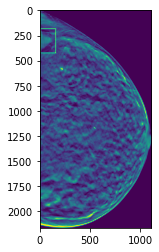

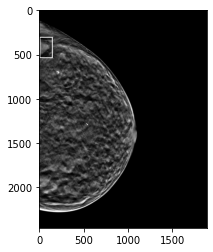

PatientID                                                  DBT-P03212
StudyUID                                                   DBT-S02198
View                                                             lmlo
Subject                                                             0
Slice                                                              11
X                                                                 210
Y                                                                 695
Width                                                             305
Height                                                            244
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03212/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03212/1.2.826...
Name: 160, dtype: object
<class 'numpy.ndarray'>
DBT-P03212_DBT-S02198_lmlo_11.png
dimensi

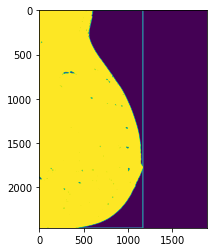

BoundingBox(x1=0, y1=0, x2=1168, y2=2457)
/home/robert/data/DBT/train/DBT-P03212_DBT-S02198_lmlo_11.png


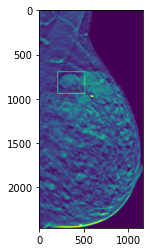

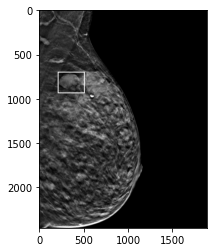

PatientID                                                  DBT-P03218
StudyUID                                                   DBT-S04050
View                                                              lcc
Subject                                                             0
Slice                                                              51
X                                                                 339
Y                                                                1642
Width                                                             217
Height                                                            154
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03218/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03218/1.2.826...
Name: 161, dtype: object
<class 'numpy.ndarray'>
DBT-P03218_DBT-S04050_lcc_51.png
dimensio

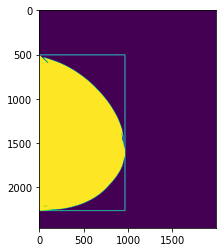

BoundingBox(x1=0, y1=505, x2=969, y2=2260)
/home/robert/data/DBT/train/DBT-P03218_DBT-S04050_lcc_51.png


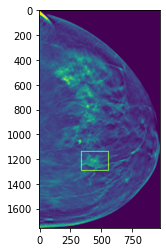

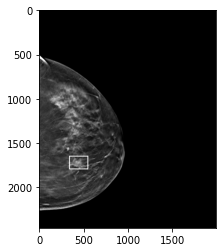

PatientID                                                  DBT-P03218
StudyUID                                                   DBT-S04050
View                                                             lmlo
Subject                                                             0
Slice                                                              35
X                                                                 365
Y                                                                 193
Width                                                             170
Height                                                            217
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03218/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03218/1.2.826...
Name: 162, dtype: object
<class 'numpy.ndarray'>
DBT-P03218_DBT-S04050_lmlo_35.png
dimensi

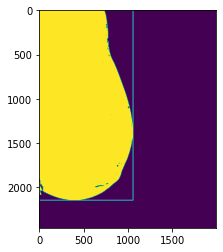

BoundingBox(x1=0, y1=0, x2=1060, y2=2143)
/home/robert/data/DBT/train/DBT-P03218_DBT-S04050_lmlo_35.png


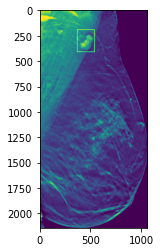

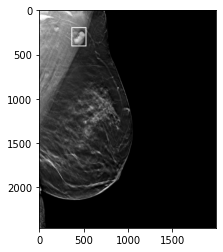

PatientID                                                  DBT-P03218
StudyUID                                                   DBT-S04050
View                                                             lmlo
Subject                                                             0
Slice                                                              56
X                                                                 467
Y                                                                1262
Width                                                             197
Height                                                            215
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03218/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03218/1.2.826...
Name: 163, dtype: object
<class 'numpy.ndarray'>
DBT-P03218_DBT-S04050_lmlo_56.png
dimensi

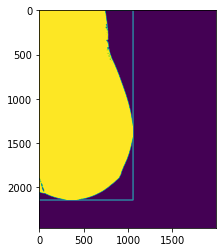

BoundingBox(x1=0, y1=0, x2=1060, y2=2141)
/home/robert/data/DBT/train/DBT-P03218_DBT-S04050_lmlo_56.png


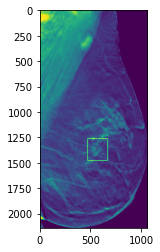

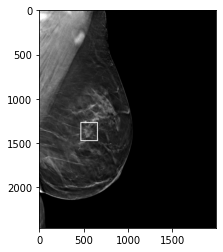

PatientID                                                  DBT-P03222
StudyUID                                                   DBT-S00931
View                                                              rcc
Subject                                                             2
Slice                                                              26
X                                                                1855
Y                                                                 602
Width                                                             139
Height                                                            289
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03222/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03222/1.2.826...
Name: 164, dtype: object
<class 'numpy.ndarray'>
DBT-P03222_DBT-S00931_rcc_26.png
bbox_roi

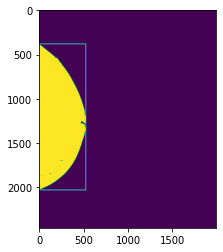

BoundingBox(x1=0, y1=381, x2=527, y2=2027)
/home/robert/data/DBT/train/DBT-P03222_DBT-S00931_rcc_26.png


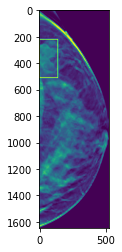

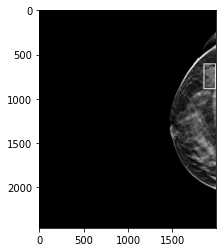

PatientID                                                  DBT-P03222
StudyUID                                                   DBT-S00931
View                                                             rmlo
Subject                                                             2
Slice                                                              14
X                                                                1698
Y                                                                 640
Width                                                             216
Height                                                            245
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03222/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03222/1.2.826...
Name: 165, dtype: object
<class 'numpy.ndarray'>
DBT-P03222_DBT-S00931_rmlo_14.png
bbox_ro

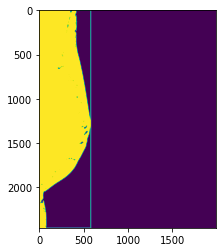

BoundingBox(x1=0, y1=0, x2=583, y2=2457)
/home/robert/data/DBT/train/DBT-P03222_DBT-S00931_rmlo_14.png


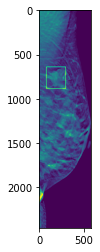

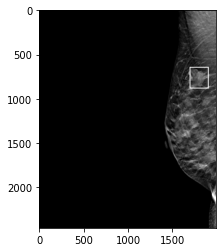

PatientID                                                  DBT-P03292
StudyUID                                                   DBT-S03262
View                                                              lcc
Subject                                                             2
Slice                                                              45
X                                                                 552
Y                                                                1060
Width                                                             417
Height                                                            498
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03292/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03292/1.2.826...
Name: 166, dtype: object
<class 'numpy.ndarray'>
DBT-P03292_DBT-S03262_lcc_45.png
dimensio

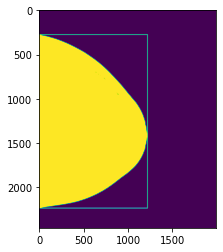

BoundingBox(x1=0, y1=276, x2=1223, y2=2232)
/home/robert/data/DBT/train/DBT-P03292_DBT-S03262_lcc_45.png


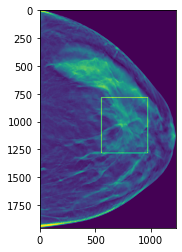

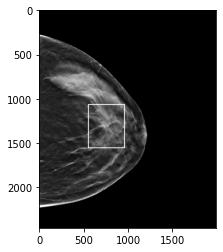

PatientID                                                  DBT-P03292
StudyUID                                                   DBT-S03262
View                                                             lmlo
Subject                                                             2
Slice                                                              38
X                                                                 812
Y                                                                1078
Width                                                             353
Height                                                            456
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03292/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03292/1.2.826...
Name: 167, dtype: object
<class 'numpy.ndarray'>
DBT-P03292_DBT-S03262_lmlo_38.png
dimensi

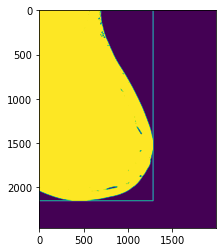

BoundingBox(x1=0, y1=0, x2=1286, y2=2149)
/home/robert/data/DBT/train/DBT-P03292_DBT-S03262_lmlo_38.png


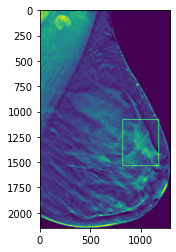

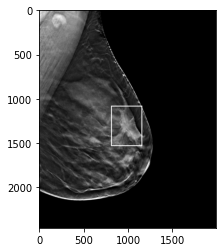

PatientID                                                  DBT-P03423
StudyUID                                                   DBT-S05305
View                                                             rmlo
Subject                                                             0
Slice                                                               6
X                                                                1412
Y                                                                 204
Width                                                             427
Height                                                            402
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03423/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03423/1.2.826...
Name: 168, dtype: object
<class 'numpy.ndarray'>
DBT-P03423_DBT-S05305_rmlo_6.png
bbox_roi

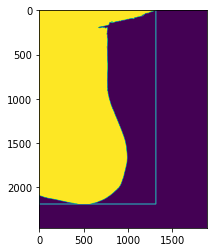

BoundingBox(x1=0, y1=0, x2=1314, y2=2186)
/home/robert/data/DBT/train/DBT-P03423_DBT-S05305_rmlo_6.png


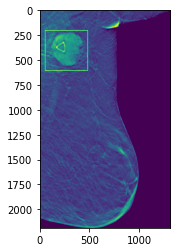

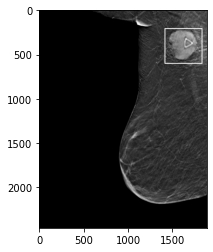

PatientID                                                  DBT-P03423
StudyUID                                                   DBT-S05305
View                                                            rmlo1
Subject                                                             0
Slice                                                              10
X                                                                1219
Y                                                                   0
Width                                                             401
Height                                                            227
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03423/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03423/1.2.826...
Name: 169, dtype: object
<class 'numpy.ndarray'>
DBT-P03423_DBT-S05305_rmlo1_10.png
bbox_r

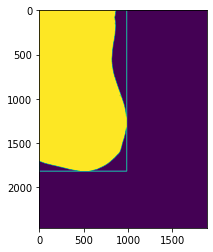

BoundingBox(x1=0, y1=0, x2=986, y2=1816)
/home/robert/data/DBT/train/DBT-P03423_DBT-S05305_rmlo1_10.png


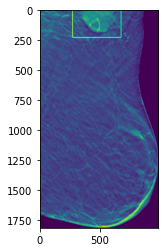

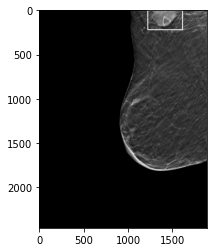

PatientID                                                  DBT-P03458
StudyUID                                                   DBT-S03411
View                                                              lcc
Subject                                                             0
Slice                                                              27
X                                                                 288
Y                                                                 982
Width                                                             233
Height                                                            233
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03458/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03458/1.2.826...
Name: 170, dtype: object
<class 'numpy.ndarray'>
DBT-P03458_DBT-S03411_lcc_27.png
dimensio

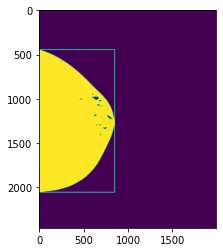

BoundingBox(x1=0, y1=445, x2=852, y2=2053)
/home/robert/data/DBT/train/DBT-P03458_DBT-S03411_lcc_27.png


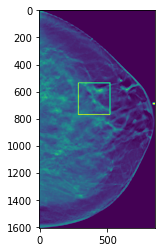

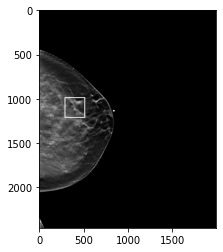

PatientID                                                  DBT-P03539
StudyUID                                                   DBT-S03755
View                                                              lcc
Subject                                                             0
Slice                                                              44
X                                                                 371
Y                                                                1218
Width                                                             300
Height                                                            293
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03539/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03539/1.2.826...
Name: 171, dtype: object
<class 'numpy.ndarray'>
DBT-P03539_DBT-S03755_lcc_44.png
dimensio

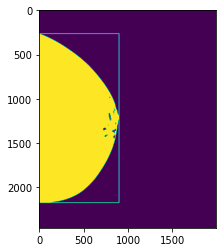

BoundingBox(x1=0, y1=265, x2=902, y2=2170)
/home/robert/data/DBT/train/DBT-P03539_DBT-S03755_lcc_44.png


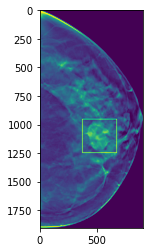

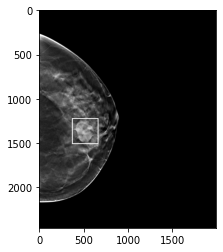

PatientID                                                  DBT-P03539
StudyUID                                                   DBT-S03755
View                                                             lmlo
Subject                                                             0
Slice                                                              46
X                                                                 527
Y                                                                 966
Width                                                             337
Height                                                            405
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03539/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03539/1.2.826...
Name: 172, dtype: object
<class 'numpy.ndarray'>
DBT-P03539_DBT-S03755_lmlo_46.png
dimensi

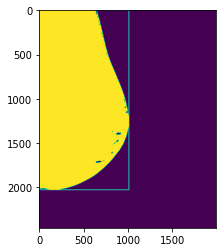

BoundingBox(x1=0, y1=0, x2=1013, y2=2025)
/home/robert/data/DBT/train/DBT-P03539_DBT-S03755_lmlo_46.png


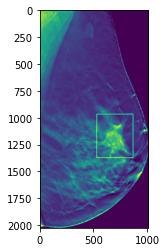

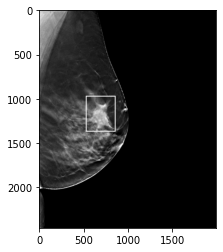

PatientID                                                  DBT-P03658
StudyUID                                                   DBT-S05241
View                                                              lcc
Subject                                                             2
Slice                                                              15
X                                                                 680
Y                                                                1341
Width                                                             102
Height                                                            108
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03658/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03658/1.2.826...
Name: 173, dtype: object
<class 'numpy.ndarray'>
DBT-P03658_DBT-S05241_lcc_15.png
dimensio

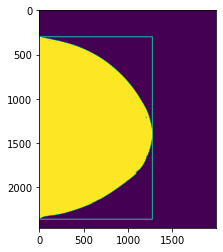

BoundingBox(x1=0, y1=301, x2=1278, y2=2357)
/home/robert/data/DBT/train/DBT-P03658_DBT-S05241_lcc_15.png


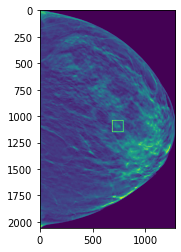

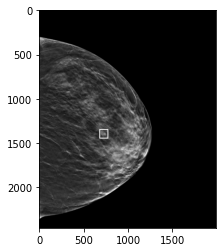

PatientID                                                  DBT-P03658
StudyUID                                                   DBT-S05241
View                                                              rcc
Subject                                                             2
Slice                                                               5
X                                                                1185
Y                                                                1245
Width                                                             103
Height                                                            115
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03658/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03658/1.2.826...
Name: 174, dtype: object
<class 'numpy.ndarray'>
DBT-P03658_DBT-S05241_rcc_5.png
bbox_roi 

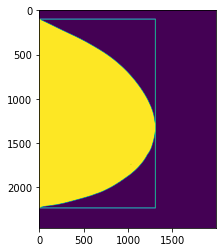

BoundingBox(x1=0, y1=102, x2=1312, y2=2230)
/home/robert/data/DBT/train/DBT-P03658_DBT-S05241_rcc_5.png


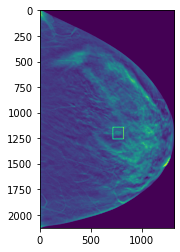

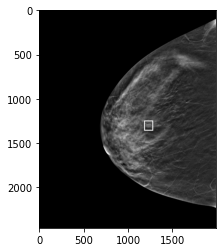

PatientID                                                  DBT-P03658
StudyUID                                                   DBT-S05241
View                                                             rmlo
Subject                                                             2
Slice                                                              10
X                                                                1265
Y                                                                1691
Width                                                              98
Height                                                            102
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03658/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03658/1.2.826...
Name: 175, dtype: object
<class 'numpy.ndarray'>
DBT-P03658_DBT-S05241_rmlo_10.png
bbox_ro

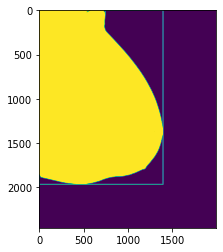

BoundingBox(x1=0, y1=0, x2=1398, y2=1964)
/home/robert/data/DBT/train/DBT-P03658_DBT-S05241_rmlo_10.png


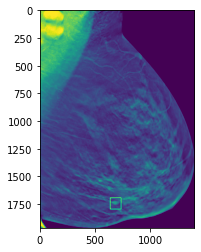

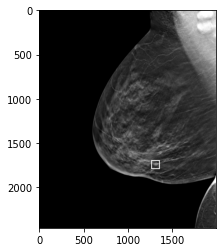

PatientID                                                  DBT-P03677
StudyUID                                                   DBT-S00709
View                                                              lcc
Subject                                                             0
Slice                                                              42
X                                                                 258
Y                                                                 995
Width                                                             328
Height                                                            487
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03677/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03677/1.2.826...
Name: 176, dtype: object
<class 'numpy.ndarray'>
DBT-P03677_DBT-S00709_lcc_42.png
dimensio

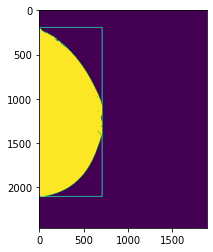

BoundingBox(x1=0, y1=196, x2=710, y2=2101)
/home/robert/data/DBT/train/DBT-P03677_DBT-S00709_lcc_42.png


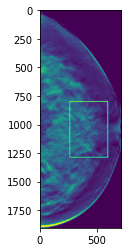

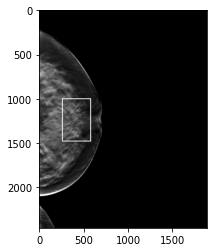

PatientID                                                  DBT-P03677
StudyUID                                                   DBT-S00709
View                                                             lmlo
Subject                                                             0
Slice                                                              33
X                                                                 393
Y                                                                1139
Width                                                             316
Height                                                            376
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03677/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03677/1.2.826...
Name: 177, dtype: object
<class 'numpy.ndarray'>
DBT-P03677_DBT-S00709_lmlo_33.png
dimensi

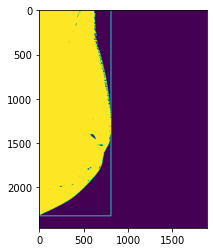

BoundingBox(x1=0, y1=0, x2=809, y2=2319)
/home/robert/data/DBT/train/DBT-P03677_DBT-S00709_lmlo_33.png


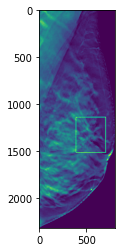

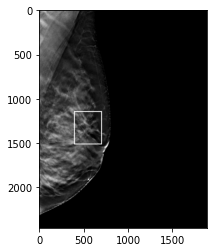

PatientID                                                  DBT-P03677
StudyUID                                                   DBT-S00709
View                                                              rcc
Subject                                                             0
Slice                                                              25
X                                                                1419
Y                                                                1559
Width                                                             470
Height                                                            475
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03677/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03677/1.2.826...
Name: 178, dtype: object
<class 'numpy.ndarray'>
DBT-P03677_DBT-S00709_rcc_25.png
bbox_roi

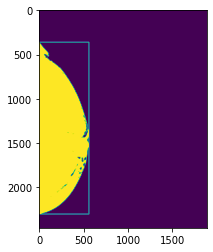

BoundingBox(x1=0, y1=362, x2=561, y2=2299)
/home/robert/data/DBT/train/DBT-P03677_DBT-S00709_rcc_25.png


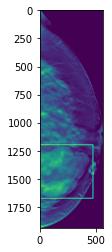

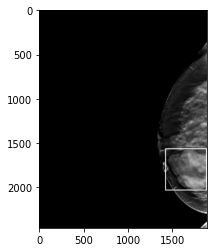

PatientID                                                  DBT-P03677
StudyUID                                                   DBT-S00709
View                                                              rcc
Subject                                                             0
Slice                                                              43
X                                                                1553
Y                                                                1375
Width                                                             321
Height                                                            388
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03677/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03677/1.2.826...
Name: 179, dtype: object
<class 'numpy.ndarray'>
DBT-P03677_DBT-S00709_rcc_43.png
bbox_roi

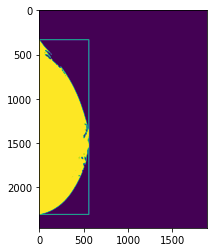

BoundingBox(x1=0, y1=334, x2=560, y2=2303)
/home/robert/data/DBT/train/DBT-P03677_DBT-S00709_rcc_43.png


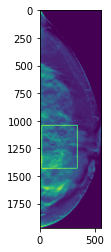

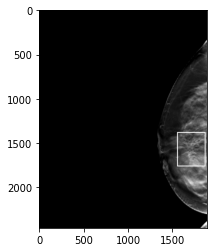

PatientID                                                  DBT-P03677
StudyUID                                                   DBT-S00709
View                                                             rmlo
Subject                                                             0
Slice                                                              32
X                                                                1381
Y                                                                1658
Width                                                             508
Height                                                            488
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03677/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03677/1.2.826...
Name: 180, dtype: object
<class 'numpy.ndarray'>
DBT-P03677_DBT-S00709_rmlo_32.png
bbox_ro

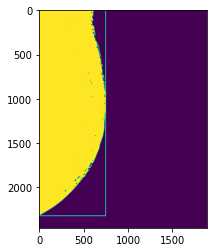

BoundingBox(x1=0, y1=0, x2=749, y2=2318)
/home/robert/data/DBT/train/DBT-P03677_DBT-S00709_rmlo_32.png


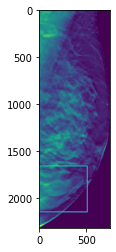

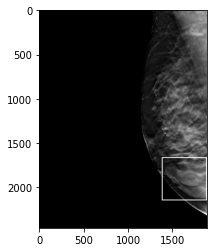

PatientID                                                  DBT-P03677
StudyUID                                                   DBT-S00709
View                                                             rmlo
Subject                                                             0
Slice                                                              47
X                                                                1339
Y                                                                1024
Width                                                             482
Height                                                            442
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03677/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03677/1.2.826...
Name: 181, dtype: object
<class 'numpy.ndarray'>
DBT-P03677_DBT-S00709_rmlo_47.png
bbox_ro

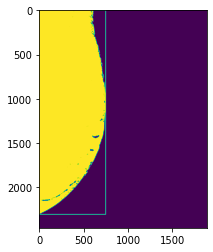

BoundingBox(x1=0, y1=0, x2=749, y2=2303)
/home/robert/data/DBT/train/DBT-P03677_DBT-S00709_rmlo_47.png


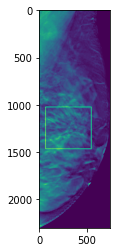

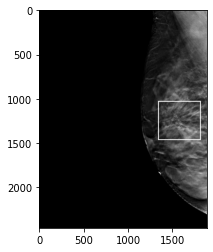

PatientID                                                  DBT-P03748
StudyUID                                                   DBT-S02094
View                                                              lcc
Subject                                                             0
Slice                                                              45
X                                                                 118
Y                                                                1656
Width                                                             168
Height                                                            188
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03748/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03748/1.2.826...
Name: 182, dtype: object
<class 'numpy.ndarray'>
DBT-P03748_DBT-S02094_lcc_45.png
dimensio

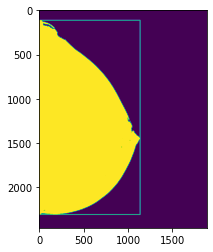

BoundingBox(x1=0, y1=115, x2=1137, y2=2304)
/home/robert/data/DBT/train/DBT-P03748_DBT-S02094_lcc_45.png


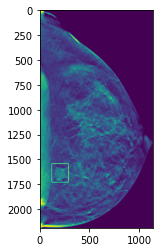

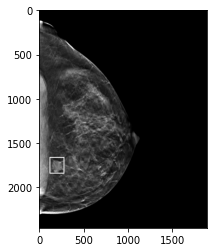

PatientID                                                  DBT-P03748
StudyUID                                                   DBT-S02094
View                                                             lmlo
Subject                                                             0
Slice                                                              42
X                                                                  30
Y                                                                 948
Width                                                             158
Height                                                            215
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03748/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03748/1.2.826...
Name: 183, dtype: object
<class 'numpy.ndarray'>
DBT-P03748_DBT-S02094_lmlo_42.png
dimensi

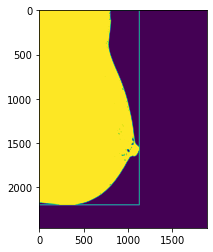

BoundingBox(x1=0, y1=0, x2=1128, y2=2195)
/home/robert/data/DBT/train/DBT-P03748_DBT-S02094_lmlo_42.png


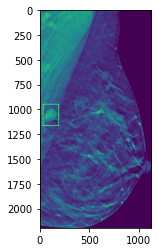

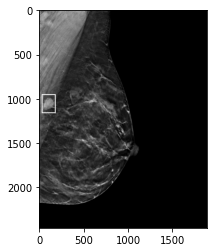

PatientID                                                  DBT-P03816
StudyUID                                                   DBT-S03888
View                                                              rcc
Subject                                                             0
Slice                                                              45
X                                                                1806
Y                                                                1335
Width                                                             178
Height                                                            193
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03816/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03816/1.2.826...
Name: 184, dtype: object
<class 'numpy.ndarray'>
DBT-P03816_DBT-S03888_rcc_45.png
bbox_roi

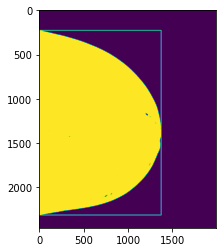

BoundingBox(x1=0, y1=229, x2=1377, y2=2310)
/home/robert/data/DBT/train/DBT-P03816_DBT-S03888_rcc_45.png


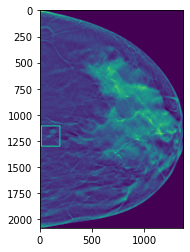

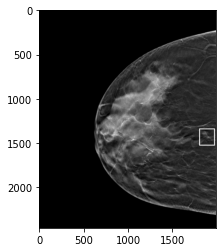

PatientID                                                  DBT-P03816
StudyUID                                                   DBT-S03888
View                                                             rmlo
Subject                                                             0
Slice                                                              58
X                                                                1353
Y                                                                 894
Width                                                             236
Height                                                            152
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03816/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03816/1.2.826...
Name: 185, dtype: object
<class 'numpy.ndarray'>
DBT-P03816_DBT-S03888_rmlo_58.png
bbox_ro

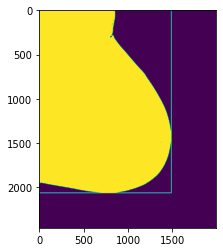

BoundingBox(x1=0, y1=0, x2=1492, y2=2060)
/home/robert/data/DBT/train/DBT-P03816_DBT-S03888_rmlo_58.png


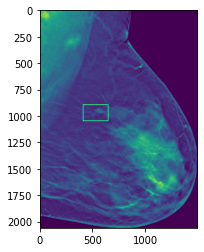

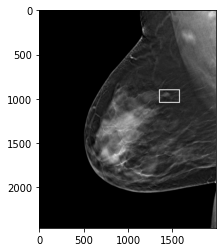

PatientID                                                  DBT-P03915
StudyUID                                                   DBT-S05004
View                                                              lcc
Subject                                                             2
Slice                                                              25
X                                                                 417
Y                                                                1039
Width                                                             235
Height                                                            256
Class                                                          cancer
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03915/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03915/1.2.826...
Name: 186, dtype: object
<class 'numpy.ndarray'>
DBT-P03915_DBT-S05004_lcc_25.png
dimensio

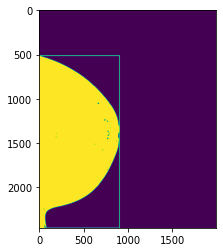

BoundingBox(x1=0, y1=513, x2=907, y2=2457)
/home/robert/data/DBT/train/DBT-P03915_DBT-S05004_lcc_25.png


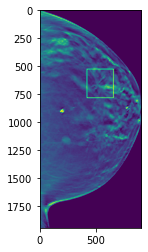

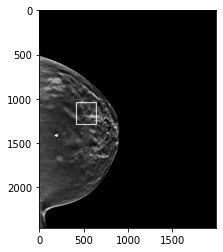

PatientID                                                  DBT-P03978
StudyUID                                                   DBT-S00442
View                                                              rcc
Subject                                                             0
Slice                                                              24
X                                                                1592
Y                                                                 667
Width                                                             281
Height                                                            221
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03978/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03978/1.2.826...
Name: 187, dtype: object
<class 'numpy.ndarray'>
DBT-P03978_DBT-S00442_rcc_24.png
bbox_roi

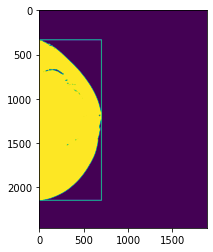

BoundingBox(x1=0, y1=335, x2=702, y2=2144)
/home/robert/data/DBT/train/DBT-P03978_DBT-S00442_rcc_24.png


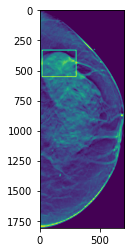

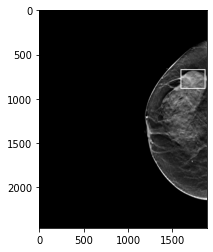

PatientID                                                  DBT-P03978
StudyUID                                                   DBT-S00442
View                                                             rmlo
Subject                                                             0
Slice                                                              10
X                                                                1324
Y                                                                 819
Width                                                             405
Height                                                            264
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P03978/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P03978/1.2.826...
Name: 188, dtype: object
<class 'numpy.ndarray'>
DBT-P03978_DBT-S00442_rmlo_10.png
bbox_ro

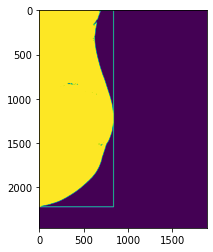

BoundingBox(x1=0, y1=0, x2=838, y2=2217)
/home/robert/data/DBT/train/DBT-P03978_DBT-S00442_rmlo_10.png


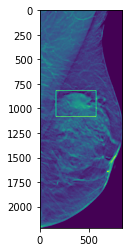

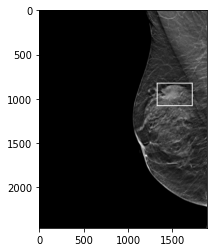

PatientID                                                  DBT-P04026
StudyUID                                                   DBT-S01650
View                                                             rcc1
Subject                                                             2
Slice                                                              20
X                                                                1640
Y                                                                1074
Width                                                             176
Height                                                            160
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P04026/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P04026/1.2.826...
Name: 189, dtype: object
<class 'numpy.ndarray'>
DBT-P04026_DBT-S01650_rcc1_20.png
bbox_ro

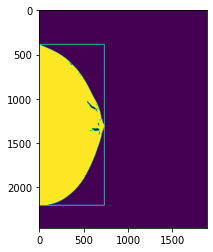

BoundingBox(x1=0, y1=387, x2=735, y2=2200)
/home/robert/data/DBT/train/DBT-P04026_DBT-S01650_rcc1_20.png


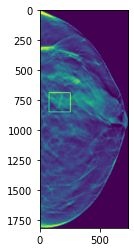

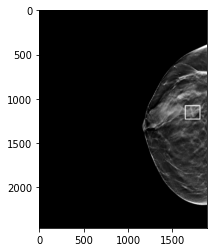

PatientID                                                  DBT-P04026
StudyUID                                                   DBT-S01650
View                                                             rmlo
Subject                                                             2
Slice                                                              18
X                                                                1532
Y                                                                1382
Width                                                             155
Height                                                            139
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P04026/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P04026/1.2.826...
Name: 190, dtype: object
<class 'numpy.ndarray'>
DBT-P04026_DBT-S01650_rmlo_18.png
bbox_ro

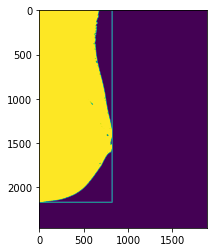

BoundingBox(x1=0, y1=0, x2=822, y2=2166)
/home/robert/data/DBT/train/DBT-P04026_DBT-S01650_rmlo_18.png


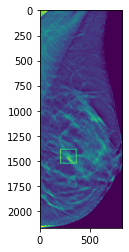

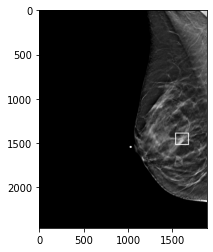

PatientID                                                  DBT-P04090
StudyUID                                                   DBT-S01718
View                                                              rcc
Subject                                                             2
Slice                                                              63
X                                                                1368
Y                                                                1342
Width                                                             120
Height                                                            133
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P04090/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P04090/1.2.826...
Name: 191, dtype: object
<class 'numpy.ndarray'>
DBT-P04090_DBT-S01718_rcc_63.png
bbox_roi

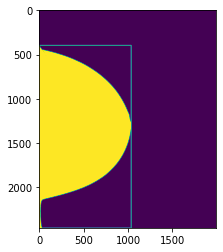

BoundingBox(x1=0, y1=398, x2=1039, y2=2457)
/home/robert/data/DBT/train/DBT-P04090_DBT-S01718_rcc_63.png


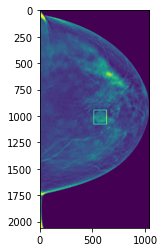

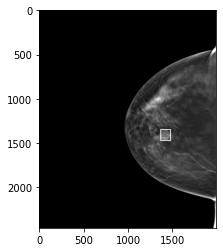

PatientID                                                  DBT-P04090
StudyUID                                                   DBT-S01718
View                                                             rmlo
Subject                                                             2
Slice                                                              59
X                                                                1212
Y                                                                 825
Width                                                             134
Height                                                            125
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P04090/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P04090/1.2.826...
Name: 192, dtype: object
<class 'numpy.ndarray'>
DBT-P04090_DBT-S01718_rmlo_59.png
bbox_ro

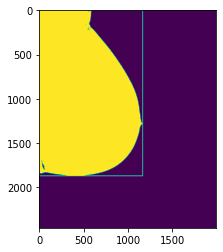

BoundingBox(x1=0, y1=0, x2=1168, y2=1868)
/home/robert/data/DBT/train/DBT-P04090_DBT-S01718_rmlo_59.png


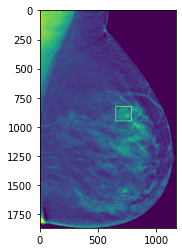

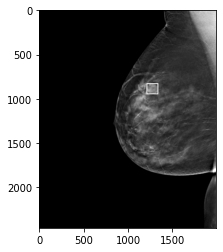

PatientID                                                  DBT-P04116
StudyUID                                                   DBT-S03961
View                                                              rcc
Subject                                                             0
Slice                                                              30
X                                                                1523
Y                                                                 560
Width                                                             240
Height                                                            228
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P04116/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P04116/1.2.826...
Name: 193, dtype: object
<class 'numpy.ndarray'>
DBT-P04116_DBT-S03961_rcc_30.png
bbox_roi

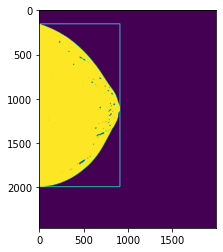

BoundingBox(x1=0, y1=155, x2=912, y2=1990)
/home/robert/data/DBT/train/DBT-P04116_DBT-S03961_rcc_30.png


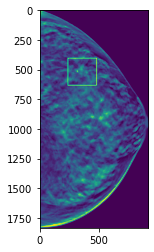

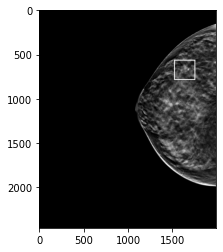

PatientID                                                  DBT-P04116
StudyUID                                                   DBT-S03961
View                                                             rmlo
Subject                                                             0
Slice                                                              18
X                                                                1271
Y                                                                1331
Width                                                             284
Height                                                            245
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P04116/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P04116/1.2.826...
Name: 194, dtype: object
<class 'numpy.ndarray'>
DBT-P04116_DBT-S03961_rmlo_18.png
bbox_ro

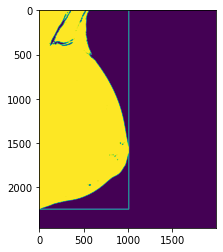

BoundingBox(x1=0, y1=0, x2=1012, y2=2244)
/home/robert/data/DBT/train/DBT-P04116_DBT-S03961_rmlo_18.png


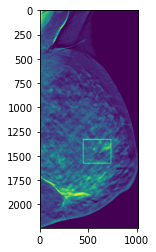

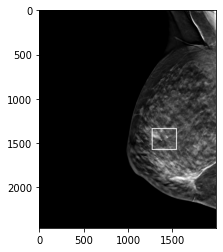

PatientID                                                  DBT-P04326
StudyUID                                                   DBT-S03750
View                                                              lcc
Subject                                                             0
Slice                                                              12
X                                                                   8
Y                                                                1093
Width                                                             168
Height                                                            462
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P04326/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P04326/1.2.826...
Name: 195, dtype: object
<class 'numpy.ndarray'>
DBT-P04326_DBT-S03750_lcc_12.png
dimensio

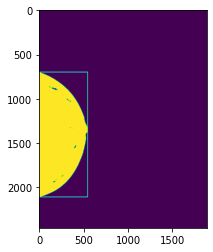

BoundingBox(x1=0, y1=699, x2=546, y2=2106)
/home/robert/data/DBT/train/DBT-P04326_DBT-S03750_lcc_12.png


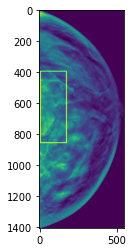

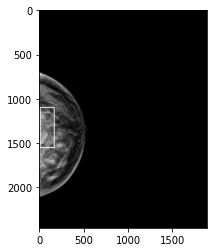

PatientID                                                  DBT-P04326
StudyUID                                                   DBT-S03750
View                                                             lmlo
Subject                                                             0
Slice                                                              29
X                                                                   2
Y                                                                1593
Width                                                             244
Height                                                            462
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P04326/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P04326/1.2.826...
Name: 196, dtype: object
<class 'numpy.ndarray'>
DBT-P04326_DBT-S03750_lmlo_29.png
dimensi

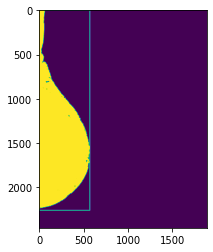

BoundingBox(x1=0, y1=0, x2=571, y2=2257)
/home/robert/data/DBT/train/DBT-P04326_DBT-S03750_lmlo_29.png


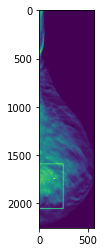

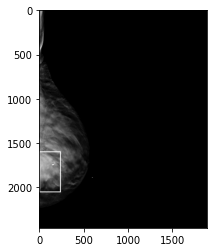

PatientID                                                  DBT-P04372
StudyUID                                                   DBT-S04281
View                                                              lcc
Subject                                                             2
Slice                                                              34
X                                                                 963
Y                                                                1301
Width                                                              84
Height                                                             86
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P04372/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P04372/1.2.826...
Name: 197, dtype: object
<class 'numpy.ndarray'>
DBT-P04372_DBT-S04281_lcc_34.png
dimensio

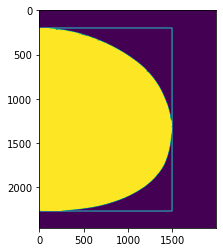

BoundingBox(x1=0, y1=202, x2=1500, y2=2265)
/home/robert/data/DBT/train/DBT-P04372_DBT-S04281_lcc_34.png


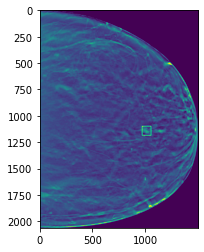

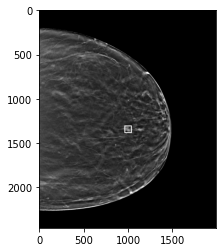

PatientID                                                  DBT-P04372
StudyUID                                                   DBT-S04281
View                                                             lmlo
Subject                                                             2
Slice                                                              39
X                                                                1197
Y                                                                1391
Width                                                             100
Height                                                            157
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P04372/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P04372/1.2.826...
Name: 198, dtype: object
<class 'numpy.ndarray'>
DBT-P04372_DBT-S04281_lmlo_39.png
dimensi

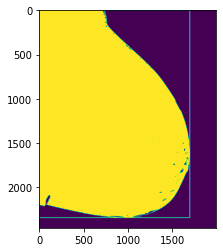

BoundingBox(x1=0, y1=0, x2=1700, y2=2339)
/home/robert/data/DBT/train/DBT-P04372_DBT-S04281_lmlo_39.png


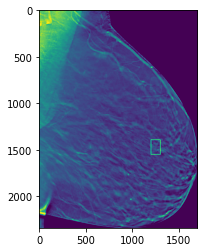

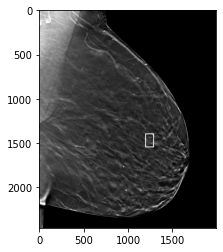

PatientID                                                  DBT-P04429
StudyUID                                                   DBT-S00568
View                                                              lcc
Subject                                                             2
Slice                                                              57
X                                                                 215
Y                                                                 882
Width                                                             379
Height                                                            328
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P04429/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P04429/1.2.826...
Name: 199, dtype: object
<class 'numpy.ndarray'>
DBT-P04429_DBT-S00568_lcc_57.png
dimensio

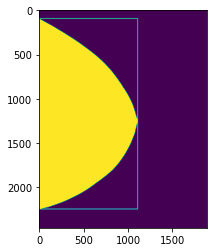

BoundingBox(x1=0, y1=95, x2=1109, y2=2242)
/home/robert/data/DBT/train/DBT-P04429_DBT-S00568_lcc_57.png


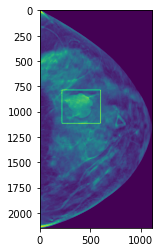

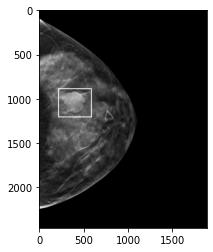

PatientID                                                  DBT-P04429
StudyUID                                                   DBT-S00568
View                                                             lmlo
Subject                                                             2
Slice                                                              34
X                                                                 672
Y                                                                 707
Width                                                             273
Height                                                            290
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P04429/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P04429/1.2.826...
Name: 200, dtype: object
<class 'numpy.ndarray'>
DBT-P04429_DBT-S00568_lmlo_34.png
dimensi

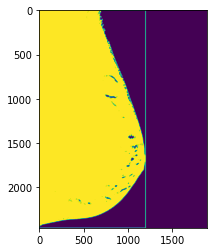

BoundingBox(x1=0, y1=0, x2=1198, y2=2457)
/home/robert/data/DBT/train/DBT-P04429_DBT-S00568_lmlo_34.png


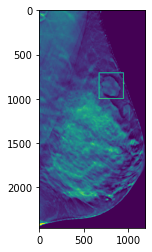

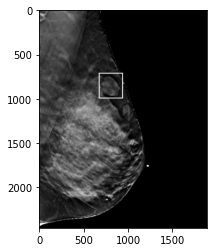

PatientID                                                  DBT-P04631
StudyUID                                                   DBT-S05515
View                                                              lcc
Subject                                                             2
Slice                                                               9
X                                                                 546
Y                                                                1059
Width                                                              84
Height                                                             69
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P04631/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P04631/1.2.826...
Name: 201, dtype: object
<class 'numpy.ndarray'>
DBT-P04631_DBT-S05515_lcc_9.png
dimension

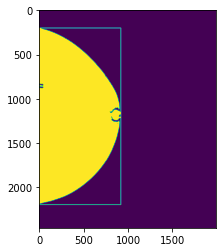

BoundingBox(x1=0, y1=202, x2=922, y2=2192)
/home/robert/data/DBT/train/DBT-P04631_DBT-S05515_lcc_9.png


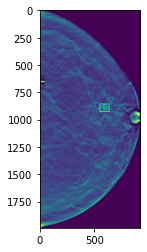

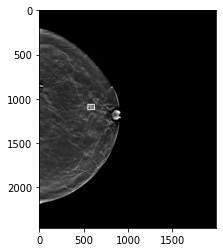

PatientID                                                  DBT-P04631
StudyUID                                                   DBT-S05515
View                                                             lmlo
Subject                                                             2
Slice                                                              18
X                                                                 692
Y                                                                1761
Width                                                              58
Height                                                             86
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P04631/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P04631/1.2.826...
Name: 202, dtype: object
<class 'numpy.ndarray'>
DBT-P04631_DBT-S05515_lmlo_18.png
dimensi

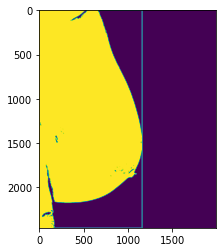

BoundingBox(x1=0, y1=0, x2=1162, y2=2457)
/home/robert/data/DBT/train/DBT-P04631_DBT-S05515_lmlo_18.png


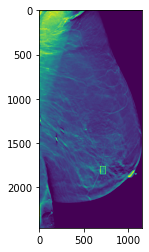

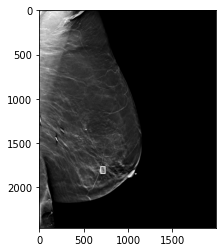

PatientID                                                  DBT-P04710
StudyUID                                                   DBT-S03227
View                                                              rcc
Subject                                                             0
Slice                                                              19
X                                                                1420
Y                                                                1431
Width                                                             497
Height                                                            318
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P04710/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P04710/1.2.826...
Name: 203, dtype: object
<class 'numpy.ndarray'>
DBT-P04710_DBT-S03227_rcc_19.png
bbox_roi

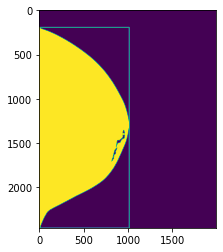

BoundingBox(x1=0, y1=195, x2=1017, y2=2457)
/home/robert/data/DBT/train/DBT-P04710_DBT-S03227_rcc_19.png


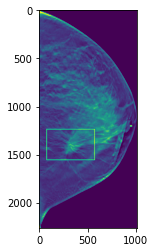

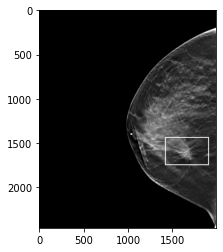

PatientID                                                  DBT-P04710
StudyUID                                                   DBT-S03227
View                                                             rmlo
Subject                                                             0
Slice                                                              42
X                                                                1467
Y                                                                1509
Width                                                             443
Height                                                            364
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P04710/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P04710/1.2.826...
Name: 204, dtype: object
<class 'numpy.ndarray'>
DBT-P04710_DBT-S03227_rmlo_42.png
bbox_ro

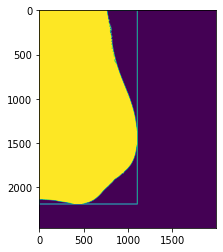

BoundingBox(x1=0, y1=0, x2=1108, y2=2186)
/home/robert/data/DBT/train/DBT-P04710_DBT-S03227_rmlo_42.png


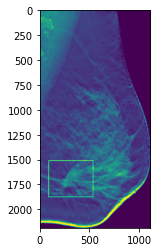

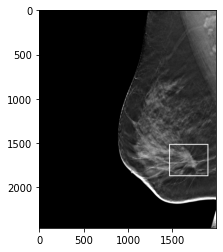

PatientID                                                  DBT-P04721
StudyUID                                                   DBT-S01833
View                                                              lcc
Subject                                                             0
Slice                                                              27
X                                                                 218
Y                                                                1201
Width                                                             196
Height                                                            224
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P04721/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P04721/1.2.826...
Name: 205, dtype: object
<class 'numpy.ndarray'>
DBT-P04721_DBT-S01833_lcc_27.png
dimensio

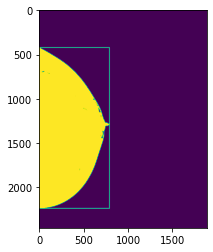

BoundingBox(x1=0, y1=422, x2=792, y2=2235)
/home/robert/data/DBT/train/DBT-P04721_DBT-S01833_lcc_27.png


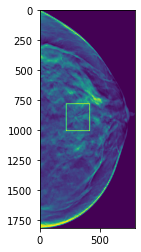

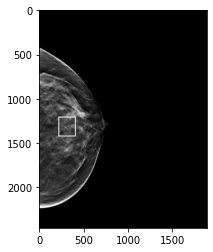

PatientID                                                  DBT-P04721
StudyUID                                                   DBT-S01833
View                                                             lmlo
Subject                                                             0
Slice                                                              24
X                                                                 475
Y                                                                1430
Width                                                             195
Height                                                            172
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P04721/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P04721/1.2.826...
Name: 206, dtype: object
<class 'numpy.ndarray'>
DBT-P04721_DBT-S01833_lmlo_24.png
dimensi

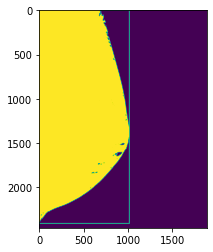

BoundingBox(x1=0, y1=0, x2=1016, y2=2405)
/home/robert/data/DBT/train/DBT-P04721_DBT-S01833_lmlo_24.png


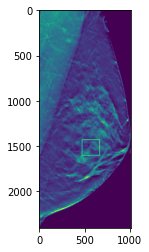

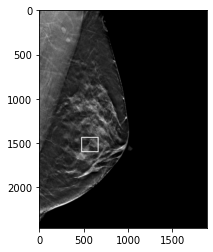

PatientID                                                  DBT-P04750
StudyUID                                                   DBT-S00052
View                                                              rcc
Subject                                                             0
Slice                                                              15
X                                                                1322
Y                                                                 730
Width                                                             194
Height                                                            163
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P04750/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P04750/1.2.826...
Name: 207, dtype: object
<class 'numpy.ndarray'>
DBT-P04750_DBT-S00052_rcc_15.png
bbox_roi

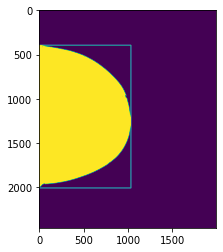

BoundingBox(x1=0, y1=396, x2=1036, y2=2005)
/home/robert/data/DBT/train/DBT-P04750_DBT-S00052_rcc_15.png


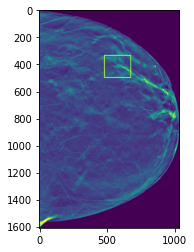

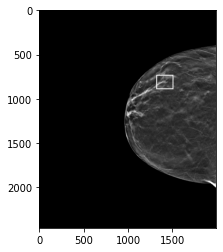

PatientID                                                  DBT-P04818
StudyUID                                                   DBT-S02975
View                                                              rcc
Subject                                                             2
Slice                                                              27
X                                                                1515
Y                                                                 930
Width                                                             145
Height                                                            183
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P04818/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P04818/1.2.826...
Name: 208, dtype: object
<class 'numpy.ndarray'>
DBT-P04818_DBT-S02975_rcc_27.png
bbox_roi

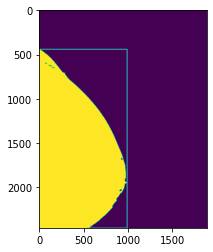

BoundingBox(x1=0, y1=442, x2=991, y2=2457)
/home/robert/data/DBT/train/DBT-P04818_DBT-S02975_rcc_27.png


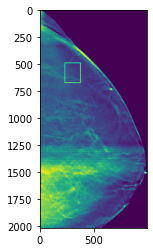

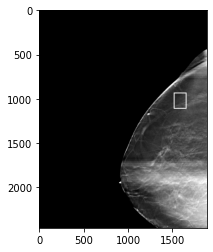

PatientID                                                  DBT-P04818
StudyUID                                                   DBT-S02975
View                                                             rmlo
Subject                                                             2
Slice                                                              26
X                                                                1510
Y                                                                1211
Width                                                             168
Height                                                            173
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P04818/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P04818/1.2.826...
Name: 209, dtype: object
<class 'numpy.ndarray'>
DBT-P04818_DBT-S02975_rmlo_26.png
bbox_ro

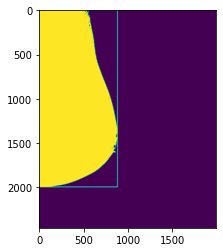

BoundingBox(x1=0, y1=0, x2=884, y2=1993)
/home/robert/data/DBT/train/DBT-P04818_DBT-S02975_rmlo_26.png


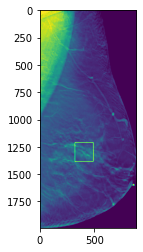

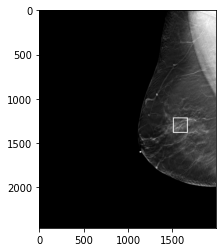

PatientID                                                  DBT-P04858
StudyUID                                                   DBT-S04555
View                                                             lmlo
Subject                                                             0
Slice                                                              18
X                                                                 448
Y                                                                1244
Width                                                             179
Height                                                            139
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P04858/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P04858/1.2.826...
Name: 210, dtype: object
<class 'numpy.ndarray'>
DBT-P04858_DBT-S04555_lmlo_18.png
dimensi

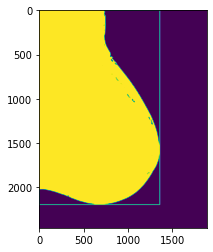

BoundingBox(x1=0, y1=0, x2=1358, y2=2192)
/home/robert/data/DBT/train/DBT-P04858_DBT-S04555_lmlo_18.png


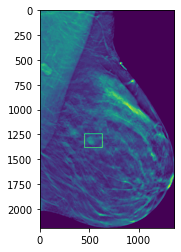

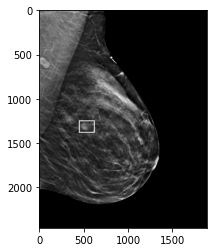

PatientID                                                  DBT-P04858
StudyUID                                                   DBT-S04555
View                                                              rcc
Subject                                                             0
Slice                                                              31
X                                                                1258
Y                                                                1992
Width                                                             112
Height                                                             90
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P04858/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P04858/1.2.826...
Name: 211, dtype: object
<class 'numpy.ndarray'>
DBT-P04858_DBT-S04555_rcc_31.png
bbox_roi

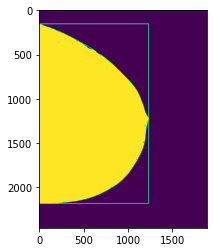

BoundingBox(x1=0, y1=155, x2=1232, y2=2180)
/home/robert/data/DBT/train/DBT-P04858_DBT-S04555_rcc_31.png


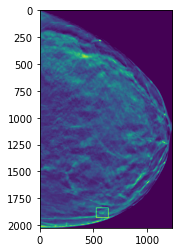

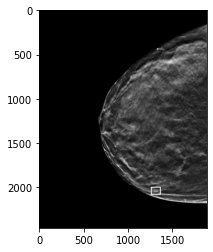

PatientID                                                  DBT-P04901
StudyUID                                                   DBT-S05032
View                                                              rcc
Subject                                                             0
Slice                                                              35
X                                                                1534
Y                                                                 961
Width                                                             326
Height                                                            375
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P04901/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P04901/1.2.826...
Name: 212, dtype: object
<class 'numpy.ndarray'>
DBT-P04901_DBT-S05032_rcc_35.png
bbox_roi

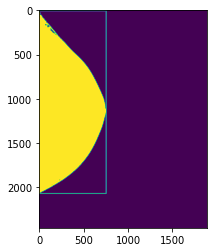

BoundingBox(x1=0, y1=8, x2=755, y2=2067)
/home/robert/data/DBT/train/DBT-P04901_DBT-S05032_rcc_35.png


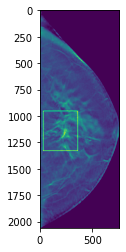

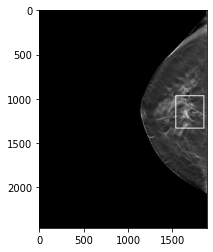

PatientID                                                  DBT-P04901
StudyUID                                                   DBT-S05032
View                                                             rmlo
Subject                                                             0
Slice                                                              35
X                                                                1252
Y                                                                1064
Width                                                             449
Height                                                            366
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P04901/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P04901/1.2.826...
Name: 213, dtype: object
<class 'numpy.ndarray'>
DBT-P04901_DBT-S05032_rmlo_35.png
bbox_ro

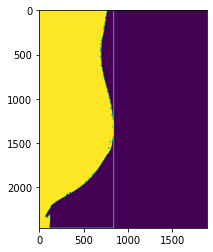

BoundingBox(x1=0, y1=0, x2=839, y2=2457)
/home/robert/data/DBT/train/DBT-P04901_DBT-S05032_rmlo_35.png


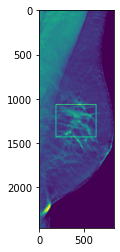

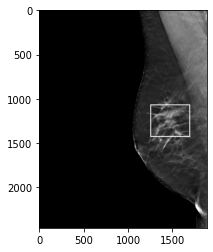

PatientID                                                  DBT-P05014
StudyUID                                                   DBT-S04931
View                                                              rcc
Subject                                                             0
Slice                                                              29
X                                                                1256
Y                                                                 705
Width                                                             297
Height                                                            216
Class                                                          cancer
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P05014/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P05014/1.2.826...
Name: 214, dtype: object
<class 'numpy.ndarray'>
DBT-P05014_DBT-S04931_rcc_29.png
bbox_roi

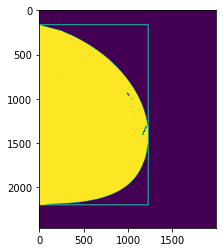

BoundingBox(x1=0, y1=165, x2=1231, y2=2195)
/home/robert/data/DBT/train/DBT-P05014_DBT-S04931_rcc_29.png


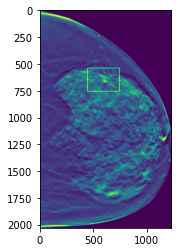

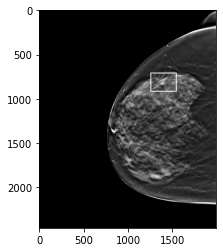

PatientID                                                  DBT-P05014
StudyUID                                                   DBT-S04931
View                                                             rmlo
Subject                                                             0
Slice                                                              18
X                                                                1231
Y                                                                1152
Width                                                             253
Height                                                            203
Class                                                          cancer
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P05014/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P05014/1.2.826...
Name: 215, dtype: object
<class 'numpy.ndarray'>
DBT-P05014_DBT-S04931_rmlo_18.png
bbox_ro

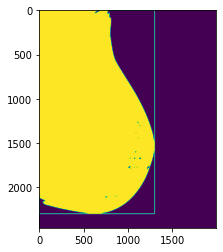

BoundingBox(x1=0, y1=0, x2=1303, y2=2295)
/home/robert/data/DBT/train/DBT-P05014_DBT-S04931_rmlo_18.png


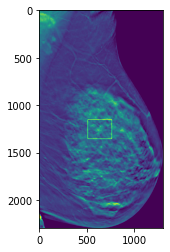

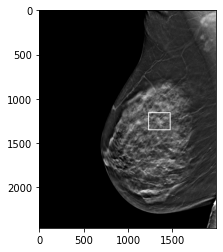

PatientID                                                  DBT-P05022
StudyUID                                                   DBT-S05195
View                                                              rcc
Subject                                                             0
Slice                                                              30
X                                                                1655
Y                                                                1460
Width                                                             251
Height                                                            176
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P05022/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P05022/1.2.826...
Name: 216, dtype: object
<class 'numpy.ndarray'>
DBT-P05022_DBT-S05195_rcc_30.png
bbox_roi

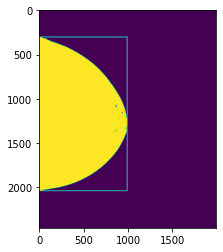

BoundingBox(x1=0, y1=303, x2=994, y2=2036)
/home/robert/data/DBT/train/DBT-P05022_DBT-S05195_rcc_30.png


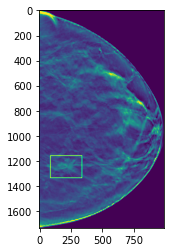

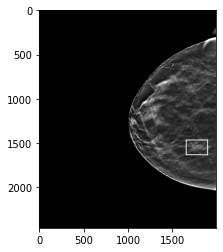

PatientID                                                  DBT-P05022
StudyUID                                                   DBT-S05195
View                                                             rmlo
Subject                                                             0
Slice                                                              35
X                                                                1634
Y                                                                1271
Width                                                             236
Height                                                            207
Class                                                          benign
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P05022/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P05022/1.2.826...
Name: 217, dtype: object
<class 'numpy.ndarray'>
DBT-P05022_DBT-S05195_rmlo_35.png
bbox_ro

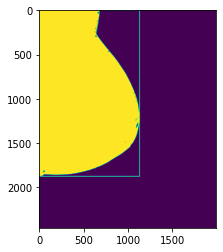

BoundingBox(x1=0, y1=0, x2=1133, y2=1874)
/home/robert/data/DBT/train/DBT-P05022_DBT-S05195_rmlo_35.png


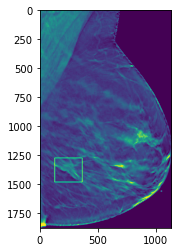

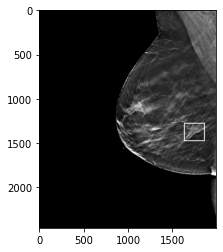

PatientID                                                  DBT-P05030
StudyUID                                                   DBT-S05569
View                                                              rcc
Subject                                                             2
Slice                                                              28
X                                                                1737
Y                                                                 698
Width                                                             123
Height                                                            121
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P05030/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P05030/1.2.826...
Name: 218, dtype: object
<class 'numpy.ndarray'>
DBT-P05030_DBT-S05569_rcc_28.png
bbox_roi

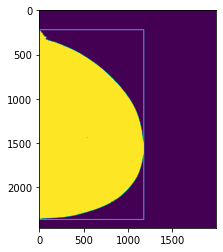

BoundingBox(x1=0, y1=221, x2=1181, y2=2360)
/home/robert/data/DBT/train/DBT-P05030_DBT-S05569_rcc_28.png


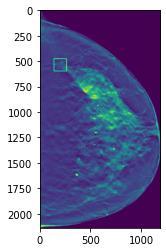

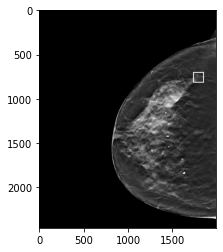

PatientID                                                  DBT-P05030
StudyUID                                                   DBT-S05569
View                                                             rmlo
Subject                                                             2
Slice                                                              24
X                                                                1465
Y                                                                 624
Width                                                              84
Height                                                            115
Class                                                          cancer
AD                                                                  0
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P05030/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P05030/1.2.826...
Name: 219, dtype: object
<class 'numpy.ndarray'>
DBT-P05030_DBT-S05569_rmlo_24.png
bbox_ro

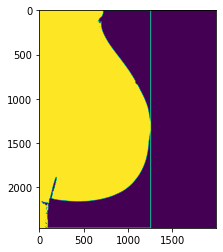

BoundingBox(x1=0, y1=0, x2=1258, y2=2457)
/home/robert/data/DBT/train/DBT-P05030_DBT-S05569_rmlo_24.png


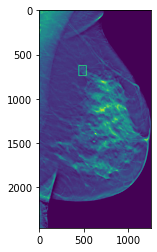

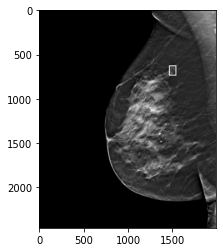

PatientID                                                  DBT-P05047
StudyUID                                                   DBT-S05588
View                                                              rcc
Subject                                                             0
Slice                                                              41
X                                                                1341
Y                                                                1073
Width                                                             387
Height                                                            499
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P05047/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P05047/1.2.826...
Name: 220, dtype: object
<class 'numpy.ndarray'>
DBT-P05047_DBT-S05588_rcc_41.png
bbox_roi

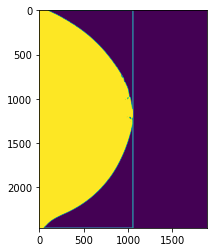

BoundingBox(x1=0, y1=0, x2=1056, y2=2457)
/home/robert/data/DBT/train/DBT-P05047_DBT-S05588_rcc_41.png


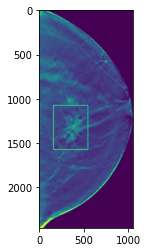

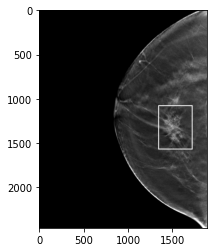

PatientID                                                  DBT-P05047
StudyUID                                                   DBT-S05588
View                                                             rmlo
Subject                                                             0
Slice                                                              41
X                                                                1192
Y                                                                1019
Width                                                             456
Height                                                            541
Class                                                          benign
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P05047/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P05047/1.2.826...
Name: 221, dtype: object
<class 'numpy.ndarray'>
DBT-P05047_DBT-S05588_rmlo_41.png
bbox_ro

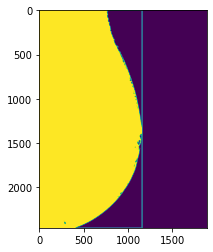

BoundingBox(x1=0, y1=0, x2=1159, y2=2457)
/home/robert/data/DBT/train/DBT-P05047_DBT-S05588_rmlo_41.png


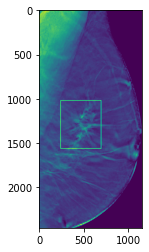

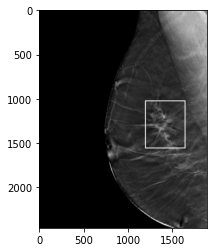

PatientID                                                  DBT-P05056
StudyUID                                                   DBT-S01839
View                                                              rcc
Subject                                                             0
Slice                                                              44
X                                                                1642
Y                                                                 661
Width                                                             245
Height                                                            392
Class                                                          cancer
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P05056/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P05056/1.2.826...
Name: 222, dtype: object
<class 'numpy.ndarray'>
DBT-P05056_DBT-S01839_rcc_44.png
bbox_roi

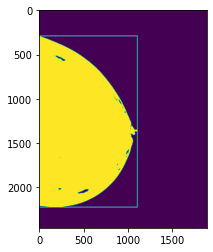

BoundingBox(x1=0, y1=291, x2=1106, y2=2221)
/home/robert/data/DBT/train/DBT-P05056_DBT-S01839_rcc_44.png


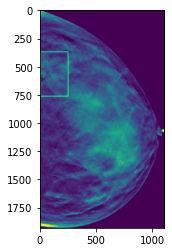

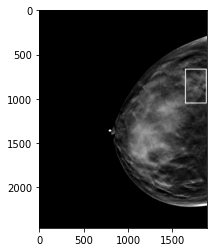

PatientID                                                  DBT-P05056
StudyUID                                                   DBT-S01839
View                                                             rmlo
Subject                                                             0
Slice                                                              22
X                                                                1167
Y                                                                 499
Width                                                             439
Height                                                            315
Class                                                          cancer
AD                                                                  1
descriptive_path    Breast-Cancer-Screening-DBT/DBT-P05056/01-01-2...
classic_path        Breast-Cancer-Screening-DBT/DBT-P05056/1.2.826...
Name: 223, dtype: object
<class 'numpy.ndarray'>
DBT-P05056_DBT-S01839_rmlo_22.png
bbox_ro

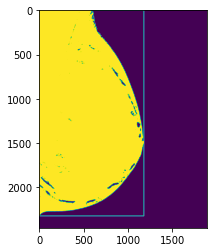

BoundingBox(x1=0, y1=0, x2=1179, y2=2320)
/home/robert/data/DBT/train/DBT-P05056_DBT-S01839_rmlo_22.png


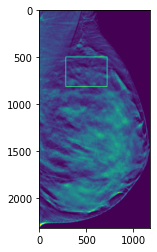

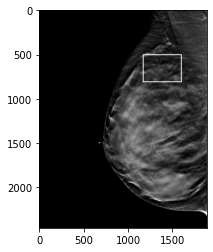

In [16]:
for index,box_series in df.iterrows():
    print(box_series)
    view = box_series["View"]
    slice_index = box_series["Slice"]
    # if you have image data saved in classic path folder structure, read the file path from "classic_path"
    # image_path = os.path.join("/data", view_series["classic_path"])
    image_path = os.path.join(base_path, box_series["descriptive_path"])
    
    image = dcmread_image(fp=image_path, view=view, index=slice_index)
    image_org = np.copy(image)
    x, y, w, h = box_series[["X", "Y", "Width", "Height"]]
    bbox = omidb.mark.BoundingBox(x, y, x+w, y+h)
    client = box_series["PatientID"]
    episode = box_series["StudyUID"]
    side = view[0]
    print(type(image))
    copy_case(view,client , episode,image,side, bbox, slice_index)
    #print(view,client , episode,image,side, bbox)
    
    image_org = draw_box(image=image_org, x=x, y=y, width=w, height=h, lw=10)
    
    plt.imshow(image_org, cmap=plt.cm.gray);
    plt.show()